# 라이브러리 호출

In [1]:

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import re
import koreanize_matplotlib
from sklearn.model_selection import train_test_split, RandomizedSearchCV, GridSearchCV, cross_val_score
from sklearn.preprocessing import LabelEncoder, MinMaxScaler, StandardScaler, RobustScaler
from sklearn.linear_model import LogisticRegression, LinearRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, recall_score, precision_score, f1_score
from sklearn.feature_selection import f_regression, SelectKBest, SequentialFeatureSelector

from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dropout, Flatten, Dense, SimpleRNN
from tensorflow.keras.callbacks import EarlyStopping

import statsmodels.api as sm

import optuna
from optuna import Trial, visualization
from optuna.samplers import TPESampler

from datetime import datetime, date

import xgboost as xgb
import catboost as cb
import lightgbm as lgbm

# 파일 호출

In [2]:
five = pd.read_csv("G:/내 드라이브/Project/FINAL/data_preprocessing/찐찐최종/final_5_.csv")
ten = pd.read_csv("G:/내 드라이브/Project/FINAL/data_preprocessing/찐찐최종/new_turn_10_genre_add.csv")

# 정의한 함수들

* 아래 함수들은 EDA 과정에서 많이 쓰이는 코드들이라 함수로 지정을 해두었다.

In [7]:
# 5회차까지 모든 지표 평균 지수 추가

def df_average_5(df):
    df["avg_rate"] = (df["rating_1"] + df["rating_2"] + df["rating_3"] + df["rating_4"] + df["rating_5"])/5
    df["avg_view"] = (df["view_1"] + df["view_2"] + df["view_3"] + df["view_4"] + df["view_5"])/5
    df["avg_people"] = (df["people_1"] + df["people_2"] + df["people_3"] + df["people_4"] + df["people_5"])/5
    df["avg_fav"] = (df["turnfav_1"] + df["turnfav_2"] + df["turnfav_3"] + df["turnfav_4"] + df["turnfav_5"])/5
    df["avg_commentCount"] = (df["commentCount_1"] + df["commentCount_2"] + df["commentCount_3"] + df["commentCount_4"] + df["commentCount_5"])/5
    df["total_recoSum"] = df["reco_sum_1"] + df["reco_sum_2"] + df["reco_sum_3"] + df["reco_sum_4"] + df["reco_sum_5"]
    df["total_unrecoSum"] = df["unreco_sum_1"] + df["unreco_sum_2"] + df["unreco_sum_3"] + df["unreco_sum_4"] + df["unreco_sum_5"]
    df["avg_recoSum"] = (df["reco_sum_1"] + df["reco_sum_2"] + df["reco_sum_3"] + df["reco_sum_4"] + df["reco_sum_5"])/5
    df["avg_unrecoSum"] = (df["unreco_sum_1"] + df["unreco_sum_2"] + df["unreco_sum_3"] + df["unreco_sum_4"] + df["unreco_sum_5"])/5
    df["avg_posScoreSum"] = (df["pos_score_sum_1"] + df["pos_score_sum_2"] + df["pos_score_sum_3"] + df["pos_score_sum_4"] + df["pos_score_sum_5"])/5
    df["avg_negScoreSum"] = (df["neg_score_sum_1"] + df["neg_score_sum_2"] + df["neg_score_sum_3"] + df["neg_score_sum_4"] + df["neg_score_sum_5"])/5
    df["avg_negative"] = (df["negative_1"] + df["negative_2"] + df["negative_3"] + df["negative_4"] + df["negative_5"])/5
    df["avg_neutrality"] = (df["neutrality_1"] + df["neutrality_2"] + df["neutrality_3"] + df["neutrality_4"] + df["neutrality_5"])/5
    df["avg_positive"] = (df["positive_1"] + df["positive_2"] + df["positive_3"] + df["positive_4"] + df["positive_5"])/5
    df["avg_negative_rate"] = df["avg_negative"]/(df["avg_negative"] + df["avg_positive"] + df["avg_neutrality"])
    df["avg_neutrality_rate"] = df["avg_neutrality"]/(df["avg_negative"] + df["avg_positive"] + df["avg_neutrality"])
    df["avg_positive_rate"] = df["avg_positive"]/(df["avg_negative"] + df["avg_positive"] + df["avg_neutrality"])

In [8]:
# 10회차까지 모든 지표 평균 지수 추가

def df_average_10(df):
    df["avg_rate"] = (df["rating_1"] + df["rating_2"] + df["rating_3"] + df["rating_4"] + df["rating_5"] + df["rating_6"] + df["rating_7"] + df["rating_8"] + df["rating_9"] + df["rating_10"])/10
    df["avg_view"] = (df["view_1"] + df["view_2"] + df["view_3"] + df["view_4"] + df["view_5"] + df["view_6"] + df["view_7"] + df["view_8"] + df["view_9"] + df["view_10"])/10
    df["avg_people"] = (df["people_1"] + df["people_2"] + df["people_3"] + df["people_4"] + df["people_5"] + df["people_6"] + df["people_7"] + df["people_8"] + df["people_9"] + df["people_10"])/10
    df["avg_fav"] = (df["turnfav_1"] + df["turnfav_2"] + df["turnfav_3"] + df["turnfav_4"] + df["turnfav_5"] + df["turnfav_6"] + df["turnfav_7"] + df["turnfav_8"] + df["turnfav_9"] + df["turnfav_10"])/10
    df["avg_commentCount"] = (df["commentCount_1"] + df["commentCount_2"] + df["commentCount_3"] + df["commentCount_4"] + df["commentCount_5"] + df["commentCount_6"] + df["commentCount_7"] + df["commentCount_8"] + df["commentCount_9"] + df["commentCount_10"])/5
    df["total_recoSum"] = df["reco_sum_1"] + df["reco_sum_2"] + df["reco_sum_3"] + df["reco_sum_4"] + df["reco_sum_5"] + df["reco_sum_6"] + df["reco_sum_7"] + df["reco_sum_8"] + df["reco_sum_9"] + df["reco_sum_10"]
    df["total_unrecoSum"] = df["unreco_sum_1"] + df["unreco_sum_2"] + df["unreco_sum_3"] + df["unreco_sum_4"] + df["unreco_sum_5"] + df["unreco_sum_6"] + df["unreco_sum_7"] + df["unreco_sum_8"] + df["unreco_sum_9"] + df["unreco_sum_10"]
    df["avg_recoSum"] = (df["reco_sum_1"] + df["reco_sum_2"] + df["reco_sum_3"] + df["reco_sum_4"] + df["reco_sum_5"] + df["reco_sum_6"] + df["reco_sum_7"] + df["reco_sum_8"] + df["reco_sum_9"] + df["reco_sum_10"])/10
    df["avg_unrecoSum"] = (df["unreco_sum_1"] + df["unreco_sum_2"] + df["unreco_sum_3"] + df["unreco_sum_4"] + df["unreco_sum_5"] + df["unreco_sum_1"] + df["unreco_sum_2"] + df["unreco_sum_3"] + df["unreco_sum_4"] + df["unreco_sum_5"] )/10
    df["avg_posScoreSum"] = (df["pos_score_sum_1"] + df["pos_score_sum_2"] + df["pos_score_sum_3"] + df["pos_score_sum_4"] + df["pos_score_sum_5"] + df["pos_score_sum_6"] + df["pos_score_sum_7"] + df["pos_score_sum_8"] + df["pos_score_sum_9"] + df["pos_score_sum_10"])/10
    df["avg_negScoreSum"] = (df["neg_score_sum_1"] + df["neg_score_sum_2"] + df["neg_score_sum_3"] + df["neg_score_sum_4"] + df["neg_score_sum_5"] + df["neg_score_sum_6"] + df["neg_score_sum_7"] + df["neg_score_sum_8"] + df["neg_score_sum_9"] + df["neg_score_sum_10"])/10
    df["avg_negative"] = (df["negative_1"] + df["negative_2"] + df["negative_3"] + df["negative_4"] + df["negative_5"] + df["negative_6"] + df["negative_7"] + df["negative_8"] + df["negative_9"] + df["negative_10"])/10
    df["avg_neutrality"] = (df["neutrality_1"] + df["neutrality_2"] + df["neutrality_3"] + df["neutrality_4"] + df["neutrality_5"] + df["neutrality_6"] + df["neutrality_7"] + df["neutrality_8"] + df["neutrality_9"] + df["neutrality_10"])/10
    df["avg_positive"] = (df["positive_1"] + df["positive_2"] + df["positive_3"] + df["positive_4"] + df["positive_5"] + df["positive_6"] + df["positive_7"] + df["positive_8"] + df["positive_9"] + df["positive_10"])/10
    df["avg_negative_rate"] = df["avg_negative"]/(df["avg_negative"] + df["avg_positive"] + df["avg_neutrality"])
    df["avg_neutrality_rate"] = df["avg_neutrality"]/(df["avg_negative"] + df["avg_positive"] + df["avg_neutrality"])
    df["avg_positive_rate"] = df["avg_positive"]/(df["avg_negative"] + df["avg_positive"] + df["avg_neutrality"])

In [9]:
# 5차에 해당하는 한 id의 data 모두 plot

def five_total_barplots(df, id):
    fig, ax = plt.subplots(figsize = (25,15), nrows=5, ncols=2)
    sns.barplot(df[df["id"] == id][["view_1", "view_2", "view_3", "view_4", "view_5"]], ax = ax[0][0])
    sns.barplot(df[df["id"] == id][["rating_1", "rating_2", "rating_3", "rating_4", "rating_5"]], ax = ax[0][1])
    sns.barplot(df[df["id"] == id][["people_1", "people_2", "people_3", "people_4", "people_5"]], ax = ax[1][0])
    sns.barplot(df[df["id"] == id][["turnfav_1", "turnfav_2", "turnfav_3", "turnfav_4", "turnfav_5"]], ax = ax[1][1])
    sns.barplot(df[df["id"] == id][["commentCount_1", "commentCount_2", "commentCount_3", "commentCount_4", "commentCount_5"]], ax = ax[2][0])
    sns.barplot(df[df["id"] == id][["reco_sum_1", "reco_sum_2", "reco_sum_3", "reco_sum_4", "reco_sum_5"]], ax = ax[2][1])
    sns.barplot(df[df["id"] == id][["unreco_sum_1", "unreco_sum_2", "unreco_sum_3", "unreco_sum_4", "unreco_sum_5"]], ax = ax[3][0])
    sns.barplot(df[df["id"] == id][["positive_1", "positive_2", "positive_3", "positive_4", "positive_5"]], ax = ax[3][1])
    sns.barplot(df[df["id"] == id][["negative_1", "negative_2", "negative_3", "negative_4", "negative_5"]], ax = ax[4][0])
    sns.barplot(df[df["id"] == id][["neutrality_1", "neutrality_2", "neutrality_3", "neutrality_4", "neutrality_5"]], ax = ax[4][1])

In [10]:
# 10차에 해당하는 한 id의 data 모두 plot

def ten_total_barplots(df, id):
    fig, ax = plt.subplots(figsize = (25,15), nrows=5, ncols=2)
    sns.barplot(df[df["id"] == id][["view_1", "view_2", "view_3", "view_4", "view_5", "view_6", "view_7", "view_8", "view_9", "view_10"]], ax = ax[0][0])
    sns.barplot(df[df["id"] == id][["rating_1", "rating_2", "rating_3", "rating_4", "rating_5", "rating_6", "rating_7", "rating_8", "rating_9", "rating_10"]], ax = ax[0][1])
    sns.barplot(df[df["id"] == id][["people_1", "people_2", "people_3", "people_4", "people_5", "people_6", "people_7", "people_8", "people_9", "people_10"]], ax = ax[1][0])
    sns.barplot(df[df["id"] == id][["turnfav_1", "turnfav_2", "turnfav_3", "turnfav_4", "turnfav_5", "turnfav_6", "turnfav_7", "turnfav_8", "turnfav_9", "turnfav_10"]], ax = ax[1][1])
    sns.barplot(df[df["id"] == id][["commentCount_1", "commentCount_2", "commentCount_3", "commentCount_4", "commentCount_5", "commentCount_6", "commentCount_7", "commentCount_8", "commentCount_9", "commentCount_10"]], ax = ax[2][0])
    sns.barplot(df[df["id"] == id][["reco_sum_1", "reco_sum_2", "reco_sum_3", "reco_sum_4", "reco_sum_5", "reco_sum_6", "reco_sum_7", "reco_sum_8", "reco_sum_9", "reco_sum_10"]], ax = ax[2][1])
    sns.barplot(df[df["id"] == id][["unreco_sum_1", "unreco_sum_2", "unreco_sum_3", "unreco_sum_4", "unreco_sum_5", "unreco_sum_6", "unreco_sum_7", "unreco_sum_8", "unreco_sum_9", "unreco_sum_10"]], ax = ax[3][0])
    sns.barplot(df[df["id"] == id][["positive_1", "positive_2", "positive_3", "positive_4", "positive_5", "positive_6", "positive_7", "positive_8", "positive_9", "positive_10"]], ax = ax[3][1])
    sns.barplot(df[df["id"] == id][["negative_1", "negative_2", "negative_3", "negative_4", "negative_5", "negative_6", "negative_7", "negative_8", "negative_9", "negative_10"]], ax = ax[4][0])
    sns.barplot(df[df["id"] == id][["neutrality_1", "neutrality_2", "neutrality_3", "neutrality_4", "neutrality_5", "neutrality_6", "neutrality_7", "neutrality_8", "neutrality_9", "neutrality_10"]], ax = ax[4][1])

* 아래에 나오는 '5회차 학습 및 예측 모델' 과 '10회차'는 실제 프로젝트에 사용되지 않은 내용이다.
* 하지만, 진행하면서 EDA 하였던 내용들은 추후 밑에 나올 '1회차 보정 진행 내용'과 '5회차 보정 진행' 내용에 적용이 되는 내용이라 남겨두었다.

# 5회차 학습 및 예측 모델

## EDA

In [444]:
five

,view_1,rating_1,people_1,turnfav_1,commentCount_1,reco_sum_1,reco_mean_1,unreco_sum_1,unreco_mean_1,pos_score_sum_1,...,senti_neg_score,label,sum_view,sum_turnfav,sum_commentCount,rating_people_1,rating_people_2,rating_people_3,rating_people_4,rating_people_5
0,47660,9.69,310,305,60,301,5.101695,20,0.338983,49,...,199,1,187790,1284,221,3003.90,3279.36,2425.44,2298.90,1866.31
1,6464,9.60,559,21,368,89,0.483696,10,0.054348,270,...,16,0,18927,76,1470,5366.40,5032.86,4831.04,4694.80,4757.97
2,552,6.89,57,1,31,40,1.290323,43,1.387097,18,...,21,0,933,1,160,392.73,189.00,156.03,177.10,186.00
3,7591,9.70,963,37,447,459,1.026846,11,0.024609,444,...,52,0,28241,164,1160,9341.10,8623.30,8533.21,8402.20,8112.00
4,49517,9.65,1622,154,1243,1015,0.821862,136,0.110121,735,...,260,0,253203,742,5568,15652.30,13973.15,16523.68,15801.52,15176.88
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
538,45811,7.14,460,247,90,1570,19.873418,397,5.025316,71,...,862,0,156164,879,199,3284.40,2418.71,2202.15,2170.71,2064.00
539,8931,8.01,122,41,21,107,5.350000,68,3.400000,25,...,96,0,24493,129,50,977.22,792.00,681.12,654.36,657.72
540,33883,9.85,270,221,28,317,11.321429,17,0.607143,37,...,88,0,102536,738,88,2659.50,2052.96,1802.55,1450.89,1511.64
541,66769,9.83,780,441,29,510,17.586207,36,1.241379,36,...,136,1,304039,2260,114,7667.40,8201.16,7759.82,6763.04,6085.80


In [132]:
five[["reco_sum_1", "unreco_sum_1","positive_1", "neutrality_1", "negative_1"]].sort_values(by = "unreco_sum_1", ascending= False)

,reco_sum_1,unreco_sum_1,positive_1,neutrality_1,negative_1
406,13271,12638,135,132,75
118,7205,2986,121,105,32
146,31867,1654,405,237,37
334,9742,1408,57,106,14
408,5195,1212,125,67,15
...,...,...,...,...,...
518,94,0,15,3,0
24,3,0,41,36,1
513,41,0,5,0,0
511,151,0,7,8,0


In [131]:
five[["reco_sum_1","unreco_sum_1","positive_1", "neutrality_1", "negative_1"]].sort_values(by = "reco_sum_1", ascending= False)

,reco_sum_1,unreco_sum_1,positive_1,neutrality_1,negative_1
146,31867,1654,405,237,37
240,25665,1017,565,251,36
191,22912,799,221,163,38
255,22112,447,413,204,35
284,18420,1039,129,225,60
...,...,...,...,...,...
26,2,3,227,106,27
30,2,2,78,77,6
11,1,0,44,19,1
46,0,16,23,26,1


In [124]:
five[["unreco_sum_1", "negative_1"]].sort_values(by = "negative_1", ascending= False)

,unreco_sum_1,negative_1
94,547,102
50,373,97
96,46,96
20,404,88
84,431,88
...,...,...
436,25,0
433,15,0
430,114,0
429,30,0


In [4]:
print(five.shape)
five.columns

(543, 103)


Index(['id', 'view_1', 'date_1', 'rating_1', 'people_1', 'turnfav_1',
       'commentCount_1', 'reco_sum_1', 'reco_mean_1', 'unreco_sum_1',
       ...
       'neg_score_sum_5', 'neg_score_mean_5', 'negative_5', 'neutrality_5',
       'positive_5', 'rate_neg_5', 'rate_neur_5', 'rate_pos_5', 'new_keyword',
       'genre'],
      dtype='object', length=103)

In [346]:
five[["id", "view_1", "view_2", "view_3", "view_4", "view_5"]].sort_values(by="view_1")[:20]

,id,view_1,view_2,view_3,view_4,view_5
33,154272,158,83,38,28,31
25,110895,252,122,103,95,93
18,81092,359,284,183,100,71
2,50004,552,182,88,61,50
35,163387,560,300,251,208,179
11,68068,629,350,305,266,538
46,247257,803,932,558,250,135
109,516775,850,539,158,93,88
44,243306,856,392,266,180,150
123,554056,990,588,251,197,112


In [347]:
five[five.id == 229152][["view_1", "view_2", "view_3", "view_4", "view_5"]]

,view_1,view_2,view_3,view_4,view_5
42,1187,620,434,174,89


In [181]:
# 집계되지 않은 부정감정 댓글 null값 처리
five = five.fillna(0)

In [349]:
five_avg_comments = five.groupby(["id", "new_keyword"])[["commentCount_1", "commentCount_2", "commentCount_3", "commentCount_4", "commentCount_5"]].agg("sum")
five_avg_comments

,,commentCount_1,commentCount_2,commentCount_3,commentCount_4,commentCount_5
id,new_keyword,,,,,
15067,정식연재,60,70,25,39,27
32937,"마지막화,에필로그,완결",368,304,268,271,259
50004,"마지막화,에필로그,완결",31,40,31,24,34
50196,"마지막화,에필로그,완결",447,208,193,146,166
53694,"마지막화,에필로그,완결",1243,632,1352,1314,1027
...,...,...,...,...,...,...
792936,"마지막화,에필로그,완결",90,30,28,25,26
792942,"마지막화,에필로그,완결",21,8,9,4,8
793203,"마지막화,에필로그,완결",28,12,18,13,17


In [5]:
five_avg_view = five.groupby(["id", "new_keyword"])[["view_1", "view_2", "view_3", "view_4", "view_5"]].agg("sum")

five_avg_people = five.groupby(["id", "new_keyword"])[["people_1", "people_2", "people_3", "people_4", "people_5"]].agg("sum")

five_avg_turnfav = five.groupby(["id", "new_keyword"])[["turnfav_1", "turnfav_2", "turnfav_3", "turnfav_4", "turnfav_5"]].agg("sum")

five_avg_negative = five.groupby(["id", "new_keyword"])[["negative_1", "negative_2", "negative_3", "negative_4", "negative_5"]].agg("sum")

five_avg_neutrality = five.groupby(["id", "new_keyword"])[["neutrality_1", "neutrality_2", "neutrality_3", "neutrality_4", "neutrality_5"]].agg("sum")

five_avg_positive = five.groupby(["id", "new_keyword"])[["positive_1", "positive_2", "positive_3", "positive_4", "positive_5"]].agg("sum")

<AxesSubplot: >

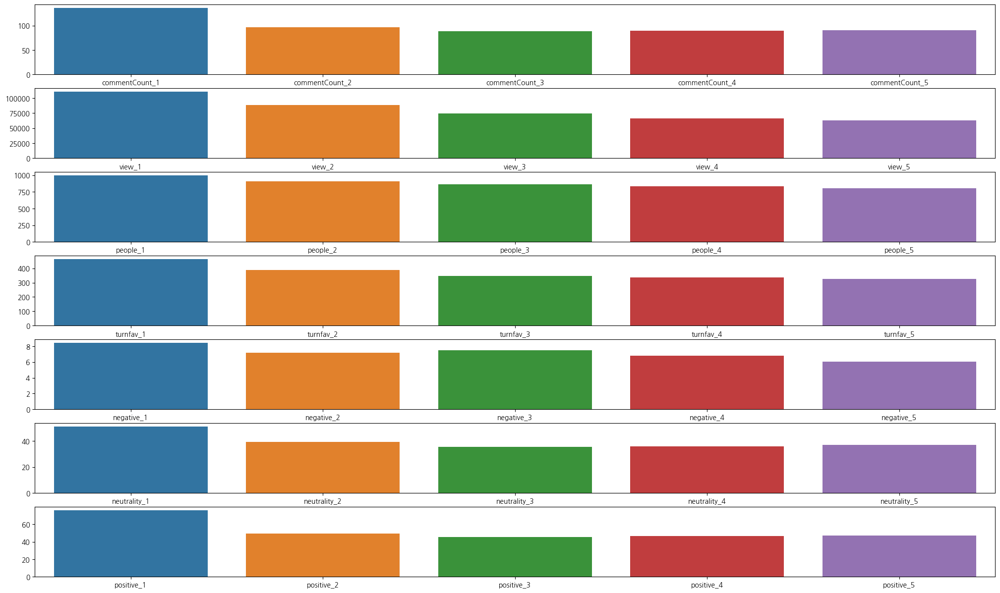

In [351]:
fig, ax = plt.subplots(figsize = (25,15), nrows=7)

sns.barplot(data = five_avg_comments, errorbar= None, ax = ax[0])
sns.barplot(data = five_avg_view, errorbar= None, ax = ax[1])
sns.barplot(data = five_avg_people, errorbar= None, ax = ax[2])
sns.barplot(data = five_avg_turnfav, errorbar= None, ax = ax[3])
sns.barplot(data = five_avg_negative, errorbar= None, ax = ax[4])
sns.barplot(data = five_avg_neutrality, errorbar= None, ax = ax[5])
sns.barplot(data = five_avg_positive, errorbar= None, ax = ax[6])

<AxesSubplot: >

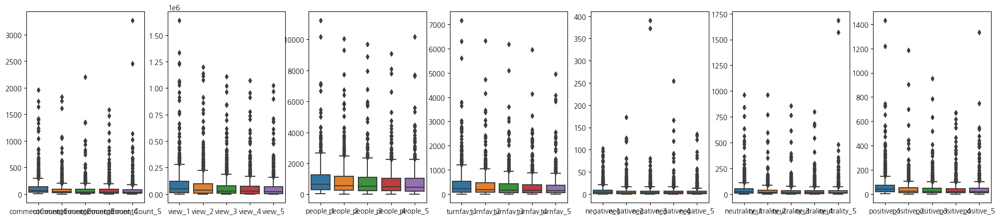

In [359]:
fig, ax = plt.subplots(figsize = (25,5), ncols=7)
sns.boxplot(data = five_avg_comments, ax = ax[0])
sns.boxplot(data = five_avg_view, ax = ax[1])
sns.boxplot(data = five_avg_people, ax = ax[2])
sns.boxplot(data = five_avg_turnfav, ax = ax[3])
sns.boxplot(data = five_avg_negative, ax = ax[4])
sns.boxplot(data = five_avg_neutrality, ax = ax[5])
sns.boxplot(data = five_avg_positive, ax = ax[6])

In [357]:
five[["id", "commentCount_5"]].sort_values(by="commentCount_5", ascending= False)

,id,commentCount_5
52,280629,3271
39,188562,2454
59,327056,1141
4,53694,1027
96,489585,883
...,...,...
521,781316,4
513,773477,4
322,699965,3
512,772755,3


In [36]:
# five_corr = five.corr()

# plt.figure(figsize=(20,20))
# mask = np.zeros_like(five_corr, dtype= np.bool)
# mask[np.triu_indices_from(mask)] = Trueq
# sns.heatmap(five_corr, cmap= "Blues", annot=True, fmt = '.2f', mask = mask)

## Feature Engineering

In [182]:
# 5회차까지 모든 지표 평균 지수 추가

five["avg_rate"] = (five["rating_1"] + five["rating_2"] + five["rating_3"] + five["rating_4"] + five["rating_5"])/5
five["avg_view"] = (five["view_1"] + five["view_2"] + five["view_3"] + five["view_4"] + five["view_5"])/5
five["avg_people"] = (five["people_1"] + five["people_2"] + five["people_3"] + five["people_4"] + five["people_5"])/5
five["avg_fav"] = (five["turnfav_1"] + five["turnfav_2"] + five["turnfav_3"] + five["turnfav_4"] + five["turnfav_5"])/5
five["avg_commentCount"] = (five["commentCount_1"] + five["commentCount_2"] + five["commentCount_3"] + five["commentCount_4"] + five["commentCount_5"])/5
five["total_recoSum"] = five["reco_sum_1"] + five["reco_sum_2"] + five["reco_sum_3"] + five["reco_sum_4"] + five["reco_sum_5"]
five["total_unrecoSum"] = five["unreco_sum_1"] + five["unreco_sum_2"] + five["unreco_sum_3"] + five["unreco_sum_4"] + five["unreco_sum_5"]
five["avg_recoSum"] = (five["reco_sum_1"] + five["reco_sum_2"] + five["reco_sum_3"] + five["reco_sum_4"] + five["reco_sum_5"])/5
five["avg_unrecoSum"] = (five["unreco_sum_1"] + five["unreco_sum_2"] + five["unreco_sum_3"] + five["unreco_sum_4"] + five["unreco_sum_5"])/5
five["avg_posScoreSum"] = (five["pos_score_sum_1"] + five["pos_score_sum_2"] + five["pos_score_sum_3"] + five["pos_score_sum_4"] + five["pos_score_sum_5"])/5
five["avg_negScoreSum"] = (five["neg_score_sum_1"] + five["neg_score_sum_2"] + five["neg_score_sum_3"] + five["neg_score_sum_4"] + five["neg_score_sum_5"])/5
five["avg_negative"] = (five["negative_1"] + five["negative_2"] + five["negative_3"] + five["negative_4"] + five["negative_5"])/5
five["avg_neutrality"] = (five["neutrality_1"] + five["neutrality_2"] + five["neutrality_3"] + five["neutrality_4"] + five["neutrality_5"])/5
five["avg_positive"] = (five["positive_1"] + five["positive_2"] + five["positive_3"] + five["positive_4"] + five["positive_5"])/5
five["avg_negative_rate"] = five["avg_negative"]/(five["avg_negative"] + five["avg_positive"] + five["avg_neutrality"])
five["avg_neutrality_rate"] = five["avg_neutrality"]/(five["avg_negative"] + five["avg_positive"] + five["avg_neutrality"])
five["avg_positive_rate"] = five["avg_positive"]/(five["avg_negative"] + five["avg_positive"] + five["avg_neutrality"])


In [446]:
five

,view_1,rating_1,people_1,turnfav_1,commentCount_1,reco_sum_1,reco_mean_1,unreco_sum_1,unreco_mean_1,pos_score_sum_1,...,senti_neg_score,label,sum_view,sum_turnfav,sum_commentCount,rating_people_1,rating_people_2,rating_people_3,rating_people_4,rating_people_5
0,47660,9.69,310,305,60,301,5.101695,20,0.338983,49,...,199,1,187790,1284,221,3003.90,3279.36,2425.44,2298.90,1866.31
1,6464,9.60,559,21,368,89,0.483696,10,0.054348,270,...,16,0,18927,76,1470,5366.40,5032.86,4831.04,4694.80,4757.97
2,552,6.89,57,1,31,40,1.290323,43,1.387097,18,...,21,0,933,1,160,392.73,189.00,156.03,177.10,186.00
3,7591,9.70,963,37,447,459,1.026846,11,0.024609,444,...,52,0,28241,164,1160,9341.10,8623.30,8533.21,8402.20,8112.00
4,49517,9.65,1622,154,1243,1015,0.821862,136,0.110121,735,...,260,0,253203,742,5568,15652.30,13973.15,16523.68,15801.52,15176.88
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
538,45811,7.14,460,247,90,1570,19.873418,397,5.025316,71,...,862,0,156164,879,199,3284.40,2418.71,2202.15,2170.71,2064.00
539,8931,8.01,122,41,21,107,5.350000,68,3.400000,25,...,96,0,24493,129,50,977.22,792.00,681.12,654.36,657.72
540,33883,9.85,270,221,28,317,11.321429,17,0.607143,37,...,88,0,102536,738,88,2659.50,2052.96,1802.55,1450.89,1511.64
541,66769,9.83,780,441,29,510,17.586207,36,1.241379,36,...,136,1,304039,2260,114,7667.40,8201.16,7759.82,6763.04,6085.80


In [362]:
five.new_keyword.value_counts()

정식연재            316
마지막화,에필로그,완결    227
Name: new_keyword, dtype: int64

In [363]:
# five_ml = five[['genre','new_keyword', 'rating_1','people_1', 'view_1','commentCount_1', 'recoSum_1', 'unrecoSum_1','negative_1','neutrality_1', 'positive_1',
#                 'rating_2','people_2', 'view_2','commentCount_2', 'recoSum_2', 'unrecoSum_2','negative_2','neutrality_2', 'positive_2',
#                 'rating_3','people_3', 'view_3','commentCount_3', 'recoSum_3', 'unrecoSum_3','negative_3','neutrality_3', 'positive_3',
#                 'rating_4','people_4', 'view_4','commentCount_4', 'recoSum_4', 'unrecoSum_4','negative_4','neutrality_4', 'positive_4',
#                 'rating_5','people_5', 'view_5','commentCount_5', 'recoSum_5', 'unrecoSum_5','negative_5','neutrality_5', 'positive_5']]
# five_ml

## 학습데이터 분류

### 인코딩

In [8]:
# five["new_keyword"] = five["new_keyword"].replace({"정식연재" : 1, "마지막화,에필로그,완결" : 0})

In [184]:
# five["new_keyword"]

In [10]:
# 장르 라벨 인코딩
# le = LabelEncoder()

# five.genre = le.fit_transform(five.genre)

### 학습데이터 나누기

In [448]:
label = "label"
features = five.columns.drop(['label']) # EDA 과정 중에 필요한 변수들만 제거
# features = ["avg_view", "avg_fav", "avg_rate", "avg_commentCount", 'commentCount_1', 'avg_negative', 'avg_positive', 'avg_neutrality'] # 평균 조회수/좋아요/평점/댓글수, 1회차 댓글수, 평균 부정/긍정/중립 댓글 수
# features = ['neg_score_mean_3', 'rate_pos_4', 'neg_score_sum_5', 'episode', 'omnibus', 'story', 'daily', 'comic', 'fantasy', 'action', 
#             'drama','pure', 'sensibility', 'thrill', 'historical', 'sports', 'diff_2', 'avg_people', 'avg_neutrality_rate', 'avg_positive_rate'] # SequentialFeatureSelector의 상위 20개 features
# features = ['reco_sum_1', 'neg_score_sum_1', 'reco_sum_2', 'pos_score_mean_2','reco_sum_3', 'pos_score_mean_3', 'pos_score_sum_4', 'pos_score_mean_4',
#        'rate_pos_4', 'reco_sum_5', 'pos_score_sum_5', 'pos_score_mean_5','neg_score_sum_5', 'rate_neur_5', 'rate_pos_5', 'genre','total_recoSum', 'avg_recoSum', 'avg_neutrality_rate','avg_positive_rate'] # SelectKBest의 상위 20개

In [247]:
# features = ['view_1', 'rating_1', 'people_1', 'turnfav_1', 'commentCount_1', 'reco_sum_1', 'reco_mean_1', 'unreco_sum_1', 'unreco_mean_1', 'pos_score_sum_1', 'pos_score_mean_1', 'neg_score_sum_1', 'neg_score_mean_1', 'negative_1', 'neutrality_1', 'positive_1', 'rate_neg_1', 'rate_neur_1', 'rate_pos_1',
#             'view_2', 'rating_2', 'people_2', 'turnfav_2', 'commentCount_2', 'reco_sum_2', 'reco_mean_2', 'unreco_sum_2', 'unreco_mean_2', 'pos_score_sum_2', 'pos_score_mean_2', 'neg_score_sum_2', 'neg_score_mean_2', 'negative_2', 'neutrality_2', 'positive_2', 'rate_neg_2', 'rate_neur_2', 'rate_pos_2',
#             'view_3', 'rating_3', 'people_3', 'turnfav_3', 'commentCount_3', 'reco_sum_3', 'reco_mean_3', 'unreco_sum_3', 'unreco_mean_3', 'pos_score_sum_3', 'pos_score_mean_3', 'neg_score_sum_3', 'neg_score_mean_3', 'negative_3', 'neutrality_3', 'positive_3', 'rate_neg_3', 'rate_neur_3', 'rate_pos_3',
#             'view_4', 'rating_4', 'people_4', 'turnfav_4', 'commentCount_4', 'reco_sum_4', 'reco_mean_4', 'unreco_sum_4', 'unreco_mean_4', 'pos_score_sum_4', 'pos_score_mean_4', 'neg_score_sum_4', 'neg_score_mean_4', 'negative_4', 'neutrality_4', 'positive_4', 'rate_neg_4', 'rate_neur_4', 'rate_pos_4',
#             'view_5', 'rating_5', 'people_5', 'turnfav_5', 'commentCount_5', 'reco_sum_5', 'reco_mean_5', 'unreco_sum_5', 'unreco_mean_5', 'pos_score_sum_5', 'pos_score_mean_5', 'neg_score_sum_5', 'neg_score_mean_5', 'negative_5', 'neutrality_5', 'positive_5', 'rate_neg_5', 'rate_neur_5', 'rate_pos_5',
#             'episode', 'omnibus', 'story', 'daily', 'comic', 'fantasy', 'action','drama','pure', 'sensibility', 'thrill', 'historical', 'sports']

In [449]:
X = five[features]
y = five[label]

In [187]:
# def forward_selection(data, target, significance_level=0.05):
#     initial_features = data.columns.tolist()
#     best_features = []
#     while (len(initial_features)>0):
#         remaining_features = list(set(initial_features)-set(best_features))
#         new_pval = pd.Series(index=remaining_features)
#         for new_column in remaining_features:
#             model = sm.OLS(target, sm.add_constant(data[best_features+[new_column]])).fit()
#             new_pval[new_column] = model.pvalues[new_column]
#         min_p_value = new_pval.min()
#         if(min_p_value<significance_level):
#             best_features.append(new_pval.idxmin())
#         else:
#             break
#     return best_features

In [206]:
# forward_selection(X,y)

In [205]:
# sffs = SequentialFeatureSelector(DecisionTreeClassifier(), n_features_to_select=20, direction = 'forward', cv=5, n_jobs=-1)
# X_sffs = sffs.fit_transform(X, y)

# sffs.get_feature_names_out

# all_names = X.columns
# ## selector.get_support()
# selected_mask = sffs.get_support()
# ## 선택된 특성(변수)들
# selected_names = all_names[selected_mask]
# ## 선택되지 않은 특성(변수)들
# unselected_names = all_names[~selected_mask]
# print('Selected names: ', selected_names)
# # print('Unselected names: ', unselected_names)

In [389]:
# five_ml.to_csv("G:/내 드라이브/Project/FINAL/data_preprocessing/overview/5_ML.csv", index= False)

In [322]:
# five_ml_corr = five_ml.corr()

In [323]:
# plt.figure(figsize=(20,20))
# mask = np.zeros_like(five_ml_corr, dtype= np.bool)
# mask[np.triu_indices_from(mask)] = True
# sns.heatmap(five_ml_corr, cmap= "Blues", annot=True, fmt = '.2f', mask = mask);

In [366]:
# five_ml.dtypes

In [450]:
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify = y, test_size= 0.2, random_state=42)
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((434, 105), (109, 105), (434,), (109,))

In [451]:
X_train

,view_1,rating_1,people_1,turnfav_1,commentCount_1,reco_sum_1,reco_mean_1,unreco_sum_1,unreco_mean_1,pos_score_sum_1,...,senti_pos_score,senti_neg_score,sum_view,sum_turnfav,sum_commentCount,rating_people_1,rating_people_2,rating_people_3,rating_people_4,rating_people_5
321,107919,9.81,865,743,103,1178,11.663366,70,0.693069,69,...,4007,404,384607,3125,308,8485.65,7129.62,7288.83,7868.28,7817.04
135,32941,9.82,581,183,38,482,12.684211,42,1.105263,51,...,1212,68,111484,756,157,5705.42,5811.50,4713.08,4447.68,4615.40
88,5652,9.55,530,5,90,37,0.411111,22,0.244444,66,...,32,28,11297,17,572,5061.50,4612.70,4941.37,5337.52,5359.92
224,159110,9.84,879,510,22,453,20.590909,38,1.727273,31,...,1140,211,492409,1962,78,8649.36,7459.84,6944.00,6758.62,6385.50
377,138288,9.89,1070,900,71,1313,18.492958,34,0.478873,82,...,5192,1510,483719,3618,268,10582.30,9306.49,7256.98,8053.92,6834.88
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
433,84725,9.64,391,499,31,638,20.580645,15,0.483871,57,...,2508,335,377234,2224,176,3769.24,3323.67,3333.96,3152.22,2664.75
33,158,9.63,162,0,53,19,0.358491,0,0.000000,55,...,15,1,338,0,211,1560.06,1326.18,1611.60,1252.56,894.66
480,13353,9.42,110,68,19,105,5.526316,15,0.789474,39,...,379,42,47107,315,85,1036.20,1072.37,1010.82,973.08,780.00
165,17610,9.83,3265,2001,230,9520,41.572052,424,1.851528,238,...,90364,23186,36444,8271,1745,32094.95,35325.60,35351.65,37318.47,34253.64


In [452]:
y_train

321    1
135    0
88     1
224    0
377    0
      ..
433    1
33     1
480    1
165    1
502    1
Name: label, Length: 434, dtype: int64

In [453]:
X_test

,view_1,rating_1,people_1,turnfav_1,commentCount_1,reco_sum_1,reco_mean_1,unreco_sum_1,unreco_mean_1,pos_score_sum_1,...,senti_pos_score,senti_neg_score,sum_view,sum_turnfav,sum_commentCount,rating_people_1,rating_people_2,rating_people_3,rating_people_4,rating_people_5
70,6655,9.32,779,14,51,36,0.705882,16,0.313725,31,...,115,40,35312,78,1130,7260.28,8947.95,10577.70,9978.78,5540.91
430,170128,9.87,1712,1233,74,1170,15.810811,114,1.540541,76,...,4672,717,921953,5787,544,16897.44,16571.73,15877.16,15547.08,14202.93
78,3825,9.28,405,23,80,44,0.550000,6,0.075000,82,...,88,25,11910,89,288,3758.40,3416.40,3243.36,3313.44,3130.76
5,8070,9.81,394,81,44,157,3.568182,23,0.522727,44,...,305,47,18052,283,127,3865.14,3321.34,2883.87,2803.20,3214.40
486,12668,9.02,196,84,20,108,5.400000,3,0.150000,18,...,512,13,51030,352,77,1767.92,1725.84,1582.40,1679.94,1560.04
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
379,86676,9.77,440,405,61,606,9.934426,23,0.377049,49,...,847,74,311174,1176,124,4298.80,2566.88,1996.70,1856.30,1833.00
291,194139,9.70,408,193,25,232,9.280000,88,3.520000,20,...,526,207,719672,781,95,3957.60,4199.91,3537.80,3207.75,3671.64
422,13786,9.87,421,172,75,426,5.680000,15,0.200000,123,...,598,49,34896,463,129,4155.27,2067.00,2013.48,1802.55,2061.28
176,25972,9.89,460,224,38,237,6.236842,50,1.315789,41,...,528,520,87577,897,129,4549.40,4302.15,3955.68,3746.80,3696.84


In [454]:
y_test

70     1
430    1
78     0
5      1
486    0
      ..
379    1
291    1
422    0
176    0
479    0
Name: label, Length: 109, dtype: int64

### Feature Selection

In [202]:
# # target(Price)와 가장 correlated 된 features 를 k개 고르기.
# ## f_regresison, SelectKBest 불러오기.
# ## selctor 정의하기.
# selector = SelectKBest(score_func=f_regression, k=20)
# ## 학습데이터에 fit_transform 
# X_train_selected = selector.fit_transform(X_train, y_train)
# ## 테스트 데이터는 transform
# X_test_selected = selector.transform(X_test)
# X_train_selected.shape, X_test_selected.shape

In [203]:
# all_names = X_train.columns
# ## selector.get_support()
# selected_mask = selector.get_support()
# ## 선택된 특성(변수)들
# selected_names = all_names[selected_mask]
# ## 선택되지 않은 특성(변수)들
# unselected_names = all_names[~selected_mask]
# print('Selected names: ', selected_names)
# # print('Unselected names: ', unselected_names)

In [204]:
# X_train = X_train[['reco_sum_1', 'neg_score_sum_1', 'reco_sum_2', 'pos_score_mean_2',
#        'reco_sum_3', 'pos_score_mean_3', 'pos_score_sum_4', 'pos_score_mean_4',
#        'rate_pos_4', 'reco_sum_5', 'pos_score_sum_5', 'pos_score_mean_5',
#        'neg_score_sum_5', 'rate_neur_5', 'rate_pos_5', 'genre',
#        'total_recoSum', 'avg_recoSum', 'avg_neutrality_rate',
#        'avg_positive_rate']]

# X_test = X_test[['reco_sum_1', 'neg_score_sum_1', 'reco_sum_2', 'pos_score_mean_2',
#        'reco_sum_3', 'pos_score_mean_3', 'pos_score_sum_4', 'pos_score_mean_4',
#        'rate_pos_4', 'reco_sum_5', 'pos_score_sum_5', 'pos_score_mean_5',
#        'neg_score_sum_5', 'rate_neur_5', 'rate_pos_5', 'genre',
#        'total_recoSum', 'avg_recoSum', 'avg_neutrality_rate',
#        'avg_positive_rate']]

## 모델 설정

### LR

In [455]:
model_LR = LogisticRegression(random_state=42)
y_pred_5_LR = model_LR.fit(X_train, y_train).predict(X_test)

c:\Users\junhy\anaconda3\envs\TFGPU\lib\site-packages\sklearn\linear_model\_logistic.py:444: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [456]:
model_LR.predict_proba(X_test)[:5]

array([[0.4401463 , 0.5598537 ],
       [0.59487835, 0.40512165],
       [0.48976371, 0.51023629],
       [0.48264772, 0.51735228],
       [0.48289587, 0.51710413]])

In [457]:
y_pred_5_LR[:5]

array([1, 0, 1, 1, 1], dtype=int64)

In [458]:
y_test.head(5)

70     1
430    1
78     0
5      1
486    0
Name: label, dtype: int64

In [459]:
print("accuracy_score :", accuracy_score(y_pred_5_LR, y_test))
print("recall_score :", recall_score(y_pred_5_LR, y_test))
print("f1 score :", f1_score(y_pred_5_LR, y_test))

accuracy_score : 0.6146788990825688
recall_score : 0.6438356164383562
f1 score : 0.6911764705882354


In [460]:
model_LR_iter = LogisticRegression(random_state=42, solver='lbfgs', max_iter=10000)
y_pred_5_LR_iter = model_LR_iter.fit(X_train, y_train).predict(X_test)

In [461]:
print("accuracy_score :", accuracy_score(y_pred_5_LR_iter, y_test))
print("recall_score :", recall_score(y_pred_5_LR_iter, y_test))
print("f1 score :", f1_score(y_pred_5_LR_iter, y_test))

accuracy_score : 0.6330275229357798
recall_score : 0.6666666666666666
f1 score : 0.696969696969697


### 결정트리

In [462]:
model_DT = DecisionTreeClassifier(random_state=42)
y_pred_5_DT = model_DT.fit(X_train, y_train).predict(X_test)

In [463]:
print("accuracy_score :", accuracy_score(y_pred_5_DT, y_test))
print("recall_score :", recall_score(y_pred_5_DT, y_test))
print("f1 score :", f1_score(y_pred_5_DT, y_test))

accuracy_score : 0.5504587155963303
recall_score : 0.6060606060606061
f1 score : 0.62015503875969


<AxesSubplot: xlabel='importance', ylabel='features'>

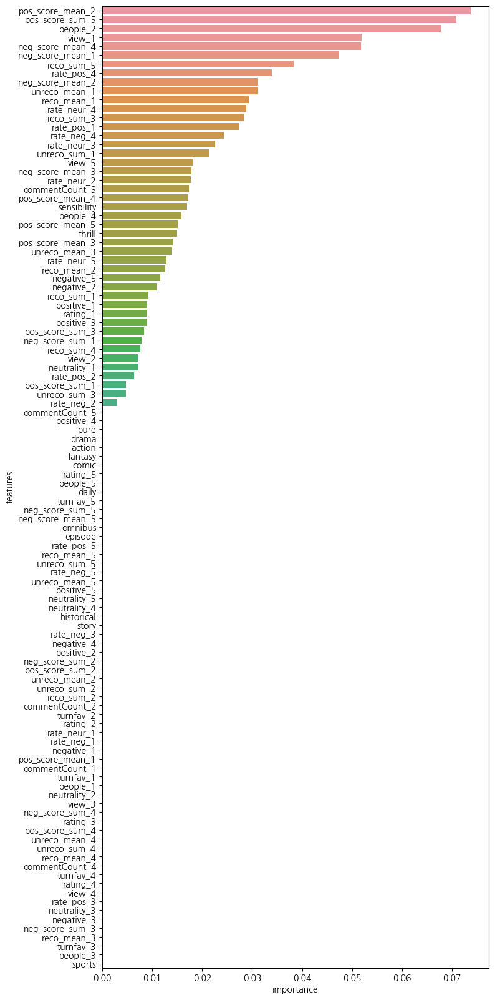

In [262]:
DT = pd.DataFrame(list(zip(model_DT.feature_names_in_, model_DT.feature_importances_)), 
                  columns = ["features", "importance"]).sort_values('importance', ascending=False)

plt.figure(figsize= (8,20))
sns.barplot(DT, x = 'importance', y = 'features')

In [263]:
# Grid Search CV

max_depth = list(range(3, 20, 2))
max_features = list(range(3, 20, 2)) #[0.3, 0.5, 0.7, 0.8, 0.9]
min_samples_leaf= list(range(1, 10))
parameters = {"max_depth" : max_depth, "max_features" : max_features, 'criterion': ['gini', 'entropy'], "min_samples_leaf" : min_samples_leaf}

Grid_DT = GridSearchCV(model_DT, parameters, n_jobs = -1, cv = 5)
Grid_DT.fit(X_train, y_train)

GridSearchCV(cv=5, estimator=DecisionTreeClassifier(random_state=42), n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': [3, 5, 7, 9, 11, 13, 15, 17, 19],
                         'max_features': [3, 5, 7, 9, 11, 13, 15, 17, 19],
                         'min_samples_leaf': [1, 2, 3, 4, 5, 6, 7, 8, 9]})

In [278]:
best_Grid_DT = Grid_DT.best_estimator_
best_Grid_DT

DecisionTreeClassifier(max_depth=5, max_features=5, min_samples_leaf=9,
                       random_state=42)

In [279]:
y_pred_5_DT_Grid = best_Grid_DT.predict(X_test)

In [280]:
print("accuracy_score :", accuracy_score(y_pred_5_DT_Grid, y_test))
print("recall_score :", recall_score(y_pred_5_DT_Grid, y_test))
print("f1 score :", f1_score(y_pred_5_DT_Grid, y_test))

accuracy_score : 0.5321100917431193
recall_score : 0.5967741935483871
f1 score : 0.592


<AxesSubplot: xlabel='importance', ylabel='features'>

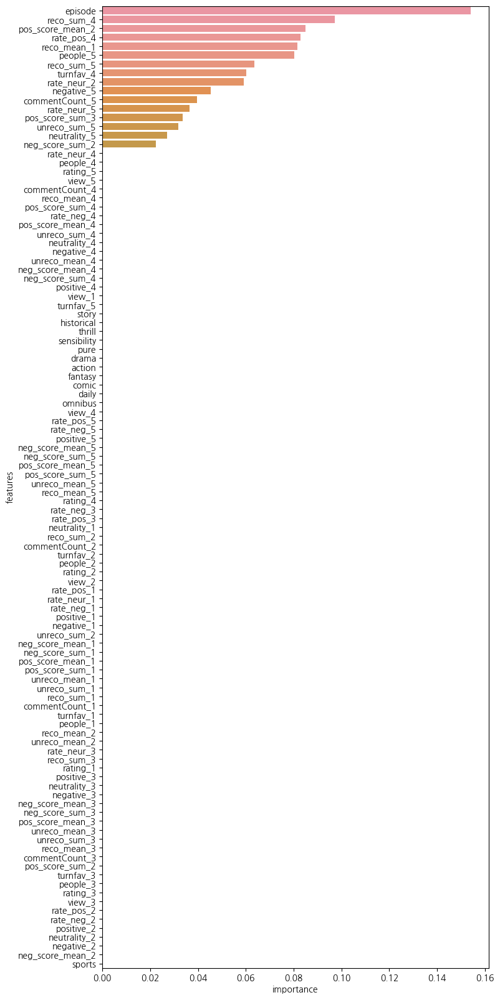

In [282]:
DT = pd.DataFrame(list(zip(best_Grid_DT.feature_names_in_, best_Grid_DT.feature_importances_)), 
                  columns = ["features", "importance"]).sort_values('importance', ascending=False)

plt.figure(figsize= (8,20))
sns.barplot(DT, x = 'importance', y = 'features')

In [283]:
# Random Search CV

param_distributions = {
    'criterion': ['gini', 'entropy'],
    'max_depth': range(1, 1000),
    'max_leaf_nodes' : range(3,1000,3),
}

randomCV = RandomizedSearchCV(model_DT, param_distributions=param_distributions, n_iter=60, return_train_score=True, n_jobs= -1, cv = 5, verbose=2) 

In [284]:
randomCV.fit(X_train, y_train).best_estimator_

Fitting 5 folds for each of 60 candidates, totalling 300 fits


DecisionTreeClassifier(criterion='entropy', max_depth=177, max_leaf_nodes=111,
                       random_state=42)

In [285]:
pd.DataFrame(randomCV.cv_results_).sort_values('rank_test_score')[:3]

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_leaf_nodes,param_max_depth,param_criterion,params,split0_test_score,split1_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.041069,0.008478,0.004563,0.001012,111,177,entropy,"{'max_leaf_nodes': 111, 'max_depth': 177, 'cri...",0.586207,0.597701,...,0.599038,0.017766,1,1.0,1.0,1.0,1.0,1.0,1.0,0.0
23,0.033827,0.005355,0.002877,0.000198,708,594,entropy,"{'max_leaf_nodes': 708, 'max_depth': 594, 'cri...",0.586207,0.597701,...,0.599038,0.017766,1,1.0,1.0,1.0,1.0,1.0,1.0,0.0
24,0.042458,0.015414,0.003968,0.002262,723,985,entropy,"{'max_leaf_nodes': 723, 'max_depth': 985, 'cri...",0.586207,0.597701,...,0.599038,0.017766,1,1.0,1.0,1.0,1.0,1.0,1.0,0.0


In [291]:
best_Random_DT = randomCV.best_estimator_
best_Random_DT

DecisionTreeClassifier(criterion='entropy', max_depth=177, max_leaf_nodes=111,
                       random_state=42)

In [287]:
y_pred_5_DT_Random = best_Random_DT.predict(X_test)

In [288]:
print("accuracy_score :", accuracy_score(y_pred_5_DT_Random, y_test))
print("recall_score :", recall_score(y_pred_5_DT_Random, y_test))
print("f1 score :", f1_score(y_pred_5_DT_Random, y_test))

accuracy_score : 0.6880733944954128
recall_score : 0.7301587301587301
f1 score : 0.7301587301587301


<AxesSubplot: xlabel='importance', ylabel='features'>

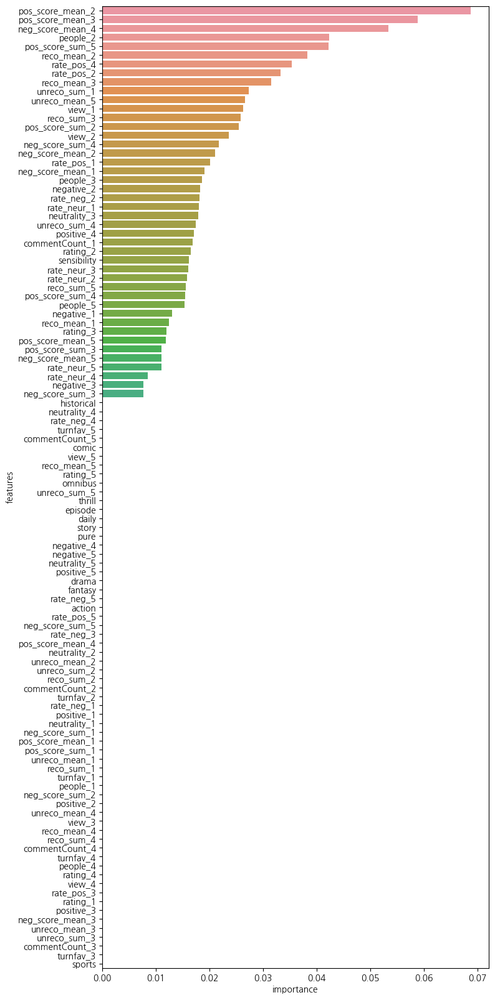

In [290]:
DT = pd.DataFrame(list(zip(best_Random_DT.feature_names_in_, best_Random_DT.feature_importances_)), 
                  columns = ["features", "importance"]).sort_values('importance', ascending=False)

plt.figure(figsize= (8,20))
sns.barplot(DT, x = 'importance', y = 'features')


### Random Forest

In [464]:
model_RF = RandomForestClassifier(random_state=42)
y_pred_5_RF = model_RF.fit(X_train, y_train).predict(X_test)

In [465]:
print("accuracy_score :", accuracy_score(y_pred_5_RF, y_test))
print("recall_score :", recall_score(y_pred_5_RF, y_test))
print("f1 score :", f1_score(y_pred_5_RF, y_test))

accuracy_score : 0.6788990825688074
recall_score : 0.6891891891891891
f1 score : 0.7445255474452555


<AxesSubplot: xlabel='importance', ylabel='features'>

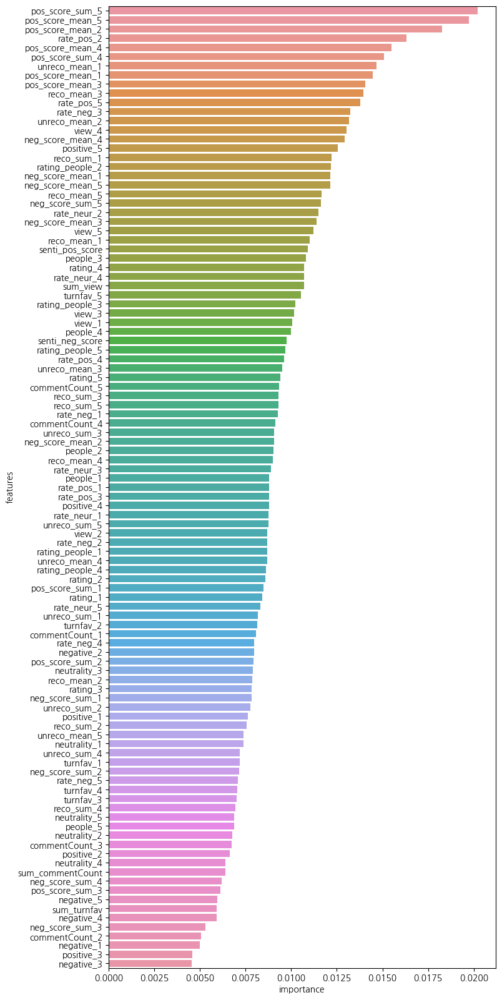

In [466]:
DT = pd.DataFrame(list(zip(model_RF.feature_names_in_, model_RF.feature_importances_)), 
                  columns = ["features", "importance"]).sort_values('importance', ascending=False)

plt.figure(figsize= (8,20))
sns.barplot(DT, x = 'importance', y = 'features')

In [296]:
model_RF_DT = RandomForestClassifier(criterion='entropy', max_depth=177, max_leaf_nodes=111, random_state=42)
y_pred_5_RF_DT = model_RF_DT.fit(X_train, y_train).predict(X_test)

In [297]:
print("accuracy_score :", accuracy_score(y_pred_5_RF_DT, y_test))
print("recall_score :", recall_score(y_pred_5_RF_DT, y_test))
print("f1 score :", f1_score(y_pred_5_RF_DT, y_test))

accuracy_score : 0.6422018348623854
recall_score : 0.6666666666666666
f1 score : 0.7111111111111111


<AxesSubplot: xlabel='importance', ylabel='features'>

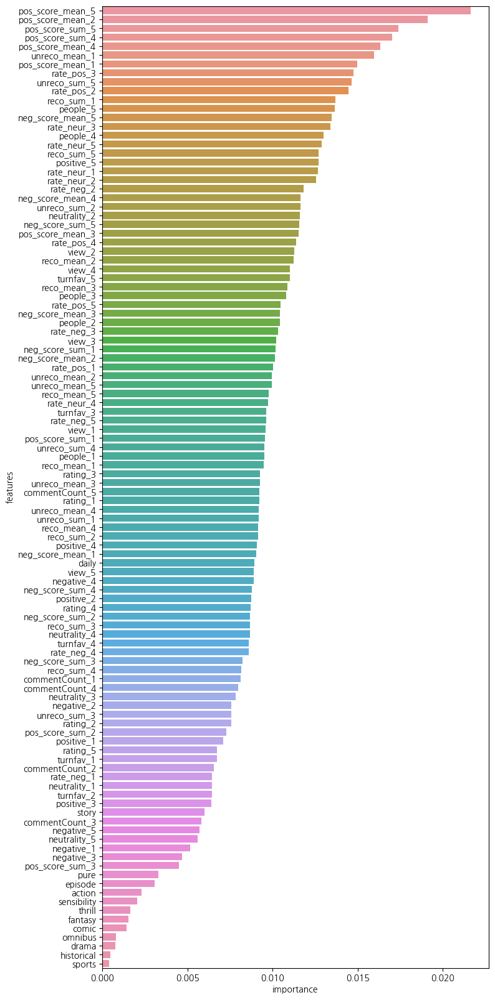

In [298]:
DT = pd.DataFrame(list(zip(model_RF.feature_names_in_, model_RF.feature_importances_)), 
                  columns = ["features", "importance"]).sort_values('importance', ascending=False)

plt.figure(figsize= (8,20))
sns.barplot(DT, x = 'importance', y = 'features')

In [299]:
RF_randomCV = RandomizedSearchCV(model_RF, param_distributions=param_distributions, n_iter=60, return_train_score=True, n_jobs= -1, cv = 5, verbose=2) 

In [300]:
RF_randomCV.fit(X_train, y_train)

Fitting 5 folds for each of 60 candidates, totalling 300 fits


RandomizedSearchCV(cv=5, estimator=RandomForestClassifier(random_state=42),
                   n_iter=60, n_jobs=-1,
                   param_distributions={'criterion': ['gini', 'entropy'],
                                        'max_depth': range(1, 1000),
                                        'max_leaf_nodes': range(3, 1000, 3)},
                   return_train_score=True, verbose=2)

In [301]:
pd.DataFrame(RF_randomCV.cv_results_).sort_values('rank_test_score')[:3]

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_leaf_nodes,param_max_depth,param_criterion,params,split0_test_score,split1_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
45,0.274387,0.034747,0.020038,0.005590,30,875,gini,"{'max_leaf_nodes': 30, 'max_depth': 875, 'crit...",0.655172,0.666667,...,0.658808,0.043222,1,0.991354,0.991354,0.997118,0.997118,0.991379,0.993665,0.002820
16,0.264270,0.023948,0.014581,0.000506,33,431,gini,"{'max_leaf_nodes': 33, 'max_depth': 431, 'crit...",0.655172,0.666667,...,0.651938,0.032036,2,0.994236,0.994236,0.997118,0.997118,0.994253,0.995392,0.001409
5,0.352656,0.030584,0.015872,0.000830,30,474,entropy,"{'max_leaf_nodes': 30, 'max_depth': 474, 'crit...",0.643678,0.643678,...,0.647340,0.031231,3,1.000000,0.997118,1.000000,0.994236,0.994253,0.997121,0.002574


In [302]:
best_Random_RF = RF_randomCV.best_estimator_
best_Random_RF

RandomForestClassifier(max_depth=875, max_leaf_nodes=30, random_state=42)

In [303]:
y_pred_5_RF_random = best_Random_RF.predict(X_test)

In [304]:
print("accuracy_score :", accuracy_score(y_pred_5_RF_random, y_test))
print("recall_score :", recall_score(y_pred_5_RF_random, y_test))
print("f1 score :", f1_score(y_pred_5_RF_random, y_test))

accuracy_score : 0.6697247706422018
recall_score : 0.68
f1 score : 0.7391304347826089


<AxesSubplot: xlabel='importance', ylabel='features'>

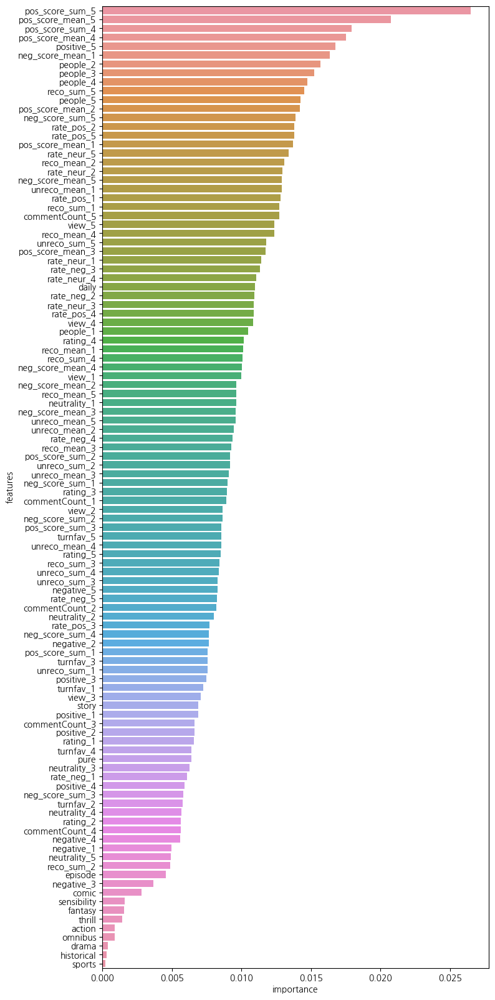

In [305]:
RF = pd.DataFrame(list(zip(best_Random_RF.feature_names_in_, best_Random_RF.feature_importances_)), 
                  columns = ["features", "importance"]).sort_values('importance', ascending=False)

plt.figure(figsize= (8,20))
sns.barplot(RF, x = 'importance', y = 'features')

### Neural Newtork

In [170]:
input_shape= X_train.shape[1]

In [171]:
model = Sequential()

# model.add(Dense(units = 1024, activation = "relu", input_shape = [input_shape]))
# model.add(Dropout(0.5))
# model.add(Dense(units = 512, activation = "relu"))
# model.add(Dropout(0.5))
model.add(Dense(units = 256, activation = "relu", input_shape = [input_shape]))
model.add(Dropout(0.5))
model.add(Dense(units = 128, activation = "relu"))
model.add(Dropout(0.5))
model.add(Dense(units = 64, activation = "relu"))
model.add(Dropout(0.5))
model.add(Dense(units = 32, activation = "relu"))
model.add(Dropout(0.5))
model.add(Dense(units = 16, activation = "relu"))
model.add(Dropout(0.5))
model.add(Dense(units = 8, activation = "relu"))
model.add(Dropout(0.5))
model.add(Dense(units = 4, activation = "relu"))
model.add(Dropout(0.5))
model.add(Dense(units = 2, activation = "relu"))
model.add(Dropout(0.5))

# model.add(SimpleRNN(hidden_units))

model.add(Dense(units = 1, activation = "sigmoid"))

model.compile(optimizer= "adam",
              loss = 'binary_crossentropy',
              metrics = ['accuracy'])

model.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_47 (Dense)            (None, 256)               5376      
                                                                 
 dropout_42 (Dropout)        (None, 256)               0         
                                                                 
 dense_48 (Dense)            (None, 128)               32896     
                                                                 
 dropout_43 (Dropout)        (None, 128)               0         
                                                                 
 dense_49 (Dense)            (None, 64)                8256      
                                                                 
 dropout_44 (Dropout)        (None, 64)                0         
                                                                 
 dense_50 (Dense)            (None, 32)               

In [172]:
early_stop = EarlyStopping(monitor='val_loss', patience=10)
history = model.fit(X_train, y_train, validation_split= 0.2, callbacks=early_stop, epochs= 100)

Epoch 1/100


c:\Users\junhy\anaconda3\envs\TFGPU\lib\site-packages\keras\engine\data_adapter.py:1699: FutureWarning: The behavior of `series[i:j]` with an integer-dtype index is deprecated. In a future version, this will be treated as *label-based* indexing, consistent with e.g. `series[i]` lookups. To retain the old behavior, use `series.iloc[i:j]`. To get the future behavior, use `series.loc[i:j]`.
  return t[start:end]


11/11 [==============================] - 1s 34ms/step - loss: 1.5474 - accuracy: 0.5850 - val_loss: 0.6926 - val_accuracy: 0.5632
Epoch 2/100
11/11 [==============================] - 0s 18ms/step - loss: 5.8473 - accuracy: 0.5879 - val_loss: 0.6920 - val_accuracy: 0.5632
Epoch 3/100
11/11 [==============================] - 0s 14ms/step - loss: 0.9147 - accuracy: 0.5879 - val_loss: 0.6916 - val_accuracy: 0.5632
Epoch 4/100
11/11 [==============================] - 0s 13ms/step - loss: 1.1661 - accuracy: 0.5879 - val_loss: 0.6913 - val_accuracy: 0.5632
Epoch 5/100
11/11 [==============================] - 0s 12ms/step - loss: 8.7584 - accuracy: 0.5879 - val_loss: 0.6909 - val_accuracy: 0.5632
Epoch 6/100
11/11 [==============================] - 0s 13ms/step - loss: 1.7256 - accuracy: 0.5879 - val_loss: 0.6905 - val_accuracy: 0.5632
Epoch 7/100
11/11 [==============================] - 0s 13ms/step - loss: 7.8824 - accuracy: 0.5879 - val_loss: 0.6902 - val_accuracy: 0.5632
Epoch 8/100
11/11 

In [173]:
hist = pd.DataFrame(history.history)
hist.tail(3)

,loss,accuracy,val_loss,val_accuracy
56,0.675245,0.587896,0.685164,0.563218
57,0.833205,0.587896,0.685175,0.563218
58,0.675205,0.587896,0.685188,0.563218


<AxesSubplot: >

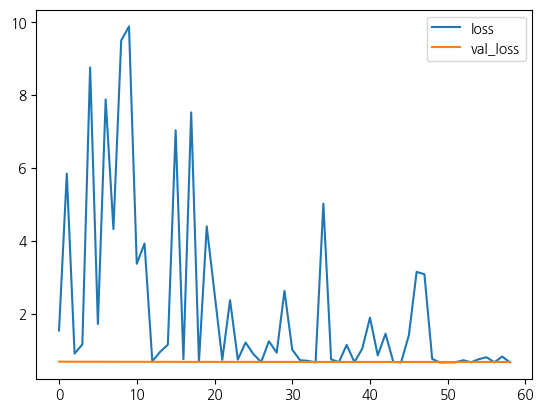

In [174]:
hist[['loss', 'val_loss']].plot()

In [115]:
# hist[['binary_accuracy', 'val_binary_accuracy']].plot()

<AxesSubplot: >

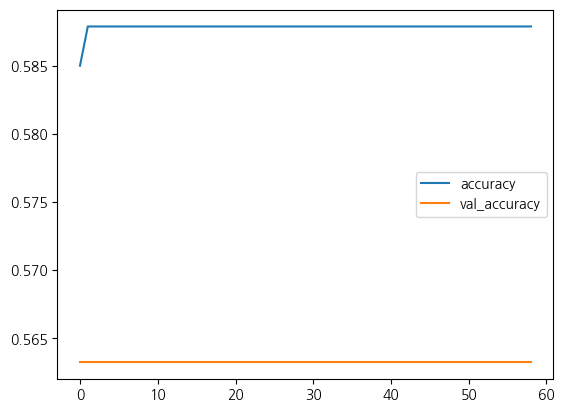

In [175]:
hist[['accuracy', 'val_accuracy']].plot()

In [176]:
y_pred_NN = model.predict(X_test)

4/4 [==============================] - 0s 3ms/step


In [177]:
y_predict_NN = (y_pred_NN.flatten() > 0.5).astype(int)
y_predict_NN

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1])

In [178]:
# (y_test == y_predict_NN).mean()

print("accuracy_score :", accuracy_score(y_predict_NN, y_test))
print("recall_score :", recall_score(y_predict_NN, y_test))
print("f1 score :", f1_score(y_predict_NN, y_test))

accuracy_score : 0.5779816513761468
recall_score : 0.5779816513761468
f1 score : 0.7325581395348838


### Neural Network - MinMaxScaler

In [474]:
MM = MinMaxScaler()

five_ml = five.drop(columns= ['id','date_1', 'date_2','date_3','date_4','date_5'])

five_ml_MM = MM.fit_transform(five_ml)
five_ml_MM = pd.DataFrame(five_ml_MM, columns= five_ml.columns)

In [475]:
X_train_MM, X_test_MM, y_train_MM, y_test_MM = train_test_split(five_ml_MM.drop(columns= "new_keyword"), five_ml_MM.new_keyword, stratify=five_ml_MM.new_keyword, test_size= 0.2, random_state=42)
X_train_MM.shape, X_test_MM.shape, y_train_MM.shape, y_test_MM.shape

((434, 113), (109, 113), (434,), (109,))

In [476]:
X_train_MM

,view_1,rating_1,people_1,turnfav_1,commentCount_1,reco_sum_1,reco_mean_1,unreco_sum_1,unreco_mean_1,pos_score_sum_1,...,avg_recoSum,avg_unrecoSum,avg_posScoreSum,avg_negScoreSum,avg_negative,avg_neutrality,avg_positive,avg_negative_rate,avg_neutrality_rate,avg_positive_rate
321,0.065694,0.951140,0.072431,0.103511,0.050128,0.036966,0.132161,0.005539,0.018755,0.025181,...,0.036974,0.011758,0.029131,0.015470,0.021978,0.024931,0.034096,0.321839,0.515603,0.467793
135,0.019985,0.954397,0.047036,0.025495,0.016880,0.015125,0.143728,0.003323,0.029910,0.018314,...,0.011253,0.006555,0.029131,0.007005,0.002997,0.010228,0.023137,0.081065,0.370745,0.664133
88,0.003349,0.866450,0.042475,0.000697,0.043478,0.001161,0.004658,0.001741,0.006615,0.024037,...,0.000605,0.002298,0.063957,0.026562,0.034965,0.047944,0.072333,0.261417,0.498737,0.500738
224,0.096902,0.960912,0.073683,0.071050,0.008696,0.014215,0.233321,0.003007,0.046742,0.010683,...,0.008630,0.009663,0.010064,0.002043,0.002997,0.003409,0.011690,0.163170,0.232464,0.754424
377,0.084208,0.977199,0.090763,0.125383,0.033760,0.041202,0.209548,0.002690,0.012959,0.030141,...,0.060509,0.019868,0.033104,0.018681,0.026973,0.021308,0.030930,0.432247,0.475492,0.467019
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
433,0.051554,0.895765,0.030046,0.069518,0.013299,0.020021,0.233204,0.001187,0.013094,0.020603,...,0.036294,0.004933,0.016419,0.011967,0.021978,0.015555,0.015587,0.549020,0.564215,0.356322
33,0.000000,0.892508,0.009568,0.000000,0.024552,0.000596,0.004062,0.000000,0.000000,0.019840,...,0.000134,0.000000,0.026086,0.004378,0.008991,0.016407,0.027764,0.180956,0.458940,0.559135
480,0.008044,0.824104,0.004918,0.009473,0.007161,0.003295,0.062620,0.001187,0.021364,0.013735,...,0.003385,0.001892,0.011520,0.002043,0.001998,0.005327,0.011447,0.099822,0.369445,0.659382
165,0.010639,0.957655,0.287043,0.278768,0.115090,0.298742,0.471063,0.033550,0.050105,0.089660,...,0.822894,0.286458,0.249735,0.187974,0.219780,0.137652,0.211154,0.535168,0.454450,0.452601


In [477]:
input_shape = X_train_MM.shape[1]
input_shape

113

In [513]:
model = Sequential()

model.add(Dense(units = 1024, activation = "relu", input_shape = [input_shape]))
model.add(Dropout(0.5))
model.add(Dense(units = 512, activation = "relu"))
model.add(Dropout(0.5))
model.add(Dense(units = 256, activation = "relu"))
model.add(Dropout(0.5))
model.add(Dense(units = 128, activation = "relu"))
model.add(Dropout(0.5))
model.add(Dense(units = 64, activation = "relu"))
model.add(Dropout(0.5))
model.add(Dense(units = 32, activation = "relu"))
model.add(Dropout(0.2))
model.add(Dense(units = 16, activation = "relu"))
model.add(Dropout(0.2))
model.add(Dense(units = 8, activation = "relu"))
model.add(Dropout(0.2))
model.add(Dense(units = 4, activation = "relu"))
model.add(Dropout(0.2))
model.add(Dense(units = 2, activation = "relu"))
model.add(Dropout(0.2))

# model.add(SimpleRNN(hidden_units))

model.add(Dense(units = 1, activation = "sigmoid"))

model.compile(optimizer= "adam",
              loss = 'binary_crossentropy',
              metrics = ['binary_accuracy'])

model.summary()

Model: "sequential_30"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_128 (Dense)           (None, 1024)              116736    
                                                                 
 dropout_102 (Dropout)       (None, 1024)              0         
                                                                 
 dense_129 (Dense)           (None, 512)               524800    
                                                                 
 dropout_103 (Dropout)       (None, 512)               0         
                                                                 
 dense_130 (Dense)           (None, 256)               131328    
                                                                 
 dropout_104 (Dropout)       (None, 256)               0         
                                                                 
 dense_131 (Dense)           (None, 128)             

In [241]:
early_stop = EarlyStopping(monitor='val_loss', patience=10)

In [514]:
history = model.fit(X_train_MM, y_train_MM, validation_split= 0.2, callbacks=early_stop, epochs= 100)

Epoch 1/100


c:\Users\junhy\anaconda3\envs\TFGPU\lib\site-packages\keras\engine\data_adapter.py:1699: FutureWarning: The behavior of `series[i:j]` with an integer-dtype index is deprecated. In a future version, this will be treated as *label-based* indexing, consistent with e.g. `series[i]` lookups. To retain the old behavior, use `series.iloc[i:j]`. To get the future behavior, use `series.loc[i:j]`.
  return t[start:end]


11/11 [==============================] - 1s 37ms/step - loss: 0.6873 - binary_accuracy: 0.5793 - val_loss: 0.6875 - val_binary_accuracy: 0.5632
Epoch 2/100
11/11 [==============================] - 0s 20ms/step - loss: 0.6884 - binary_accuracy: 0.5879 - val_loss: 0.6828 - val_binary_accuracy: 0.5632
Epoch 3/100
11/11 [==============================] - 0s 22ms/step - loss: 0.6881 - binary_accuracy: 0.5879 - val_loss: 0.6842 - val_binary_accuracy: 0.5632
Epoch 4/100
11/11 [==============================] - 0s 14ms/step - loss: 0.6814 - binary_accuracy: 0.5879 - val_loss: 0.6841 - val_binary_accuracy: 0.5632
Epoch 5/100
11/11 [==============================] - 0s 14ms/step - loss: 0.6962 - binary_accuracy: 0.5879 - val_loss: 0.6844 - val_binary_accuracy: 0.5632
Epoch 6/100
11/11 [==============================] - 0s 14ms/step - loss: 0.6866 - binary_accuracy: 0.5879 - val_loss: 0.6869 - val_binary_accuracy: 0.5632
Epoch 7/100
11/11 [==============================] - 0s 14ms/step - loss: 0.

In [515]:
hist = pd.DataFrame(history.history)

hist.tail(3)

,loss,binary_accuracy,val_loss,val_binary_accuracy
9,0.687045,0.587896,0.686725,0.563218
10,0.672403,0.587896,0.685052,0.563218
11,0.700259,0.587896,0.685667,0.563218


<AxesSubplot: >

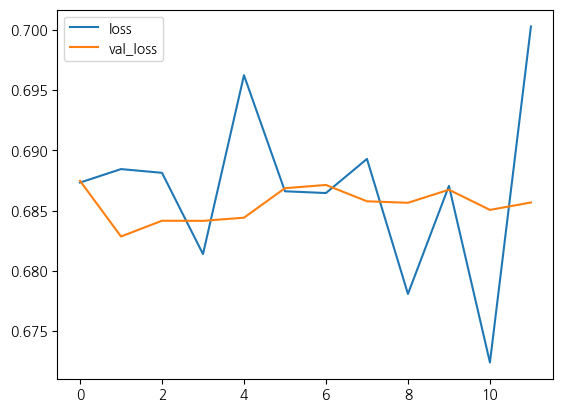

In [516]:
hist[['loss', 'val_loss']].plot()

<AxesSubplot: >

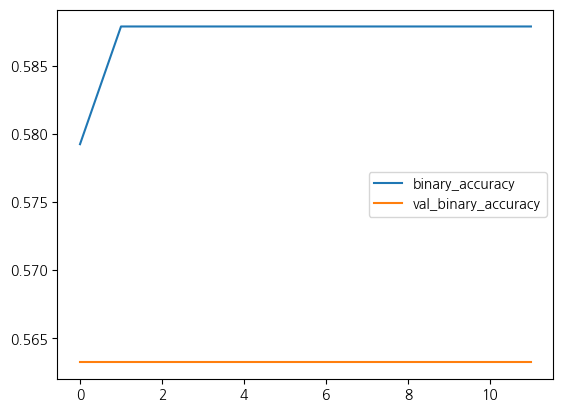

In [517]:
hist[['binary_accuracy', 'val_binary_accuracy']].plot()

In [518]:
y_pred_MM_NN = model.predict(X_test)

4/4 [==============================] - 0s 8ms/step


In [519]:
y_predict_MM_NN = (y_pred_MM_NN.flatten() > 0.5).astype(int)
y_predict_MM_NN

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1])

In [520]:
(y_test_MM == y_predict_MM_NN).mean()

0.5779816513761468

# 10회차

## EDA

In [9]:
ten

,id,view_1,date_1,rating_1,people_1,turnfav_1,commentCount_1,reco_sum_1,reco_mean_1,unreco_sum_1,...,neg_score_sum_10,neg_score_mean_10,negative_10,neutrality_10,positive_10,rate_neg_10,rate_neur_10,rate_pos_10,new_keyword,genre
0,15067,47660,2022-01-05,9.69,310,305,60,301,5.101695,20,...,3,0.125000,3,15,6,0.125000,0.625000,0.250000,정식연재,sports
1,32937,6464,2007-07-19,9.60,559,21,368,89,0.483696,10,...,8,0.126984,2,13,48,0.010101,0.065657,0.242424,"마지막화,에필로그,완결",story
2,50004,552,2006-02-08,6.89,57,1,31,40,1.290323,43,...,1,0.020408,0,27,22,0.000000,0.551020,0.448980,"마지막화,에필로그,완결",story
3,50196,7591,2008-10-28,9.70,963,37,447,459,1.026846,11,...,6,0.054054,3,44,64,0.027027,0.396396,0.576577,"마지막화,에필로그,완결",story
4,53694,49517,2008-12-12,9.65,1622,154,1243,1015,0.821862,136,...,256,0.152290,177,882,622,0.105232,0.524376,0.369798,"마지막화,에필로그,완결",omnibus
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
468,792314,16566,2022-03-16,8.66,121,67,22,62,2.818182,2,...,1,0.066667,1,1,13,0.066667,0.066667,0.866667,정식연재,sports
469,792936,45811,2022-03-30,7.14,460,247,90,1570,19.873418,397,...,5,0.135135,1,21,15,0.025641,0.538462,0.384615,"마지막화,에필로그,완결",pure
470,792942,8931,2022-03-28,8.01,122,41,21,107,5.350000,68,...,3,0.300000,1,4,5,0.100000,0.400000,0.500000,"마지막화,에필로그,완결",drama
471,793203,33883,2022-04-02,9.85,270,221,28,317,11.321429,17,...,5,0.277778,0,5,13,0.000000,0.277778,0.722222,"마지막화,에필로그,완결",drama


In [307]:
ten.shape

(473, 203)

In [310]:
ten.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 473 entries, 0 to 472
Columns: 203 entries, id to genre
dtypes: float64(80), int64(111), object(12)
memory usage: 750.3+ KB


In [308]:
ten.describe()

,id,view_1,rating_1,people_1,turnfav_1,commentCount_1,reco_sum_1,reco_mean_1,unreco_sum_1,unreco_mean_1,...,pos_score_sum_10,pos_score_mean_10,neg_score_sum_10,neg_score_mean_10,negative_10,neutrality_10,positive_10,rate_neg_10,rate_neur_10,rate_pos_10
count,473.000000,4.730000e+02,473.000000,473.000000,473.000000,473.000000,473.000000,473.000000,473.000000,473.000000,...,473.000000,473.000000,473.000000,473.000000,473.000000,473.000000,473.000000,473.000000,473.000000,473.000000
mean,597530.985201,1.164710e+05,9.681797,1040.731501,475.579281,139.295983,1656.938689,13.804716,146.122622,1.204740,...,114.103594,1.115751,22.114165,0.192027,8.587738,49.082452,59.416490,0.067317,0.372696,0.556090
std,187919.688140,1.969605e+05,0.308051,1203.704019,743.992621,227.524186,3295.374908,13.228097,619.653161,2.074823,...,180.522863,0.459890,42.140349,0.114692,19.577779,130.035717,96.190147,0.057163,0.138554,0.159478
min,15067.000000,1.580000e+02,6.890000,55.000000,0.000000,5.000000,0.000000,0.000000,0.000000,0.000000,...,2.000000,0.166667,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.142857
25%,559738.000000,1.419900e+04,9.640000,337.000000,82.000000,36.000000,214.000000,4.520833,17.000000,0.323574,...,25.000000,0.818182,4.000000,0.111111,1.000000,8.000000,13.000000,0.029412,0.285714,0.448718
50%,664628.000000,4.951700e+04,9.770000,688.000000,237.000000,68.000000,602.000000,10.618182,47.000000,0.846154,...,55.000000,1.048583,9.000000,0.176471,3.000000,18.000000,28.000000,0.058824,0.363636,0.552632
75%,719639.000000,1.273460e+05,9.850000,1313.000000,565.000000,141.000000,1564.000000,19.531599,125.000000,1.492537,...,119.000000,1.354839,20.000000,0.250000,8.000000,41.000000,59.000000,0.090909,0.458333,0.666667
max,796167.000000,1.640501e+06,9.950000,11238.000000,7178.000000,1960.000000,31867.000000,88.251497,12638.000000,36.953216,...,1352.000000,2.891304,404.000000,0.666667,185.000000,2082.000000,779.000000,0.400000,0.800000,1.000000


In [509]:
ten.isnull().sum().sum()

0

### view plot

In [10]:
ten_view_avg = ten.groupby("new_keyword")[["view_1", "view_2", "view_3", "view_4", "view_5", "view_6", "view_7", "view_8", "view_9", "view_10"]].mean().T
ten_view_min = ten.groupby("new_keyword")[["view_1", "view_2", "view_3", "view_4", "view_5", "view_6", "view_7", "view_8", "view_9", "view_10"]].min().T
ten_view_mid = ten.groupby("new_keyword")[["view_1", "view_2", "view_3", "view_4", "view_5", "view_6", "view_7", "view_8", "view_9", "view_10"]].median().T
ten_view_max = ten.groupby("new_keyword")[["view_1", "view_2", "view_3", "view_4", "view_5", "view_6", "view_7", "view_8", "view_9", "view_10"]].max().T

<AxesSubplot: >

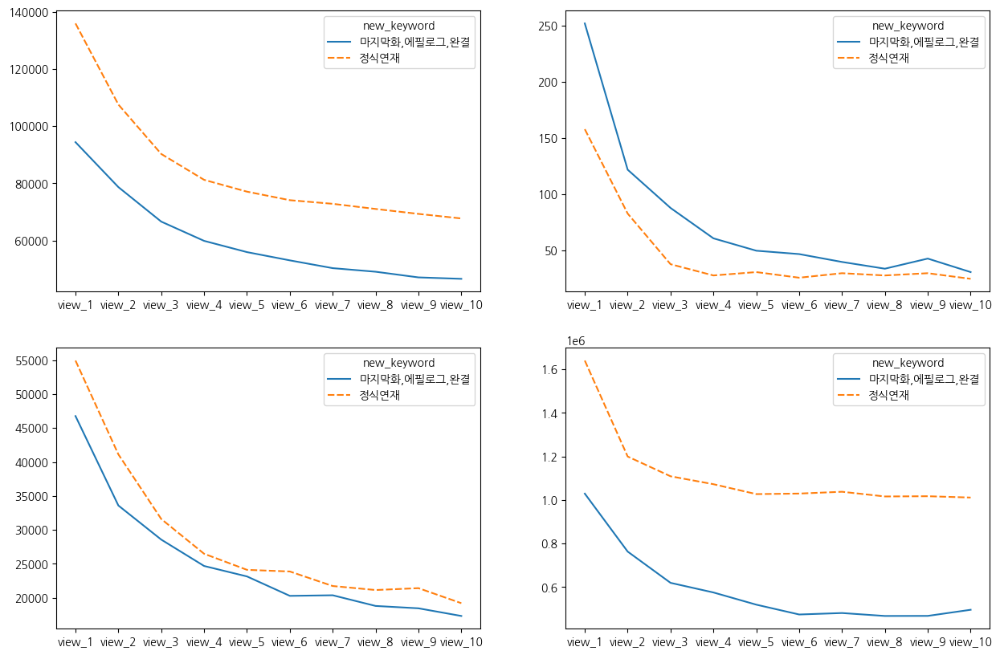

In [336]:
fig, ax = plt.subplots(figsize = (15,10), nrows=2, ncols=2)
sns.lineplot(ten_view_avg, ax = ax[0][0])
sns.lineplot(ten_view_min, ax = ax[0][1])
sns.lineplot(ten_view_mid, ax = ax[1][0])
sns.lineplot(ten_view_max, ax = ax[1][1])

### rating plot

<AxesSubplot: >

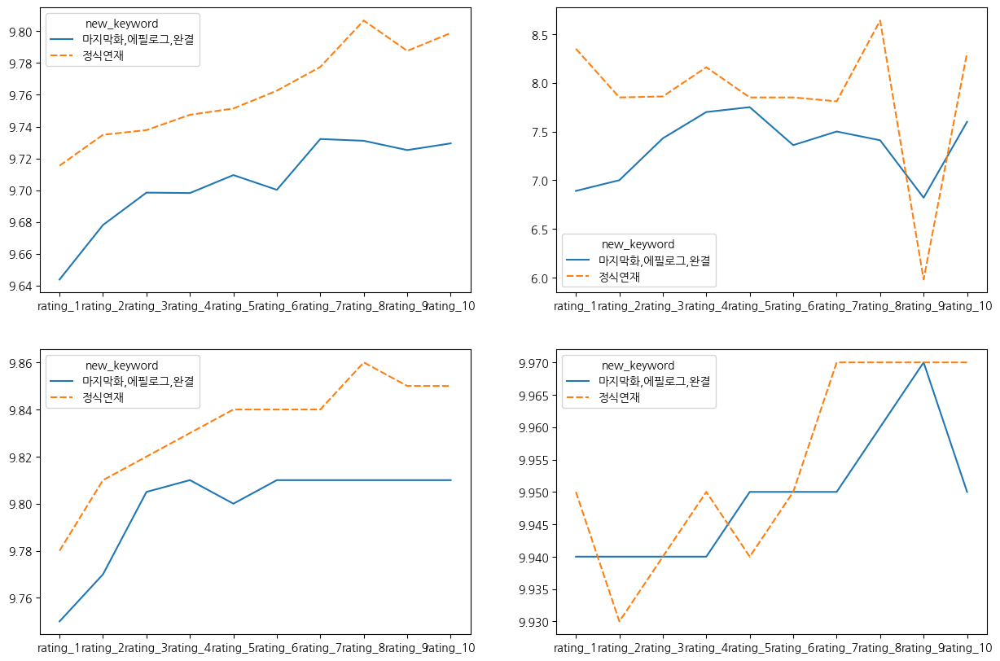

In [11]:
ten_rating_avg = ten.groupby("new_keyword")[["rating_1", "rating_2", "rating_3", "rating_4", "rating_5", "rating_6", "rating_7", "rating_8", "rating_9", "rating_10"]].mean().T
ten_rating_min = ten.groupby("new_keyword")[["rating_1", "rating_2", "rating_3", "rating_4", "rating_5", "rating_6", "rating_7", "rating_8", "rating_9", "rating_10"]].min().T
ten_rating_mid = ten.groupby("new_keyword")[["rating_1", "rating_2", "rating_3", "rating_4", "rating_5", "rating_6", "rating_7", "rating_8", "rating_9", "rating_10"]].median().T
ten_rating_max = ten.groupby("new_keyword")[["rating_1", "rating_2", "rating_3", "rating_4", "rating_5", "rating_6", "rating_7", "rating_8", "rating_9", "rating_10"]].max().T

fig, ax = plt.subplots(figsize = (15,10), nrows=2, ncols=2)
sns.lineplot(ten_rating_avg, ax = ax[0][0])
sns.lineplot(ten_rating_min, ax = ax[0][1])
sns.lineplot(ten_rating_mid, ax = ax[1][0])
sns.lineplot(ten_rating_max, ax = ax[1][1])

In [354]:
ten[["id", "rating_9", "new_keyword"]].sort_values(by = "rating_9")

,id,rating_9,new_keyword
367,723033,5.98,정식연재
2,50004,6.82,"마지막화,에필로그,완결"
93,497022,8.04,"마지막화,에필로그,완결"
469,792936,8.23,"마지막화,에필로그,완결"
468,792314,8.41,정식연재
...,...,...,...
139,587799,9.96,정식연재
416,745424,9.96,정식연재
427,756412,9.96,정식연재
214,651926,9.97,정식연재


* https://comic.naver.com/bestChallenge/detail?titleId=723033&no=10
* 평점 뿐만 아니라 연재 로그에도 이상이 있는 것으로 생각됨

### like plot

<AxesSubplot: >

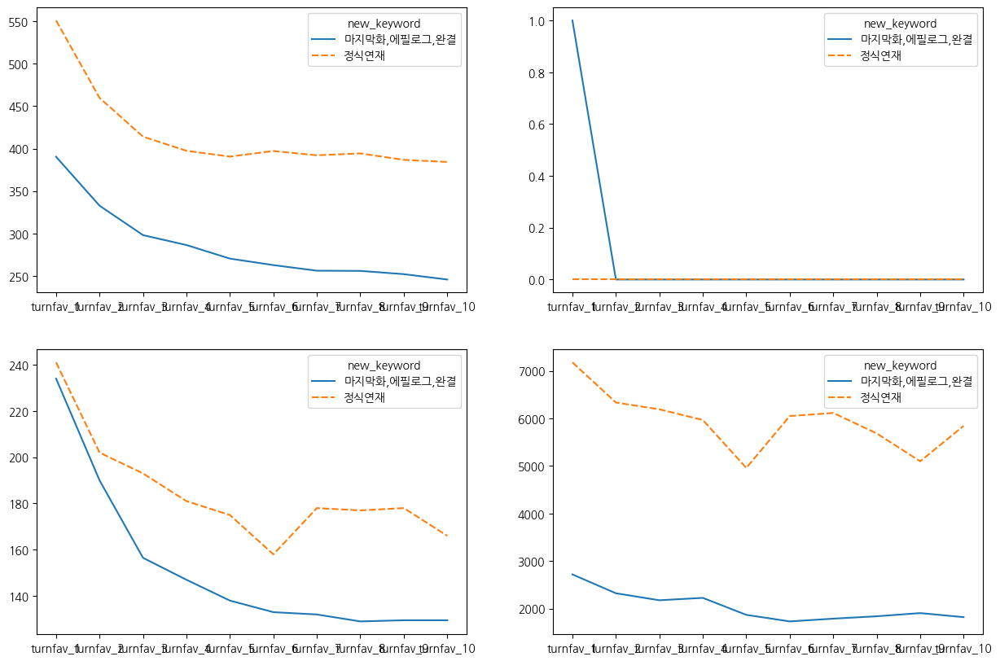

In [12]:
ten_turnfav_avg = ten.groupby("new_keyword")[["turnfav_1", "turnfav_2", "turnfav_3", "turnfav_4", "turnfav_5", "turnfav_6", "turnfav_7", "turnfav_8", "turnfav_9", "turnfav_10"]].mean().T
ten_turnfav_min = ten.groupby("new_keyword")[["turnfav_1", "turnfav_2", "turnfav_3", "turnfav_4", "turnfav_5", "turnfav_6", "turnfav_7", "turnfav_8", "turnfav_9", "turnfav_10"]].min().T
ten_turnfav_mid = ten.groupby("new_keyword")[["turnfav_1", "turnfav_2", "turnfav_3", "turnfav_4", "turnfav_5", "turnfav_6", "turnfav_7", "turnfav_8", "turnfav_9", "turnfav_10"]].median().T
ten_turnfav_max = ten.groupby("new_keyword")[["turnfav_1", "turnfav_2", "turnfav_3", "turnfav_4", "turnfav_5", "turnfav_6", "turnfav_7", "turnfav_8", "turnfav_9", "turnfav_10"]].max().T

fig, ax = plt.subplots(figsize = (15,10), nrows=2, ncols=2)
sns.lineplot(ten_turnfav_avg, ax = ax[0][0])
sns.lineplot(ten_turnfav_min, ax = ax[0][1])
sns.lineplot(ten_turnfav_mid, ax = ax[1][0])
sns.lineplot(ten_turnfav_max, ax = ax[1][1])

In [365]:
ten[["id", "rating_9", "new_keyword", "turnfav_2", "date_2"]].sort_values(by = "turnfav_2")

,id,rating_9,new_keyword,turnfav_2,date_2
30,154272,9.46,정식연재,0,2010-04-20
2,50004,6.82,"마지막화,에필로그,완결",0,2006-02-10
16,81092,9.01,"마지막화,에필로그,완결",0,2009-08-24
56,340152,9.81,정식연재,0,2011-06-13
41,243306,8.61,"마지막화,에필로그,완결",1,2010-10-11
...,...,...,...,...,...
225,657945,9.91,정식연재,3378,2015-07-08
238,666179,9.88,정식연재,3465,2015-11-04
138,587576,9.91,정식연재,4165,2013-09-19
224,657803,9.90,정식연재,4740,2016-04-15


In [13]:
# pd.to_datetime(ten[["date_1", "date_2", "date_3", "date_4", "date_5", "date_6", "date_7", "date_8" ,"date_9", "date_10"]])
ten["date_1"] = pd.to_datetime(ten["date_1"])
ten["date_2"] = pd.to_datetime(ten["date_2"])
ten["date_3"] = pd.to_datetime(ten["date_3"])
ten["date_4"] = pd.to_datetime(ten["date_4"])
ten["date_5"] = pd.to_datetime(ten["date_5"])
ten["date_6"] = pd.to_datetime(ten["date_6"])
ten["date_7"] = pd.to_datetime(ten["date_7"])
ten["date_8"] = pd.to_datetime(ten["date_8"])
ten["date_9"] = pd.to_datetime(ten["date_9"])
ten["date_10"] = pd.to_datetime(ten["date_10"])

In [389]:
ten[(ten["date_2"] < "2012-01-01")][["id", "rating_9", "new_keyword", "turnfav_2", "date_2"]].sort_values(by = "turnfav_2")

,id,rating_9,new_keyword,turnfav_2,date_2
2,50004,6.82,"마지막화,에필로그,완결",0,2006-02-10
30,154272,9.46,정식연재,0,2010-04-20
16,81092,9.01,"마지막화,에필로그,완결",0,2009-08-24
56,340152,9.81,정식연재,0,2011-06-13
41,243306,8.61,"마지막화,에필로그,완결",1,2010-10-11
...,...,...,...,...,...
42,245153,9.83,"마지막화,에필로그,완결",238,2010-10-10
55,330616,9.83,"마지막화,에필로그,완결",273,2011-05-18
10,66465,9.75,정식연재,307,2009-05-01
18,86400,9.82,정식연재,380,2009-09-25


### people plot

<AxesSubplot: >

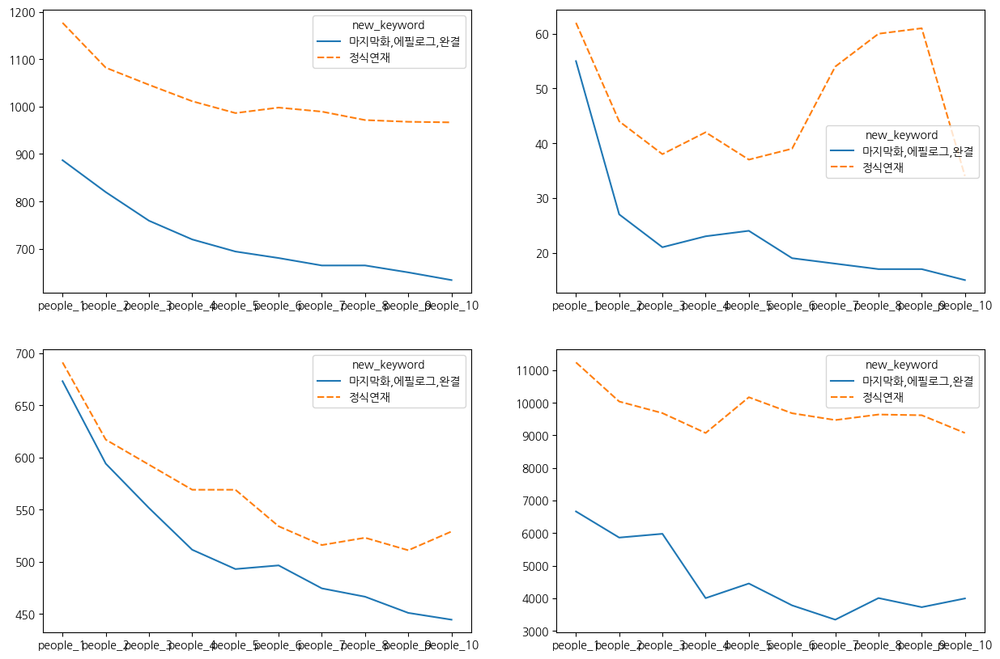

In [14]:
ten_people_avg = ten.groupby("new_keyword")[["people_1", "people_2", "people_3", "people_4", "people_5", "people_6", "people_7", "people_8", "people_9", "people_10"]].mean().T
ten_people_min = ten.groupby("new_keyword")[["people_1", "people_2", "people_3", "people_4", "people_5", "people_6", "people_7", "people_8", "people_9", "people_10"]].min().T
ten_people_mid = ten.groupby("new_keyword")[["people_1", "people_2", "people_3", "people_4", "people_5", "people_6", "people_7", "people_8", "people_9", "people_10"]].median().T
ten_people_max = ten.groupby("new_keyword")[["people_1", "people_2", "people_3", "people_4", "people_5", "people_6", "people_7", "people_8", "people_9", "people_10"]].max().T

fig, ax = plt.subplots(figsize = (15,10), nrows=2, ncols=2)
sns.lineplot(ten_people_avg, ax = ax[0][0])
sns.lineplot(ten_people_min, ax = ax[0][1])
sns.lineplot(ten_people_mid, ax = ax[1][0])
sns.lineplot(ten_people_max, ax = ax[1][1])

In [468]:
ten[["id", "new_keyword", "date_9", "date_10", "rating_9", "rating_10", "turnfav_9","turnfav_10", "people_8","people_9", "people_10"]].sort_values(by = ["people_10"])

,id,new_keyword,date_9,date_10,rating_9,rating_10,turnfav_9,turnfav_10,people_8,people_9,people_10
2,50004,"마지막화,에필로그,완결",2006-02-27,2006-03-01,6.82,7.60,0,0,17,17,15
123,564789,정식연재,2015-05-22,2017-02-01,9.78,9.21,93,29,96,208,34
175,626184,"마지막화,에필로그,완결",2014-08-12,2014-08-18,9.55,9.29,5,8,44,40,38
386,730958,"마지막화,에필로그,완결",2019-09-01,2019-09-08,9.41,9.39,21,15,47,46,44
462,787297,"마지막화,에필로그,완결",2022-02-21,2022-02-28,9.44,9.60,22,19,50,48,45
...,...,...,...,...,...,...,...,...,...,...,...
224,657803,정식연재,2016-06-29,2016-07-14,9.90,9.90,3963,4740,5409,4189,4886
89,489585,정식연재,2013-08-16,2013-08-20,9.84,9.91,152,127,7309,8386,6342
249,674218,정식연재,2016-05-06,2016-05-09,9.91,9.92,5098,5844,6441,5787,6423
77,461059,정식연재,2012-06-11,2012-06-18,9.86,9.86,679,669,7174,7119,7740


* https://comic.naver.com/bestChallenge/list?titleId=564789
 * 정식연재 - 좋아요 최저지표에서 9회차 이후 10회차에서 정식연재 공지
 * 축하의 의미로 비 정상적으로 참여 인원이 늘어난 것으로 판단

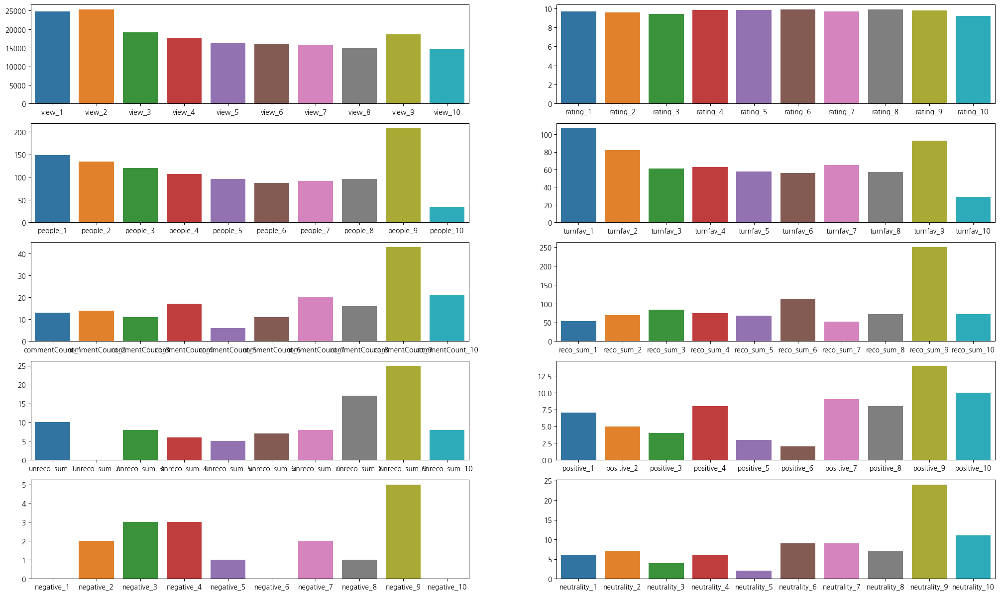

In [504]:
total_barplots(564789)

<AxesSubplot: >

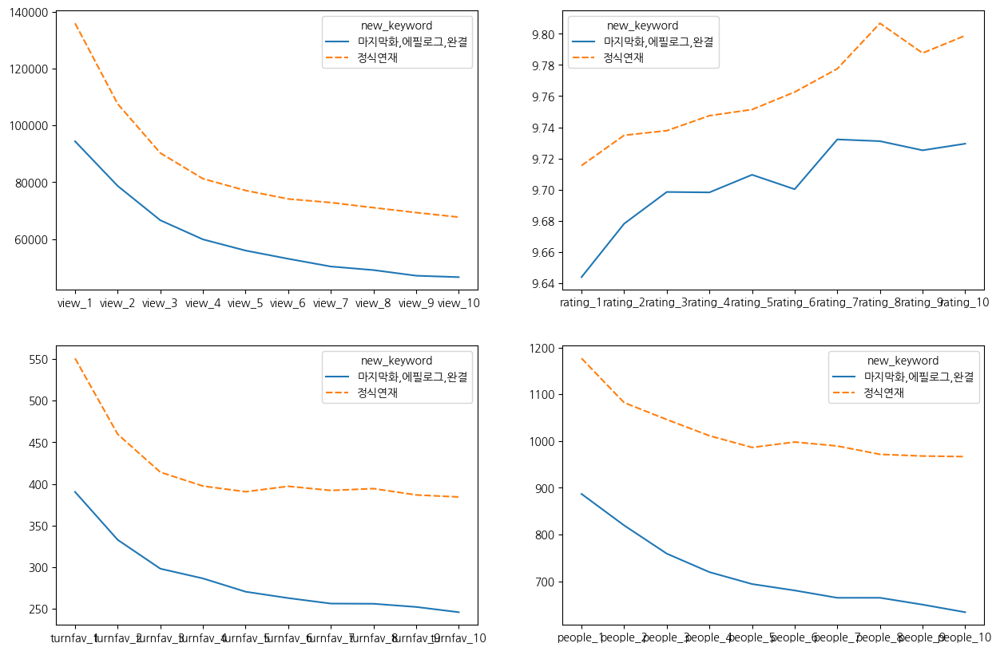

In [15]:
fig, ax = plt.subplots(figsize = (15,10), nrows=2, ncols=2)
sns.lineplot(ten_view_avg, ax = ax[0][0])
sns.lineplot(ten_rating_avg, ax = ax[0][1])
sns.lineplot(ten_turnfav_avg, ax = ax[1][0])
sns.lineplot(ten_people_avg, ax = ax[1][1])

### Sum of rate plot

In [407]:
ten["ratesum_1"] = ten["rating_1"]*ten["people_1"]
ten["ratesum_2"] = ten["rating_2"]*ten["people_2"]
ten["ratesum_3"] = ten["rating_3"]*ten["people_3"]
ten["ratesum_4"] = ten["rating_4"]*ten["people_4"]
ten["ratesum_5"] = ten["rating_5"]*ten["people_5"]
ten["ratesum_6"] = ten["rating_6"]*ten["people_6"]
ten["ratesum_7"] = ten["rating_7"]*ten["people_7"]
ten["ratesum_8"] = ten["rating_8"]*ten["people_8"]
ten["ratesum_9"] = ten["rating_9"]*ten["people_9"]
ten["ratesum_10"] = ten["rating_10"]*ten["people_10"]


<AxesSubplot: >

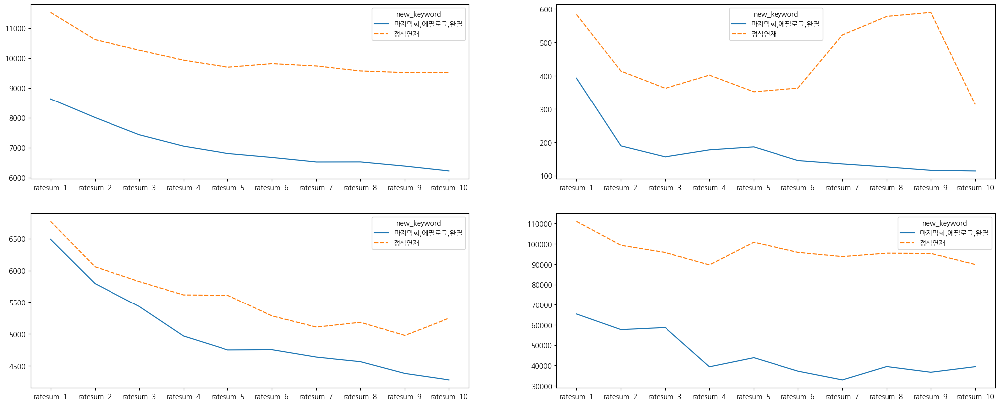

In [409]:
ten_ratesum_avg = ten.groupby("new_keyword")[["ratesum_1", "ratesum_2", "ratesum_3", "ratesum_4", "ratesum_5", "ratesum_6", "ratesum_7", "ratesum_8", "ratesum_9", "ratesum_10"]].mean().T
ten_ratesum_min = ten.groupby("new_keyword")[["ratesum_1", "ratesum_2", "ratesum_3", "ratesum_4", "ratesum_5", "ratesum_6", "ratesum_7", "ratesum_8", "ratesum_9", "ratesum_10"]].min().T
ten_ratesum_mid = ten.groupby("new_keyword")[["ratesum_1", "ratesum_2", "ratesum_3", "ratesum_4", "ratesum_5", "ratesum_6", "ratesum_7", "ratesum_8", "ratesum_9", "ratesum_10"]].median().T
ten_ratesum_max = ten.groupby("new_keyword")[["ratesum_1", "ratesum_2", "ratesum_3", "ratesum_4", "ratesum_5", "ratesum_6", "ratesum_7", "ratesum_8", "ratesum_9", "ratesum_10"]].max().T

fig, ax = plt.subplots(figsize = (25,10), nrows=2, ncols=2)
sns.lineplot(ten_ratesum_avg, ax = ax[0][0])
sns.lineplot(ten_ratesum_min, ax = ax[0][1])
sns.lineplot(ten_ratesum_mid, ax = ax[1][0])
sns.lineplot(ten_ratesum_max, ax = ax[1][1])

### comments plot

<AxesSubplot: >

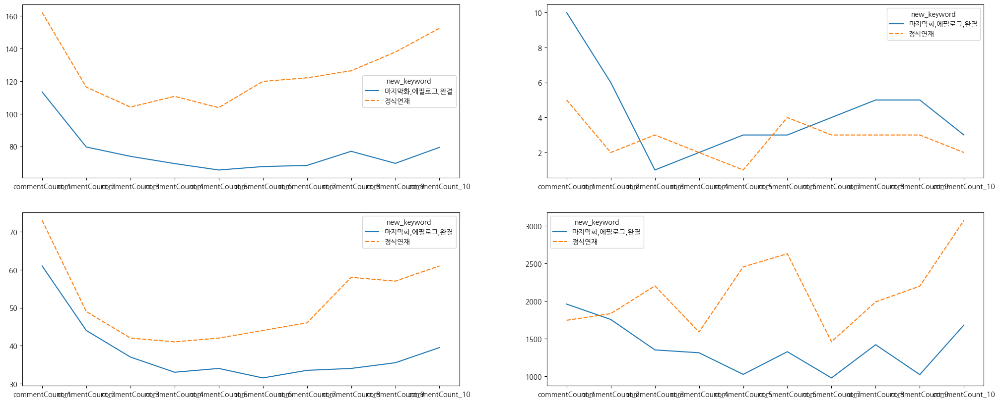

In [422]:
# commentCount
ten_commentCount_avg = ten.groupby("new_keyword")[["commentCount_1", "commentCount_2", "commentCount_3", "commentCount_4", "commentCount_5", "commentCount_6", "commentCount_7", "commentCount_8", "commentCount_9", "commentCount_10"]].mean().T
ten_commentCount_min = ten.groupby("new_keyword")[["commentCount_1", "commentCount_2", "commentCount_3", "commentCount_4", "commentCount_5", "commentCount_6", "commentCount_7", "commentCount_8", "commentCount_9", "commentCount_10"]].min().T
ten_commentCount_mid = ten.groupby("new_keyword")[["commentCount_1", "commentCount_2", "commentCount_3", "commentCount_4", "commentCount_5", "commentCount_6", "commentCount_7", "commentCount_8", "commentCount_9", "commentCount_10"]].median().T
ten_commentCount_max = ten.groupby("new_keyword")[["commentCount_1", "commentCount_2", "commentCount_3", "commentCount_4", "commentCount_5", "commentCount_6", "commentCount_7", "commentCount_8", "commentCount_9", "commentCount_10"]].max().T

fig, ax = plt.subplots(figsize = (25,10), nrows=2, ncols=2)
sns.lineplot(ten_commentCount_avg, ax = ax[0][0])
sns.lineplot(ten_commentCount_min, ax = ax[0][1])
sns.lineplot(ten_commentCount_mid, ax = ax[1][0])
sns.lineplot(ten_commentCount_max, ax = ax[1][1])

### comment reactions

<AxesSubplot: >

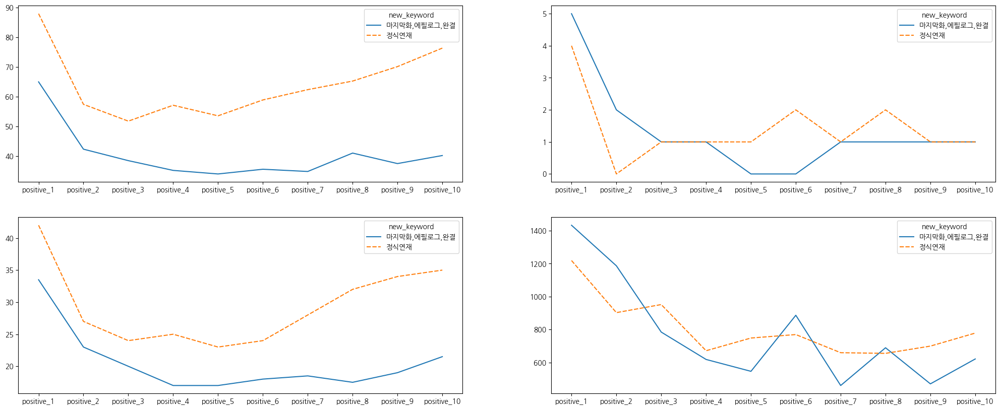

In [418]:
# positive
ten_positive_avg = ten.groupby("new_keyword")[["positive_1", "positive_2", "positive_3", "positive_4", "positive_5", "positive_6", "positive_7", "positive_8", "positive_9", "positive_10"]].mean().T
ten_positive_min = ten.groupby("new_keyword")[["positive_1", "positive_2", "positive_3", "positive_4", "positive_5", "positive_6", "positive_7", "positive_8", "positive_9", "positive_10"]].min().T
ten_positive_mid = ten.groupby("new_keyword")[["positive_1", "positive_2", "positive_3", "positive_4", "positive_5", "positive_6", "positive_7", "positive_8", "positive_9", "positive_10"]].median().T
ten_positive_max = ten.groupby("new_keyword")[["positive_1", "positive_2", "positive_3", "positive_4", "positive_5", "positive_6", "positive_7", "positive_8", "positive_9", "positive_10"]].max().T

fig, ax = plt.subplots(figsize = (25,10), nrows=2, ncols=2)
sns.lineplot(ten_positive_avg, ax = ax[0][0])
sns.lineplot(ten_positive_min, ax = ax[0][1])
sns.lineplot(ten_positive_mid, ax = ax[1][0])
sns.lineplot(ten_positive_max, ax = ax[1][1])

<AxesSubplot: >

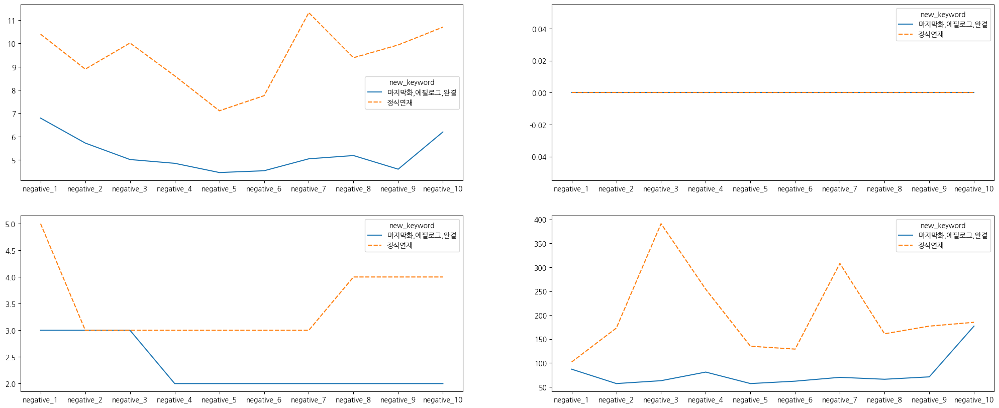

In [419]:
# negative
ten_negative_avg = ten.groupby("new_keyword")[["negative_1", "negative_2", "negative_3", "negative_4", "negative_5", "negative_6", "negative_7", "negative_8", "negative_9", "negative_10"]].mean().T
ten_negative_min = ten.groupby("new_keyword")[["negative_1", "negative_2", "negative_3", "negative_4", "negative_5", "negative_6", "negative_7", "negative_8", "negative_9", "negative_10"]].min().T
ten_negative_mid = ten.groupby("new_keyword")[["negative_1", "negative_2", "negative_3", "negative_4", "negative_5", "negative_6", "negative_7", "negative_8", "negative_9", "negative_10"]].median().T
ten_negative_max = ten.groupby("new_keyword")[["negative_1", "negative_2", "negative_3", "negative_4", "negative_5", "negative_6", "negative_7", "negative_8", "negative_9", "negative_10"]].max().T

fig, ax = plt.subplots(figsize = (25,10), nrows=2, ncols=2)
sns.lineplot(ten_negative_avg, ax = ax[0][0])
sns.lineplot(ten_negative_min, ax = ax[0][1])
sns.lineplot(ten_negative_mid, ax = ax[1][0])
sns.lineplot(ten_negative_max, ax = ax[1][1])

In [503]:
ten[["id", "new_keyword", "date_3", "rating_3", "turnfav_2","commentCount_3" ,"positive_3", "negative_3", "neutrality_3"]].sort_values(by = "negative_3", ascending= False)

,id,new_keyword,date_3,rating_3,turnfav_2,commentCount_3,positive_3,negative_3,neutrality_3
89,489585,정식연재,2013-07-23,9.66,176,2202,952,391,859
54,327056,정식연재,2011-06-14,9.78,74,1002,270,373,359
37,190415,정식연재,2010-12-15,9.62,19,340,132,80,127
33,167100,정식연재,2010-05-27,9.63,1193,934,244,73,616
4,53694,"마지막화,에필로그,완결",2008-12-18,9.76,145,1352,785,63,504
...,...,...,...,...,...,...,...,...,...
395,734419,정식연재,2020-09-26,9.85,120,9,7,0,2
394,734352,"마지막화,에필로그,완결",2019-09-20,9.92,214,19,16,0,3
393,733866,정식연재,2019-09-21,9.75,728,20,14,0,6
323,706927,정식연재,2018-02-19,9.52,46,20,9,0,11


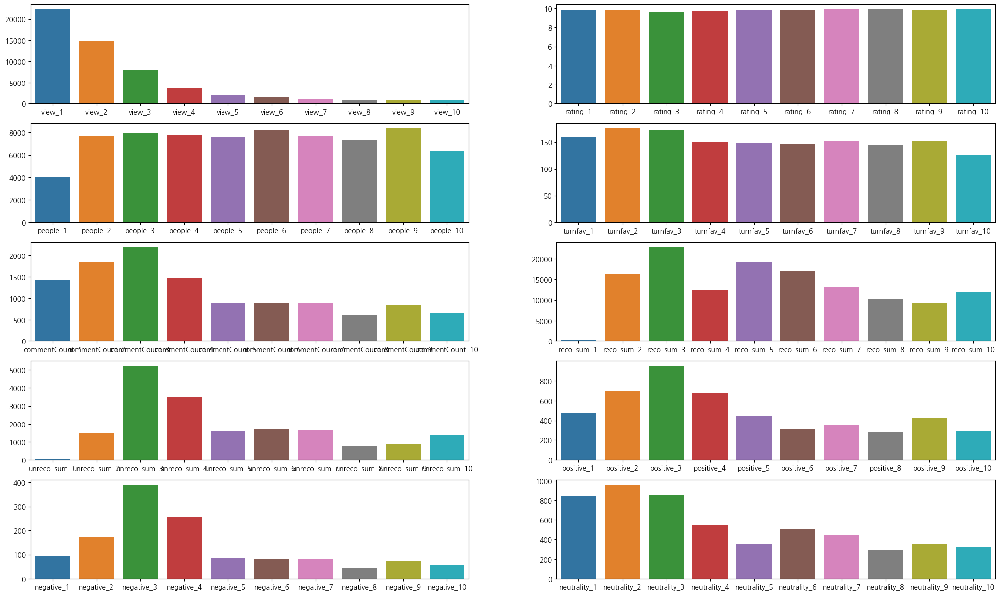

In [502]:
total_barplots(489585)

* 정식연재 중 부정적인 댓글을 가장 많이 받은 웹툰 회차
* 작품 리메이크에 대한 부정적인 반응을 띈 댓글들 대거 작성
* 전체적으로 정식연재된 작품들은 독자들이 꾸준히 봐왔기 때문에 그에 따른 부정적인 반응도 누적되어 높아보이는 경향

<AxesSubplot: >

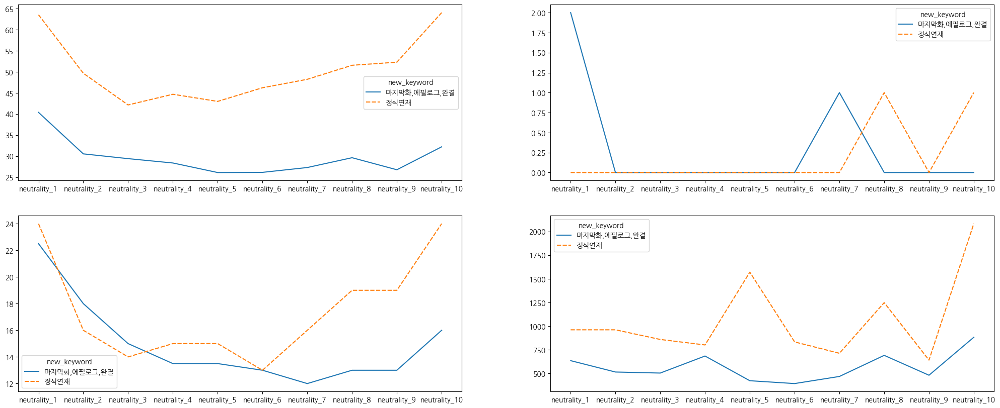

In [420]:
# neutrality
ten_neutrality_avg = ten.groupby("new_keyword")[["neutrality_1", "neutrality_2", "neutrality_3", "neutrality_4", "neutrality_5", "neutrality_6", "neutrality_7", "neutrality_8", "neutrality_9", "neutrality_10"]].mean().T
ten_neutrality_min = ten.groupby("new_keyword")[["neutrality_1", "neutrality_2", "neutrality_3", "neutrality_4", "neutrality_5", "neutrality_6", "neutrality_7", "neutrality_8", "neutrality_9", "neutrality_10"]].min().T
ten_neutrality_mid = ten.groupby("new_keyword")[["neutrality_1", "neutrality_2", "neutrality_3", "neutrality_4", "neutrality_5", "neutrality_6", "neutrality_7", "neutrality_8", "neutrality_9", "neutrality_10"]].median().T
ten_neutrality_max = ten.groupby("new_keyword")[["neutrality_1", "neutrality_2", "neutrality_3", "neutrality_4", "neutrality_5", "neutrality_6", "neutrality_7", "neutrality_8", "neutrality_9", "neutrality_10"]].max().T

fig, ax = plt.subplots(figsize = (25,10), nrows=2, ncols=2)
sns.lineplot(ten_neutrality_avg, ax = ax[0][0])
sns.lineplot(ten_neutrality_min, ax = ax[0][1])
sns.lineplot(ten_neutrality_mid, ax = ax[1][0])
sns.lineplot(ten_neutrality_max, ax = ax[1][1])

### rates of recommend/unrecommend on comments

<AxesSubplot: >

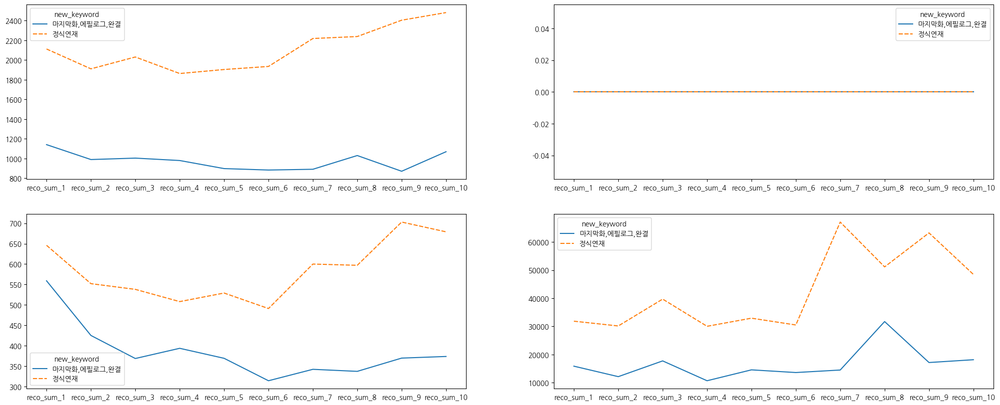

In [423]:
# reco_sum
ten_reco_sum_avg = ten.groupby("new_keyword")[["reco_sum_1", "reco_sum_2", "reco_sum_3", "reco_sum_4", "reco_sum_5", "reco_sum_6", "reco_sum_7", "reco_sum_8", "reco_sum_9", "reco_sum_10"]].mean().T
ten_reco_sum_min = ten.groupby("new_keyword")[["reco_sum_1", "reco_sum_2", "reco_sum_3", "reco_sum_4", "reco_sum_5", "reco_sum_6", "reco_sum_7", "reco_sum_8", "reco_sum_9", "reco_sum_10"]].min().T
ten_reco_sum_mid = ten.groupby("new_keyword")[["reco_sum_1", "reco_sum_2", "reco_sum_3", "reco_sum_4", "reco_sum_5", "reco_sum_6", "reco_sum_7", "reco_sum_8", "reco_sum_9", "reco_sum_10"]].median().T
ten_reco_sum_max = ten.groupby("new_keyword")[["reco_sum_1", "reco_sum_2", "reco_sum_3", "reco_sum_4", "reco_sum_5", "reco_sum_6", "reco_sum_7", "reco_sum_8", "reco_sum_9", "reco_sum_10"]].max().T

fig, ax = plt.subplots(figsize = (25,10), nrows=2, ncols=2)
sns.lineplot(ten_reco_sum_avg, ax = ax[0][0])
sns.lineplot(ten_reco_sum_min, ax = ax[0][1])
sns.lineplot(ten_reco_sum_mid, ax = ax[1][0])
sns.lineplot(ten_reco_sum_max, ax = ax[1][1])

<AxesSubplot: >

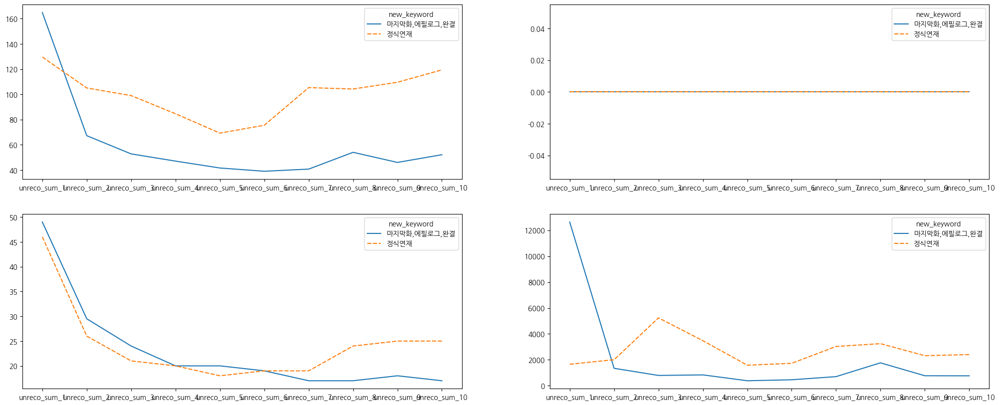

In [424]:
# unreco_sum
ten_unreco_sum_avg = ten.groupby("new_keyword")[["unreco_sum_1", "unreco_sum_2", "unreco_sum_3", "unreco_sum_4", "unreco_sum_5", "unreco_sum_6", "unreco_sum_7", "unreco_sum_8", "unreco_sum_9", "unreco_sum_10"]].mean().T
ten_unreco_sum_min = ten.groupby("new_keyword")[["unreco_sum_1", "unreco_sum_2", "unreco_sum_3", "unreco_sum_4", "unreco_sum_5", "unreco_sum_6", "unreco_sum_7", "unreco_sum_8", "unreco_sum_9", "unreco_sum_10"]].min().T
ten_unreco_sum_mid = ten.groupby("new_keyword")[["unreco_sum_1", "unreco_sum_2", "unreco_sum_3", "unreco_sum_4", "unreco_sum_5", "unreco_sum_6", "unreco_sum_7", "unreco_sum_8", "unreco_sum_9", "unreco_sum_10"]].median().T
ten_unreco_sum_max = ten.groupby("new_keyword")[["unreco_sum_1", "unreco_sum_2", "unreco_sum_3", "unreco_sum_4", "unreco_sum_5", "unreco_sum_6", "unreco_sum_7", "unreco_sum_8", "unreco_sum_9", "unreco_sum_10"]].max().T

fig, ax = plt.subplots(figsize = (25,10), nrows=2, ncols=2)
sns.lineplot(ten_unreco_sum_avg, ax = ax[0][0])
sns.lineplot(ten_unreco_sum_min, ax = ax[0][1])
sns.lineplot(ten_unreco_sum_mid, ax = ax[1][0])
sns.lineplot(ten_unreco_sum_max, ax = ax[1][1])

In [435]:
ten[["id", "new_keyword" , "rating_1", "turnfav_1", "positive_1", "negative_1", "neutrality_1", "reco_sum_1","unreco_sum_1"]].sort_values(by = "unreco_sum_1", ascending= False)

,id,new_keyword,rating_1,turnfav_1,positive_1,negative_1,neutrality_1,reco_sum_1,unreco_sum_1
371,724777,"마지막화,에필로그,완결",8.60,1388,135,75,132,13271,12638
110,540040,"마지막화,에필로그,완결",9.89,247,121,32,105,7205,2986
138,587576,정식연재,9.88,5616,405,37,237,31867,1654
309,701921,정식연재,9.78,1386,57,14,106,9742,1408
373,727585,정식연재,9.83,2618,125,15,67,5195,1212
...,...,...,...,...,...,...,...,...,...
450,769614,"마지막화,에필로그,완결",9.75,277,7,0,8,151,0
21,105527,"마지막화,에필로그,완결",9.49,3,41,1,36,3,0
446,767793,정식연재,9.15,68,17,1,4,40,0
35,187528,"마지막화,에필로그,완결",9.57,27,162,5,32,78,0


In [515]:
ten[ten["new_keyword"] == "정식연재"]["unreco_sum_1"].mean()

129.58565737051794

In [516]:
ten[ten["new_keyword"] == "마지막화,에필로그,완결"]["unreco_sum_1"].mean()

164.81981981981983

In [521]:
(ten[ten["new_keyword"] == "마지막화,에필로그,완결"]["unreco_sum_1"].sum() - 12638) / 472

50.74576271186441

* https://comic.naver.com/bestChallenge/list?titleId=724777
* 동성애 커플의 일상툰
* 주제에 대한 강한 호불호가 비 정상적인 댓글비추천 합계로 나타난 것으로 판단

In [489]:
ten[ten["id"] == 724777]

,id,view_1,date_1,rating_1,people_1,turnfav_1,commentCount_1,reco_sum_1,reco_mean_1,unreco_sum_1,...,neg_score_sum_10,neg_score_mean_10,negative_10,neutrality_10,positive_10,rate_neg_10,rate_neur_10,rate_pos_10,new_keyword,genre
371,724777,187637,2019-02-18,8.6,2596,1388,361,13271,38.804094,12638,...,8,0.228571,3,11,21,0.085714,0.314286,0.6,"마지막화,에필로그,완결",daily


In [34]:
def total_barplots(id):
    fig, ax = plt.subplots(figsize = (25,15), nrows=5, ncols=2)
    sns.barplot(ten[ten["id"] == id][["view_1", "view_2", "view_3", "view_4", "view_5", "view_6", "view_7", "view_8", "view_9", "view_10"]], ax = ax[0][0])
    sns.barplot(ten[ten["id"] == id][["rating_1", "rating_2", "rating_3", "rating_4", "rating_5", "rating_6", "rating_7", "rating_8", "rating_9", "rating_10"]], ax = ax[0][1])
    sns.barplot(ten[ten["id"] == id][["people_1", "people_2", "people_3", "people_4", "people_5", "people_6", "people_7", "people_8", "people_9", "people_10"]], ax = ax[1][0])
    sns.barplot(ten[ten["id"] == id][["turnfav_1", "turnfav_2", "turnfav_3", "turnfav_4", "turnfav_5", "turnfav_6", "turnfav_7", "turnfav_8", "turnfav_9", "turnfav_10"]], ax = ax[1][1])
    sns.barplot(ten[ten["id"] == id][["commentCount_1", "commentCount_2", "commentCount_3", "commentCount_4", "commentCount_5", "commentCount_6", "commentCount_7", "commentCount_8", "commentCount_9", "commentCount_10"]], ax = ax[2][0])
    sns.barplot(ten[ten["id"] == id][["reco_sum_1", "reco_sum_2", "reco_sum_3", "reco_sum_4", "reco_sum_5", "reco_sum_6", "reco_sum_7", "reco_sum_8", "reco_sum_9", "reco_sum_10"]], ax = ax[2][1])
    sns.barplot(ten[ten["id"] == id][["unreco_sum_1", "unreco_sum_2", "unreco_sum_3", "unreco_sum_4", "unreco_sum_5", "unreco_sum_6", "unreco_sum_7", "unreco_sum_8", "unreco_sum_9", "unreco_sum_10"]], ax = ax[3][0])
    sns.barplot(ten[ten["id"] == id][["positive_1", "positive_2", "positive_3", "positive_4", "positive_5", "positive_6", "positive_7", "positive_8", "positive_9", "positive_10"]], ax = ax[3][1])
    sns.barplot(ten[ten["id"] == id][["negative_1", "negative_2", "negative_3", "negative_4", "negative_5", "negative_6", "negative_7", "negative_8", "negative_9", "negative_10"]], ax = ax[4][0])
    sns.barplot(ten[ten["id"] == id][["neutrality_1", "neutrality_2", "neutrality_3", "neutrality_4", "neutrality_5", "neutrality_6", "neutrality_7", "neutrality_8", "neutrality_9", "neutrality_10"]], ax = ax[4][1])

<AxesSubplot: >

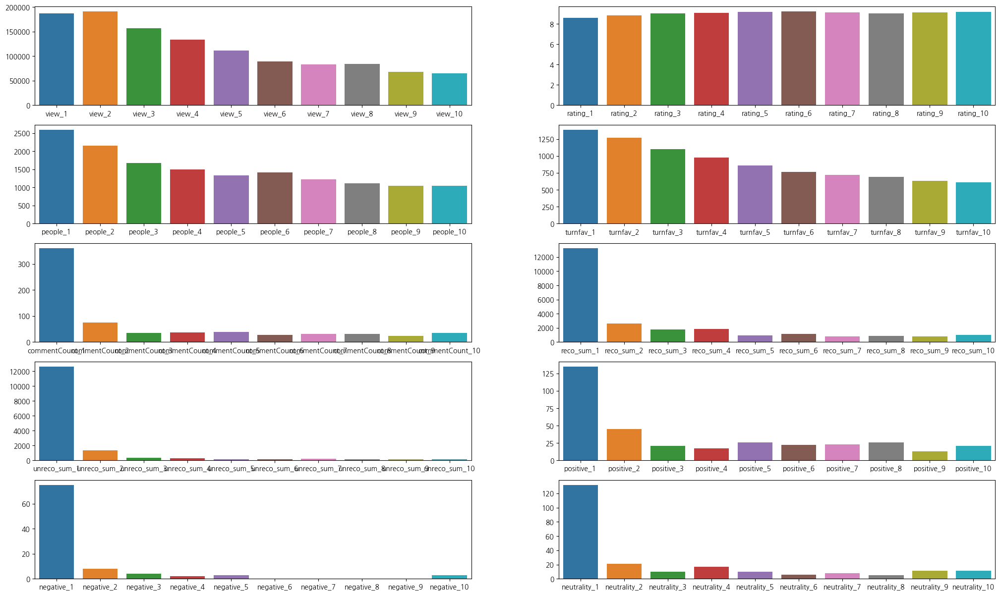

In [493]:
fig, ax = plt.subplots(figsize = (25,15), nrows=5, ncols=2)
sns.barplot(ten[ten["id"] == 724777][["view_1", "view_2", "view_3", "view_4", "view_5", "view_6", "view_7", "view_8", "view_9", "view_10"]], ax = ax[0][0])
sns.barplot(ten[ten["id"] == 724777][["rating_1", "rating_2", "rating_3", "rating_4", "rating_5", "rating_6", "rating_7", "rating_8", "rating_9", "rating_10"]], ax = ax[0][1])
sns.barplot(ten[ten["id"] == 724777][["people_1", "people_2", "people_3", "people_4", "people_5", "people_6", "people_7", "people_8", "people_9", "people_10"]], ax = ax[1][0])
sns.barplot(ten[ten["id"] == 724777][["turnfav_1", "turnfav_2", "turnfav_3", "turnfav_4", "turnfav_5", "turnfav_6", "turnfav_7", "turnfav_8", "turnfav_9", "turnfav_10"]], ax = ax[1][1])
sns.barplot(ten[ten["id"] == 724777][["commentCount_1", "commentCount_2", "commentCount_3", "commentCount_4", "commentCount_5", "commentCount_6", "commentCount_7", "commentCount_8", "commentCount_9", "commentCount_10"]], ax = ax[2][0])
sns.barplot(ten[ten["id"] == 724777][["reco_sum_1", "reco_sum_2", "reco_sum_3", "reco_sum_4", "reco_sum_5", "reco_sum_6", "reco_sum_7", "reco_sum_8", "reco_sum_9", "reco_sum_10"]], ax = ax[2][1])
sns.barplot(ten[ten["id"] == 724777][["unreco_sum_1", "unreco_sum_2", "unreco_sum_3", "unreco_sum_4", "unreco_sum_5", "unreco_sum_6", "unreco_sum_7", "unreco_sum_8", "unreco_sum_9", "unreco_sum_10"]], ax = ax[3][0])
sns.barplot(ten[ten["id"] == 724777][["positive_1", "positive_2", "positive_3", "positive_4", "positive_5", "positive_6", "positive_7", "positive_8", "positive_9", "positive_10"]], ax = ax[3][1])
sns.barplot(ten[ten["id"] == 724777][["negative_1", "negative_2", "negative_3", "negative_4", "negative_5", "negative_6", "negative_7", "negative_8", "negative_9", "negative_10"]], ax = ax[4][0])
sns.barplot(ten[ten["id"] == 724777][["neutrality_1", "neutrality_2", "neutrality_3", "neutrality_4", "neutrality_5", "neutrality_6", "neutrality_7", "neutrality_8", "neutrality_9", "neutrality_10"]], ax = ax[4][1])

### Overview of comments

<AxesSubplot: >

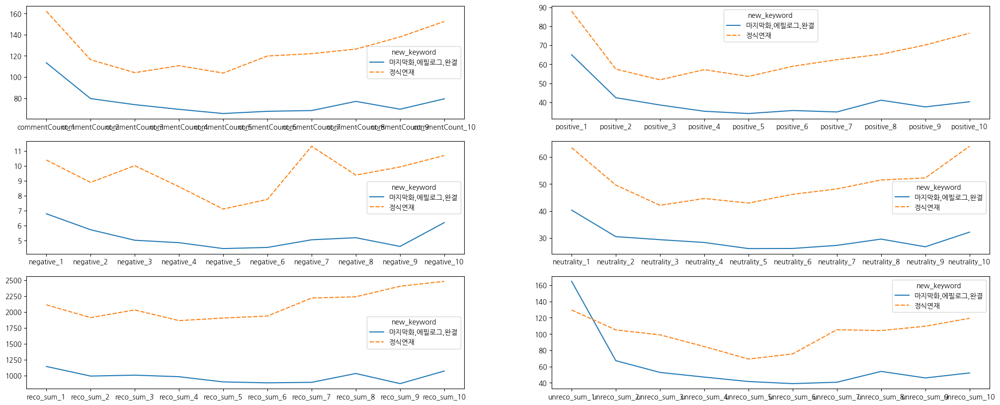

In [425]:
# overview of comment
ten_commentCount_avg = ten.groupby("new_keyword")[["commentCount_1", "commentCount_2", "commentCount_3", "commentCount_4", "commentCount_5", "commentCount_6", "commentCount_7", "commentCount_8", "commentCount_9", "commentCount_10"]].mean().T
ten_positive_avg = ten.groupby("new_keyword")[["positive_1", "positive_2", "positive_3", "positive_4", "positive_5", "positive_6", "positive_7", "positive_8", "positive_9", "positive_10"]].mean().T
ten_negative_avg = ten.groupby("new_keyword")[["negative_1", "negative_2", "negative_3", "negative_4", "negative_5", "negative_6", "negative_7", "negative_8", "negative_9", "negative_10"]].mean().T
ten_neutrality_avg = ten.groupby("new_keyword")[["neutrality_1", "neutrality_2", "neutrality_3", "neutrality_4", "neutrality_5", "neutrality_6", "neutrality_7", "neutrality_8", "neutrality_9", "neutrality_10"]].mean().T
ten_reco_sum_avg = ten.groupby("new_keyword")[["reco_sum_1", "reco_sum_2", "reco_sum_3", "reco_sum_4", "reco_sum_5", "reco_sum_6", "reco_sum_7", "reco_sum_8", "reco_sum_9", "reco_sum_10"]].mean().T
ten_unreco_sum_avg = ten.groupby("new_keyword")[["unreco_sum_1", "unreco_sum_2", "unreco_sum_3", "unreco_sum_4", "unreco_sum_5", "unreco_sum_6", "unreco_sum_7", "unreco_sum_8", "unreco_sum_9", "unreco_sum_10"]].mean().T

fig, ax = plt.subplots(figsize = (25,10), nrows=3, ncols=2)
sns.lineplot(ten_commentCount_avg, ax = ax[0][0])
sns.lineplot(ten_positive_avg, ax = ax[0][1])
sns.lineplot(ten_negative_avg, ax = ax[1][0])
sns.lineplot(ten_neutrality_avg, ax = ax[1][1])
sns.lineplot(ten_reco_sum_avg, ax = ax[2][0])
sns.lineplot(ten_unreco_sum_avg, ax = ax[2][1])

### rates of reactions of comment

<AxesSubplot: >

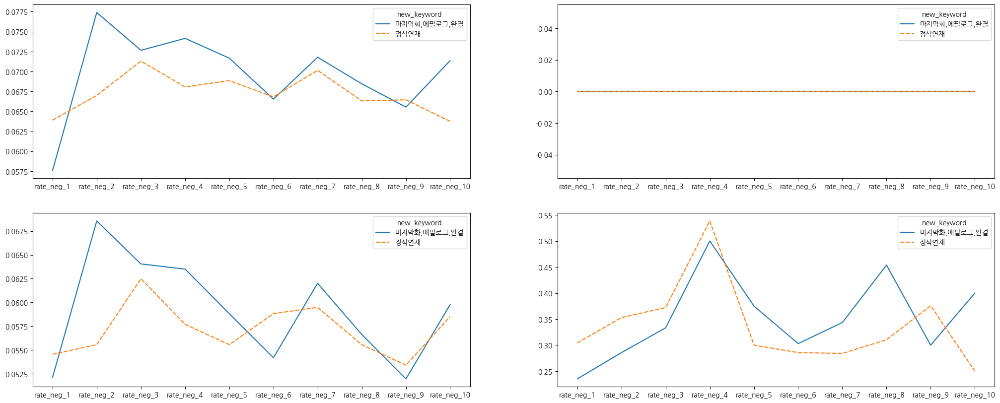

In [505]:
# rate_neg
ten_rate_neg_avg = ten.groupby("new_keyword")[["rate_neg_1", "rate_neg_2", "rate_neg_3", "rate_neg_4", "rate_neg_5", "rate_neg_6", "rate_neg_7", "rate_neg_8", "rate_neg_9", "rate_neg_10"]].mean().T
ten_rate_neg_min = ten.groupby("new_keyword")[["rate_neg_1", "rate_neg_2", "rate_neg_3", "rate_neg_4", "rate_neg_5", "rate_neg_6", "rate_neg_7", "rate_neg_8", "rate_neg_9", "rate_neg_10"]].min().T
ten_rate_neg_mid = ten.groupby("new_keyword")[["rate_neg_1", "rate_neg_2", "rate_neg_3", "rate_neg_4", "rate_neg_5", "rate_neg_6", "rate_neg_7", "rate_neg_8", "rate_neg_9", "rate_neg_10"]].median().T
ten_rate_neg_max = ten.groupby("new_keyword")[["rate_neg_1", "rate_neg_2", "rate_neg_3", "rate_neg_4", "rate_neg_5", "rate_neg_6", "rate_neg_7", "rate_neg_8", "rate_neg_9", "rate_neg_10"]].max().T

fig, ax = plt.subplots(figsize = (25,10), nrows=2, ncols=2)
sns.lineplot(ten_rate_neg_avg, ax = ax[0][0])
sns.lineplot(ten_rate_neg_min, ax = ax[0][1])
sns.lineplot(ten_rate_neg_mid, ax = ax[1][0])
sns.lineplot(ten_rate_neg_max, ax = ax[1][1])

<AxesSubplot: >

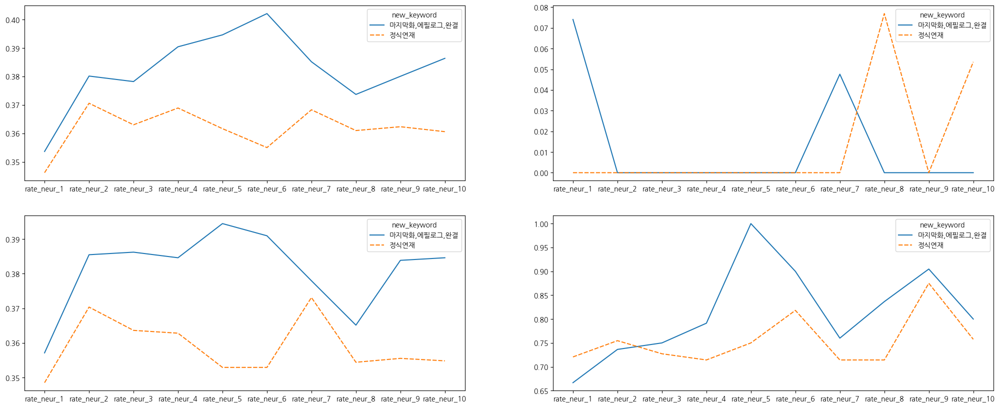

In [506]:
# rate_neur
ten_rate_neur_avg = ten.groupby("new_keyword")[["rate_neur_1", "rate_neur_2", "rate_neur_3", "rate_neur_4", "rate_neur_5", "rate_neur_6", "rate_neur_7", "rate_neur_8", "rate_neur_9", "rate_neur_10"]].mean().T
ten_rate_neur_min = ten.groupby("new_keyword")[["rate_neur_1", "rate_neur_2", "rate_neur_3", "rate_neur_4", "rate_neur_5", "rate_neur_6", "rate_neur_7", "rate_neur_8", "rate_neur_9", "rate_neur_10"]].min().T
ten_rate_neur_mid = ten.groupby("new_keyword")[["rate_neur_1", "rate_neur_2", "rate_neur_3", "rate_neur_4", "rate_neur_5", "rate_neur_6", "rate_neur_7", "rate_neur_8", "rate_neur_9", "rate_neur_10"]].median().T
ten_rate_neur_max = ten.groupby("new_keyword")[["rate_neur_1", "rate_neur_2", "rate_neur_3", "rate_neur_4", "rate_neur_5", "rate_neur_6", "rate_neur_7", "rate_neur_8", "rate_neur_9", "rate_neur_10"]].max().T

fig, ax = plt.subplots(figsize = (25,10), nrows=2, ncols=2)
sns.lineplot(ten_rate_neur_avg, ax = ax[0][0])
sns.lineplot(ten_rate_neur_min, ax = ax[0][1])
sns.lineplot(ten_rate_neur_mid, ax = ax[1][0])
sns.lineplot(ten_rate_neur_max, ax = ax[1][1])

<AxesSubplot: >

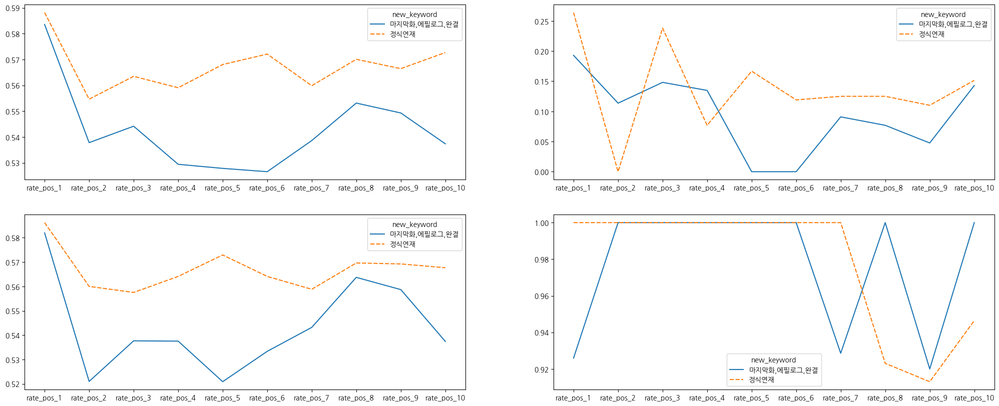

In [507]:
# rate_pos
ten_rate_pos_avg = ten.groupby("new_keyword")[["rate_pos_1", "rate_pos_2", "rate_pos_3", "rate_pos_4", "rate_pos_5", "rate_pos_6", "rate_pos_7", "rate_pos_8", "rate_pos_9", "rate_pos_10"]].mean().T
ten_rate_pos_min = ten.groupby("new_keyword")[["rate_pos_1", "rate_pos_2", "rate_pos_3", "rate_pos_4", "rate_pos_5", "rate_pos_6", "rate_pos_7", "rate_pos_8", "rate_pos_9", "rate_pos_10"]].min().T
ten_rate_pos_mid = ten.groupby("new_keyword")[["rate_pos_1", "rate_pos_2", "rate_pos_3", "rate_pos_4", "rate_pos_5", "rate_pos_6", "rate_pos_7", "rate_pos_8", "rate_pos_9", "rate_pos_10"]].median().T
ten_rate_pos_max = ten.groupby("new_keyword")[["rate_pos_1", "rate_pos_2", "rate_pos_3", "rate_pos_4", "rate_pos_5", "rate_pos_6", "rate_pos_7", "rate_pos_8", "rate_pos_9", "rate_pos_10"]].max().T

fig, ax = plt.subplots(figsize = (25,10), nrows=2, ncols=2)
sns.lineplot(ten_rate_pos_avg, ax = ax[0][0])
sns.lineplot(ten_rate_pos_min, ax = ax[0][1])
sns.lineplot(ten_rate_pos_mid, ax = ax[1][0])
sns.lineplot(ten_rate_pos_max, ax = ax[1][1])

# 보정

* 보정을 진행하게 되는 이유는, 웹툰도 시장의 흐름과 트렌드가 존재한다.
* 시장의 전반적인 상황이나 트렌드는 시시각각 바뀌기 마련이다.
* 작가지망생들에게는 최근 승격되는 웹툰들에 대한 정보가 더 중요하다고 판단되었다.
* 따라서, 지금까지 선정한 수치형 feature들을 첫 웹툰 등록일로부터 데이터 수집일까지의 기간으로 나누어서 비중을 두기로 하였다.
  * 수치형 feature / (데이터 수집일(22년 12월 26일) - 첫 웹툰 등록일)

## 5회차 보정

In [532]:
five_edit = pd.read_csv("G:/내 드라이브/Project/FINAL/data_preprocessing/0102기준_모델링파일/final_turn_5.csv")

In [538]:
five_edit

,id,view_1,date_1,rating_1,people_1,turnfav_1,commentCount_1,reco_sum_1,reco_mean_1,unreco_sum_1,...,neg_score_mean_5,negative_5,neutrality_5,positive_5,rate_neg_5,rate_neur_5,rate_pos_5,new_keyword,긍정반응점수,부정반응점수
0,15067,47660,2022-01-05,9.69,310,305,60,301,5.101695,20,...,0.185185,2,18,7,0.074074,0.666667,0.259259,정식연재,584,199
1,32937,6464,2007-07-19,9.60,559,21,368,89,0.483696,10,...,0.268041,9,37,51,0.034749,0.142857,0.196911,"마지막화,에필로그,완결",132,16
2,50004,552,2006-02-08,6.89,57,1,31,40,1.290323,43,...,0.058824,1,9,24,0.029412,0.264706,0.705882,"마지막화,에필로그,완결",24,21
3,50196,7591,2008-10-28,9.70,963,37,447,459,1.026846,11,...,0.048193,4,76,86,0.024096,0.457831,0.518072,"마지막화,에필로그,완결",615,52
4,53694,49517,2008-12-12,9.65,1622,154,1243,1015,0.821862,136,...,0.087634,57,423,547,0.055501,0.411879,0.532619,"마지막화,에필로그,완결",2670,260
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
538,792936,45811,2022-03-30,7.14,460,247,90,1570,19.873418,397,...,0.120000,0,9,16,0.000000,0.346154,0.615385,"마지막화,에필로그,완결",1652,862
539,792942,8931,2022-03-28,8.01,122,41,21,107,5.350000,68,...,0.000000,0,8,0,0.000000,1.000000,0.000000,"마지막화,에필로그,완결",132,96
540,793203,33883,2022-04-02,9.85,270,221,28,317,11.321429,17,...,0.058824,0,2,15,0.000000,0.117647,0.882353,"마지막화,에필로그,완결",668,88
541,796167,66769,2022-06-12,9.83,780,441,29,510,17.586207,36,...,0.200000,0,8,7,0.000000,0.533333,0.466667,정식연재,1382,136


In [539]:
five_edit["date_1"] = pd.to_datetime(five_edit["date_1"])
five_edit["date_2"] = pd.to_datetime(five_edit["date_2"])
five_edit["date_3"] = pd.to_datetime(five_edit["date_3"])
five_edit["date_4"] = pd.to_datetime(five_edit["date_4"])
five_edit["date_5"] = pd.to_datetime(five_edit["date_5"])

In [554]:
five_edit["date_1"] = datetime.strptime("20221226", "%Y%m%d") - five_edit["date_1"]
five_edit["date_2"] = datetime.strptime("20221226", "%Y%m%d") - five_edit["date_2"]
five_edit["date_3"] = datetime.strptime("20221226", "%Y%m%d") - five_edit["date_3"]
five_edit["date_4"] = datetime.strptime("20221226", "%Y%m%d") - five_edit["date_4"]
five_edit["date_5"] = datetime.strptime("20221226", "%Y%m%d") - five_edit["date_5"]

five_edit[["date_1", 'date_2', 'date_3', 'date_4', 'date_5']]

,date_1,date_2,date_3,date_4,date_5
0,355 days,325 days,318 days,311 days,304 days
1,5639 days,5629 days,5622 days,5608 days,5601 days
2,6165 days,6163 days,6160 days,6158 days,6156 days
3,5172 days,5172 days,5172 days,5172 days,5172 days
4,5127 days,5123 days,5121 days,5119 days,5112 days
...,...,...,...,...,...
538,271 days,264 days,257 days,250 days,243 days
539,273 days,266 days,259 days,252 days,245 days
540,268 days,261 days,254 days,247 days,240 days
541,197 days,196 days,195 days,193 days,191 days


In [611]:
five_edit["date_1"] = five_edit["date_1"].dt.days
five_edit["date_2"] = five_edit["date_2"].dt.days
five_edit["date_3"] = five_edit["date_3"].dt.days
five_edit["date_4"] = five_edit["date_4"].dt.days
five_edit["date_5"] = five_edit["date_5"].dt.days

five_edit[["date_1", 'date_2', 'date_3', 'date_4', 'date_5']]

,date_1,date_2,date_3,date_4,date_5
0,355,325,318,311,304
1,5639,5629,5622,5608,5601
2,6165,6163,6160,6158,6156
3,5172,5172,5172,5172,5172
4,5127,5123,5121,5119,5112
...,...,...,...,...,...
538,271,264,257,250,243
539,273,266,259,252,245
540,268,261,254,247,240
541,197,196,195,193,191


In [612]:
columns_divide = five_edit.select_dtypes(include="number").columns.drop(["id","date_1", 'date_2', 'date_3', 'date_4', 'date_5'])
columns_divide

Index(['view_1', 'rating_1', 'people_1', 'turnfav_1', 'commentCount_1',
       'reco_sum_1', 'reco_mean_1', 'unreco_sum_1', 'unreco_mean_1',
       'pos_score_sum_1', 'pos_score_mean_1', 'neg_score_sum_1',
       'neg_score_mean_1', 'negative_1', 'neutrality_1', 'positive_1',
       'rate_neg_1', 'rate_neur_1', 'rate_pos_1', 'view_2', 'rating_2',
       'people_2', 'turnfav_2', 'commentCount_2', 'reco_sum_2', 'reco_mean_2',
       'unreco_sum_2', 'unreco_mean_2', 'pos_score_sum_2', 'pos_score_mean_2',
       'neg_score_sum_2', 'neg_score_mean_2', 'negative_2', 'neutrality_2',
       'positive_2', 'rate_neg_2', 'rate_neur_2', 'rate_pos_2', 'view_3',
       'rating_3', 'people_3', 'turnfav_3', 'commentCount_3', 'reco_sum_3',
       'reco_mean_3', 'unreco_sum_3', 'unreco_mean_3', 'pos_score_sum_3',
       'pos_score_mean_3', 'neg_score_sum_3', 'neg_score_mean_3', 'negative_3',
       'neutrality_3', 'positive_3', 'rate_neg_3', 'rate_neur_3', 'rate_pos_3',
       'view_4', 'rating_4', 'peo

In [613]:
for i in columns_divide:
    if "1" in i:
        five_edit[i] = five_edit[i] / five_edit["date_1"]
    elif "2" in i:
        five_edit[i] = five_edit[i] / five_edit["date_2"]
    elif "3" in i:
        five_edit[i] = five_edit[i] / five_edit["date_3"]
    elif "4" in i:
        five_edit[i] = five_edit[i] / five_edit["date_4"]
    elif "5" in i:
        five_edit[i] = five_edit[i] / five_edit["date_5"]

In [614]:
five_edit

,id,view_1,date_1,rating_1,people_1,turnfav_1,commentCount_1,reco_sum_1,reco_mean_1,unreco_sum_1,...,neg_score_mean_5,negative_5,neutrality_5,positive_5,rate_neg_5,rate_neur_5,rate_pos_5,new_keyword,긍정반응점수,부정반응점수
0,15067,134.253521,355,0.027296,0.873239,0.859155,0.169014,0.847887,0.014371,0.056338,...,0.000609,0.006579,0.059211,0.023026,0.000244,0.002193,0.000853,정식연재,584,199
1,32937,1.146303,5639,0.001702,0.099131,0.003724,0.065260,0.015783,0.000086,0.001773,...,0.000048,0.001607,0.006606,0.009106,0.000006,0.000026,0.000035,"마지막화,에필로그,완결",132,16
2,50004,0.089538,6165,0.001118,0.009246,0.000162,0.005028,0.006488,0.000209,0.006975,...,0.000010,0.000162,0.001462,0.003899,0.000005,0.000043,0.000115,"마지막화,에필로그,완결",24,21
3,50196,1.467711,5172,0.001875,0.186195,0.007154,0.086427,0.088747,0.000199,0.002127,...,0.000009,0.000773,0.014695,0.016628,0.000005,0.000089,0.000100,"마지막화,에필로그,완결",615,52
4,53694,9.658085,5127,0.001882,0.316364,0.030037,0.242442,0.197972,0.000160,0.026526,...,0.000017,0.011150,0.082746,0.107003,0.000011,0.000081,0.000104,"마지막화,에필로그,완결",2670,260
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
538,792936,169.044280,271,0.026347,1.697417,0.911439,0.332103,5.793358,0.073334,1.464945,...,0.000494,0.000000,0.037037,0.065844,0.000000,0.001425,0.002532,"마지막화,에필로그,완결",1652,862
539,792942,32.714286,273,0.029341,0.446886,0.150183,0.076923,0.391941,0.019597,0.249084,...,0.000000,0.000000,0.032653,0.000000,0.000000,0.004082,0.000000,"마지막화,에필로그,완결",132,96
540,793203,126.429104,268,0.036754,1.007463,0.824627,0.104478,1.182836,0.042244,0.063433,...,0.000245,0.000000,0.008333,0.062500,0.000000,0.000490,0.003676,"마지막화,에필로그,완결",668,88
541,796167,338.928934,197,0.049898,3.959391,2.238579,0.147208,2.588832,0.089270,0.182741,...,0.001047,0.000000,0.041885,0.036649,0.000000,0.002792,0.002443,정식연재,1382,136


In [625]:
five_edit.to_csv("G:/내 드라이브/Project/FINAL/data_preprocessing/0102기준_모델링파일/total_episode_5_divided_by_date.csv", index = False)

In [626]:
pd.read_csv("G:/내 드라이브/Project/FINAL/data_preprocessing/0102기준_모델링파일/total_episode_5_divided_by_date.csv")

,id,view_1,date_1,rating_1,people_1,turnfav_1,commentCount_1,reco_sum_1,reco_mean_1,unreco_sum_1,...,neg_score_mean_5,negative_5,neutrality_5,positive_5,rate_neg_5,rate_neur_5,rate_pos_5,new_keyword,긍정반응점수,부정반응점수
0,15067,134.253521,355,0.027296,0.873239,0.859155,0.169014,0.847887,0.014371,0.056338,...,0.000609,0.006579,0.059211,0.023026,0.000244,0.002193,0.000853,정식연재,584,199
1,32937,1.146303,5639,0.001702,0.099131,0.003724,0.065260,0.015783,0.000086,0.001773,...,0.000048,0.001607,0.006606,0.009106,0.000006,0.000026,0.000035,"마지막화,에필로그,완결",132,16
2,50004,0.089538,6165,0.001118,0.009246,0.000162,0.005028,0.006488,0.000209,0.006975,...,0.000010,0.000162,0.001462,0.003899,0.000005,0.000043,0.000115,"마지막화,에필로그,완결",24,21
3,50196,1.467711,5172,0.001875,0.186195,0.007154,0.086427,0.088747,0.000199,0.002127,...,0.000009,0.000773,0.014695,0.016628,0.000005,0.000089,0.000100,"마지막화,에필로그,완결",615,52
4,53694,9.658085,5127,0.001882,0.316364,0.030037,0.242442,0.197972,0.000160,0.026526,...,0.000017,0.011150,0.082746,0.107003,0.000011,0.000081,0.000104,"마지막화,에필로그,완결",2670,260
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
538,792936,169.044280,271,0.026347,1.697417,0.911439,0.332103,5.793358,0.073334,1.464945,...,0.000494,0.000000,0.037037,0.065844,0.000000,0.001425,0.002532,"마지막화,에필로그,완결",1652,862
539,792942,32.714286,273,0.029341,0.446886,0.150183,0.076923,0.391941,0.019597,0.249084,...,0.000000,0.000000,0.032653,0.000000,0.000000,0.004082,0.000000,"마지막화,에필로그,완결",132,96
540,793203,126.429104,268,0.036754,1.007463,0.824627,0.104478,1.182836,0.042244,0.063433,...,0.000245,0.000000,0.008333,0.062500,0.000000,0.000490,0.003676,"마지막화,에필로그,완결",668,88
541,796167,338.928934,197,0.049898,3.959391,2.238579,0.147208,2.588832,0.089270,0.182741,...,0.001047,0.000000,0.041885,0.036649,0.000000,0.002792,0.002443,정식연재,1382,136


## 10회차 보정

In [703]:
ten_edit = pd.read_csv("G:/내 드라이브/Project/FINAL/data_preprocessing/0102기준_모델링파일/final_turn_10.csv")

In [704]:
ten_edit

,id,view_1,date_1,rating_1,people_1,turnfav_1,commentCount_1,reco_sum_1,reco_mean_1,unreco_sum_1,...,neg_score_mean_10,negative_10,neutrality_10,positive_10,rate_neg_10,rate_neur_10,rate_pos_10,new_keyword,긍정반응점수,부정반응점수
0,15067,47660,2022-01-05,9.69,310,305,60,301,5.101695,20,...,0.125000,3,15,6,0.125000,0.625000,0.250000,정식연재,584,199
1,32937,6464,2007-07-19,9.60,559,21,368,89,0.483696,10,...,0.126984,2,13,48,0.010101,0.065657,0.242424,"마지막화,에필로그,완결",132,16
2,50004,552,2006-02-08,6.89,57,1,31,40,1.290323,43,...,0.020408,0,27,22,0.000000,0.551020,0.448980,"마지막화,에필로그,완결",24,21
3,50196,7591,2008-10-28,9.70,963,37,447,459,1.026846,11,...,0.054054,3,44,64,0.027027,0.396396,0.576577,"마지막화,에필로그,완결",615,52
4,53694,49517,2008-12-12,9.65,1622,154,1243,1015,0.821862,136,...,0.152290,177,882,622,0.105232,0.524376,0.369798,"마지막화,에필로그,완결",2670,260
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
468,792314,16566,2022-03-16,8.66,121,67,22,62,2.818182,2,...,0.066667,1,1,13,0.066667,0.066667,0.866667,정식연재,205,8
469,792936,45811,2022-03-30,7.14,460,247,90,1570,19.873418,397,...,0.135135,1,21,15,0.025641,0.538462,0.384615,"마지막화,에필로그,완결",1652,862
470,792942,8931,2022-03-28,8.01,122,41,21,107,5.350000,68,...,0.300000,1,4,5,0.100000,0.400000,0.500000,"마지막화,에필로그,완결",132,96
471,793203,33883,2022-04-02,9.85,270,221,28,317,11.321429,17,...,0.277778,0,5,13,0.000000,0.277778,0.722222,"마지막화,에필로그,완결",668,88


In [705]:
ten_edit["date_1"] = pd.to_datetime(ten_edit["date_1"])
ten_edit["date_2"] = pd.to_datetime(ten_edit["date_2"])
ten_edit["date_3"] = pd.to_datetime(ten_edit["date_3"])
ten_edit["date_4"] = pd.to_datetime(ten_edit["date_4"])
ten_edit["date_5"] = pd.to_datetime(ten_edit["date_5"])
ten_edit["date_6"] = pd.to_datetime(ten_edit["date_6"])
ten_edit["date_7"] = pd.to_datetime(ten_edit["date_7"])
ten_edit["date_8"] = pd.to_datetime(ten_edit["date_8"])
ten_edit["date_9"] = pd.to_datetime(ten_edit["date_9"])
ten_edit["date_10"] = pd.to_datetime(ten_edit["date_10"])

In [706]:
ten_edit["date_1"] = datetime.strptime("20221226", "%Y%m%d") - ten_edit["date_1"]
ten_edit["date_2"] = datetime.strptime("20221226", "%Y%m%d") - ten_edit["date_2"]
ten_edit["date_3"] = datetime.strptime("20221226", "%Y%m%d") - ten_edit["date_3"]
ten_edit["date_4"] = datetime.strptime("20221226", "%Y%m%d") - ten_edit["date_4"]
ten_edit["date_5"] = datetime.strptime("20221226", "%Y%m%d") - ten_edit["date_5"]
ten_edit["date_6"] = datetime.strptime("20221226", "%Y%m%d") - ten_edit["date_6"]
ten_edit["date_7"] = datetime.strptime("20221226", "%Y%m%d") - ten_edit["date_7"]
ten_edit["date_8"] = datetime.strptime("20221226", "%Y%m%d") - ten_edit["date_8"]
ten_edit["date_9"] = datetime.strptime("20221226", "%Y%m%d") - ten_edit["date_9"]
ten_edit["date_10"] = datetime.strptime("20221226", "%Y%m%d") - ten_edit["date_10"]


ten_edit[["date_1", 'date_2', 'date_3', 'date_4', 'date_5']]

,date_1,date_2,date_3,date_4,date_5
0,355 days,325 days,318 days,311 days,304 days
1,5639 days,5629 days,5622 days,5608 days,5601 days
2,6165 days,6163 days,6160 days,6158 days,6156 days
3,5172 days,5172 days,5172 days,5172 days,5172 days
4,5127 days,5123 days,5121 days,5119 days,5112 days
...,...,...,...,...,...
468,285 days,278 days,271 days,270 days,257 days
469,271 days,264 days,257 days,250 days,243 days
470,273 days,266 days,259 days,252 days,245 days
471,268 days,261 days,254 days,247 days,240 days


In [707]:
ten_edit["date_1"] = ten_edit["date_1"].dt.days
ten_edit["date_2"] = ten_edit["date_2"].dt.days
ten_edit["date_3"] = ten_edit["date_3"].dt.days
ten_edit["date_4"] = ten_edit["date_4"].dt.days
ten_edit["date_5"] = ten_edit["date_5"].dt.days
ten_edit["date_6"] = ten_edit["date_6"].dt.days
ten_edit["date_7"] = ten_edit["date_7"].dt.days
ten_edit["date_8"] = ten_edit["date_8"].dt.days
ten_edit["date_9"] = ten_edit["date_9"].dt.days
ten_edit["date_10"] = ten_edit["date_10"].dt.days

ten_edit[["date_1", 'date_2', 'date_3', 'date_4', 'date_5', "date_6", 'date_7', 'date_8', 'date_9', 'date_10']]

,date_1,date_2,date_3,date_4,date_5,date_6,date_7,date_8,date_9,date_10
0,355,325,318,311,304,297,293,290,283,276
1,5639,5629,5622,5608,5601,5594,5587,5580,5545,5537
2,6165,6163,6160,6158,6156,6153,6151,6149,6146,6144
3,5172,5172,5172,5172,5172,5172,5172,5172,5172,5172
4,5127,5123,5121,5119,5112,5108,5103,5099,5094,5088
...,...,...,...,...,...,...,...,...,...,...
468,285,278,271,270,257,250,243,229,222,212
469,271,264,257,250,243,241,236,229,222,215
470,273,266,259,252,245,238,231,224,217,196
471,268,261,254,247,240,233,226,219,212,205


In [708]:
columns_divide_10 = ten_edit.select_dtypes(include="number").columns.drop(["id","date_1", 'date_2', 'date_3', 'date_4', 'date_5', "date_6", 'date_7', 'date_8', 'date_9', 'date_10'])

columns_divide_10

Index(['view_1', 'rating_1', 'people_1', 'turnfav_1', 'commentCount_1',
       'reco_sum_1', 'reco_mean_1', 'unreco_sum_1', 'unreco_mean_1',
       'pos_score_sum_1',
       ...
       'neg_score_sum_10', 'neg_score_mean_10', 'negative_10', 'neutrality_10',
       'positive_10', 'rate_neg_10', 'rate_neur_10', 'rate_pos_10', '긍정반응점수',
       '부정반응점수'],
      dtype='object', length=192)

In [709]:
for i in columns_divide_10:
    # if "1" in i:
    #     ten_edit[i] = ten_edit[i] / ten_edit["date_1"]
    if "2" in i:
        ten_edit[i] = ten_edit[i] / ten_edit["date_2"]
    elif "3" in i:
        ten_edit[i] = ten_edit[i] / ten_edit["date_3"]
    elif "4" in i:
        ten_edit[i] = ten_edit[i] / ten_edit["date_4"]
    elif "5" in i:
        ten_edit[i] = ten_edit[i] / ten_edit["date_5"]
    elif "6" in i:
        ten_edit[i] = ten_edit[i] / ten_edit["date_6"]
    elif "7" in i:
        ten_edit[i] = ten_edit[i] / ten_edit["date_7"]
    elif "8" in i:
        ten_edit[i] = ten_edit[i] / ten_edit["date_8"]
    elif "9" in i:
        ten_edit[i] = ten_edit[i] / ten_edit["date_9"]
    elif "10" in i:
        ten_edit[i] = ten_edit[i] / ten_edit["date_10"]

In [710]:
ten_edit

,id,view_1,date_1,rating_1,people_1,turnfav_1,commentCount_1,reco_sum_1,reco_mean_1,unreco_sum_1,...,neg_score_mean_10,negative_10,neutrality_10,positive_10,rate_neg_10,rate_neur_10,rate_pos_10,new_keyword,긍정반응점수,부정반응점수
0,15067,47660,355,9.69,310,305,60,301,5.101695,20,...,0.000453,0.010870,0.054348,0.021739,0.000453,0.002264,0.000906,정식연재,584,199
1,32937,6464,5639,9.60,559,21,368,89,0.483696,10,...,0.000023,0.000361,0.002348,0.008669,0.000002,0.000012,0.000044,"마지막화,에필로그,완결",132,16
2,50004,552,6165,6.89,57,1,31,40,1.290323,43,...,0.000003,0.000000,0.004395,0.003581,0.000000,0.000090,0.000073,"마지막화,에필로그,완결",24,21
3,50196,7591,5172,9.70,963,37,447,459,1.026846,11,...,0.000010,0.000580,0.008507,0.012374,0.000005,0.000077,0.000111,"마지막화,에필로그,완결",615,52
4,53694,49517,5127,9.65,1622,154,1243,1015,0.821862,136,...,0.000030,0.034788,0.173349,0.122248,0.000021,0.000103,0.000073,"마지막화,에필로그,완결",2670,260
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
468,792314,16566,285,8.66,121,67,22,62,2.818182,2,...,0.000314,0.004717,0.004717,0.061321,0.000314,0.000314,0.004088,정식연재,205,8
469,792936,45811,271,7.14,460,247,90,1570,19.873418,397,...,0.000629,0.004651,0.097674,0.069767,0.000119,0.002504,0.001789,"마지막화,에필로그,완결",1652,862
470,792942,8931,273,8.01,122,41,21,107,5.350000,68,...,0.001531,0.005102,0.020408,0.025510,0.000510,0.002041,0.002551,"마지막화,에필로그,완결",132,96
471,793203,33883,268,9.85,270,221,28,317,11.321429,17,...,0.001355,0.000000,0.024390,0.063415,0.000000,0.001355,0.003523,"마지막화,에필로그,완결",668,88


In [718]:
ten["view_10"]

0      17164
1       2084
2         84
3       3745
4      40017
       ...  
468     5356
469    16931
470     2810
471    10990
472    49037
Name: view_10, Length: 473, dtype: int64

In [719]:
ten_edit["view_10"] * ten_edit["date_10"]

0      17164.0
1       2084.0
2         84.0
3       3745.0
4      40017.0
        ...   
468     5356.0
469    16931.0
470     2810.0
471    10990.0
472    49037.0
Length: 473, dtype: float64

In [713]:
if_1 = []

for i in columns_divide_10:
    if "1" in i:
        if_1.append(i)
        
if_1

['view_1',
 'rating_1',
 'people_1',
 'turnfav_1',
 'commentCount_1',
 'reco_sum_1',
 'reco_mean_1',
 'unreco_sum_1',
 'unreco_mean_1',
 'pos_score_sum_1',
 'pos_score_mean_1',
 'neg_score_sum_1',
 'neg_score_mean_1',
 'negative_1',
 'neutrality_1',
 'positive_1',
 'rate_neg_1',
 'rate_neur_1',
 'rate_pos_1',
 'view_10',
 'rating_10',
 'people_10',
 'turnfav_10',
 'commentCount_10',
 'reco_sum_10',
 'reco_mean_10',
 'unreco_sum_10',
 'unreco_mean_10',
 'pos_score_sum_10',
 'pos_score_mean_10',
 'neg_score_sum_10',
 'neg_score_mean_10',
 'negative_10',
 'neutrality_10',
 'positive_10',
 'rate_neg_10',
 'rate_neur_10',
 'rate_pos_10']

In [716]:
no_1 = ['view_1','rating_1','people_1','turnfav_1','commentCount_1','reco_sum_1','reco_mean_1','unreco_sum_1','unreco_mean_1',
        'pos_score_sum_1','pos_score_mean_1','neg_score_sum_1','neg_score_mean_1','negative_1','neutrality_1','positive_1','rate_neg_1','rate_neur_1','rate_pos_1']

set(list(if_1)) - set(list(no_1))

{'commentCount_10',
 'neg_score_mean_10',
 'neg_score_sum_10',
 'negative_10',
 'neutrality_10',
 'people_10',
 'pos_score_mean_10',
 'pos_score_sum_10',
 'positive_10',
 'rate_neg_10',
 'rate_neur_10',
 'rate_pos_10',
 'rating_10',
 'reco_mean_10',
 'reco_sum_10',
 'turnfav_10',
 'unreco_mean_10',
 'unreco_sum_10',
 'view_10'}

In [717]:
no_10 = ['commentCount_10','neg_score_mean_10','neg_score_sum_10','negative_10','neutrality_10','people_10','pos_score_mean_10','pos_score_sum_10',
         'positive_10','rate_neg_10','rate_neur_10','rate_pos_10','rating_10','reco_mean_10','reco_sum_10','turnfav_10','unreco_mean_10','unreco_sum_10','view_10']

In [720]:
for i in no_1:
    ten_edit[i] = ten_edit[i] / ten_edit["date_1"]

In [721]:
ten_edit

,id,view_1,date_1,rating_1,people_1,turnfav_1,commentCount_1,reco_sum_1,reco_mean_1,unreco_sum_1,...,neg_score_mean_10,negative_10,neutrality_10,positive_10,rate_neg_10,rate_neur_10,rate_pos_10,new_keyword,긍정반응점수,부정반응점수
0,15067,134.253521,355,0.027296,0.873239,0.859155,0.169014,0.847887,0.014371,0.056338,...,0.000453,0.010870,0.054348,0.021739,0.000453,0.002264,0.000906,정식연재,584,199
1,32937,1.146303,5639,0.001702,0.099131,0.003724,0.065260,0.015783,0.000086,0.001773,...,0.000023,0.000361,0.002348,0.008669,0.000002,0.000012,0.000044,"마지막화,에필로그,완결",132,16
2,50004,0.089538,6165,0.001118,0.009246,0.000162,0.005028,0.006488,0.000209,0.006975,...,0.000003,0.000000,0.004395,0.003581,0.000000,0.000090,0.000073,"마지막화,에필로그,완결",24,21
3,50196,1.467711,5172,0.001875,0.186195,0.007154,0.086427,0.088747,0.000199,0.002127,...,0.000010,0.000580,0.008507,0.012374,0.000005,0.000077,0.000111,"마지막화,에필로그,완결",615,52
4,53694,9.658085,5127,0.001882,0.316364,0.030037,0.242442,0.197972,0.000160,0.026526,...,0.000030,0.034788,0.173349,0.122248,0.000021,0.000103,0.000073,"마지막화,에필로그,완결",2670,260
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
468,792314,58.126316,285,0.030386,0.424561,0.235088,0.077193,0.217544,0.009888,0.007018,...,0.000314,0.004717,0.004717,0.061321,0.000314,0.000314,0.004088,정식연재,205,8
469,792936,169.044280,271,0.026347,1.697417,0.911439,0.332103,5.793358,0.073334,1.464945,...,0.000629,0.004651,0.097674,0.069767,0.000119,0.002504,0.001789,"마지막화,에필로그,완결",1652,862
470,792942,32.714286,273,0.029341,0.446886,0.150183,0.076923,0.391941,0.019597,0.249084,...,0.001531,0.005102,0.020408,0.025510,0.000510,0.002041,0.002551,"마지막화,에필로그,완결",132,96
471,793203,126.429104,268,0.036754,1.007463,0.824627,0.104478,1.182836,0.042244,0.063433,...,0.001355,0.000000,0.024390,0.063415,0.000000,0.001355,0.003523,"마지막화,에필로그,완결",668,88


In [722]:
ten["view_1"]

0      47660
1       6464
2        552
3       7591
4      49517
       ...  
468    16566
469    45811
470     8931
471    33883
472    66769
Name: view_1, Length: 473, dtype: int64

In [724]:
ten_edit["view_1"] * ten_edit["date_1"]

0      47660.0
1       6464.0
2        552.0
3       7591.0
4      49517.0
        ...   
468    16566.0
469    45811.0
470     8931.0
471    33883.0
472    66769.0
Length: 473, dtype: float64

In [725]:
ten_edit.to_csv("G:/내 드라이브/Project/FINAL/data_preprocessing/0102기준_모델링파일/total_episode_10_divided_by_date.csv", index = False)

In [726]:
pd.read_csv("G:/내 드라이브/Project/FINAL/data_preprocessing/0102기준_모델링파일/total_episode_10_divided_by_date.csv")

,id,view_1,date_1,rating_1,people_1,turnfav_1,commentCount_1,reco_sum_1,reco_mean_1,unreco_sum_1,...,neg_score_mean_10,negative_10,neutrality_10,positive_10,rate_neg_10,rate_neur_10,rate_pos_10,new_keyword,긍정반응점수,부정반응점수
0,15067,134.253521,355,0.027296,0.873239,0.859155,0.169014,0.847887,0.014371,0.056338,...,0.000453,0.010870,0.054348,0.021739,0.000453,0.002264,0.000906,정식연재,584,199
1,32937,1.146303,5639,0.001702,0.099131,0.003724,0.065260,0.015783,0.000086,0.001773,...,0.000023,0.000361,0.002348,0.008669,0.000002,0.000012,0.000044,"마지막화,에필로그,완결",132,16
2,50004,0.089538,6165,0.001118,0.009246,0.000162,0.005028,0.006488,0.000209,0.006975,...,0.000003,0.000000,0.004395,0.003581,0.000000,0.000090,0.000073,"마지막화,에필로그,완결",24,21
3,50196,1.467711,5172,0.001875,0.186195,0.007154,0.086427,0.088747,0.000199,0.002127,...,0.000010,0.000580,0.008507,0.012374,0.000005,0.000077,0.000111,"마지막화,에필로그,완결",615,52
4,53694,9.658085,5127,0.001882,0.316364,0.030037,0.242442,0.197972,0.000160,0.026526,...,0.000030,0.034788,0.173349,0.122248,0.000021,0.000103,0.000073,"마지막화,에필로그,완결",2670,260
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
468,792314,58.126316,285,0.030386,0.424561,0.235088,0.077193,0.217544,0.009888,0.007018,...,0.000314,0.004717,0.004717,0.061321,0.000314,0.000314,0.004088,정식연재,205,8
469,792936,169.044280,271,0.026347,1.697417,0.911439,0.332103,5.793358,0.073334,1.464945,...,0.000629,0.004651,0.097674,0.069767,0.000119,0.002504,0.001789,"마지막화,에필로그,완결",1652,862
470,792942,32.714286,273,0.029341,0.446886,0.150183,0.076923,0.391941,0.019597,0.249084,...,0.001531,0.005102,0.020408,0.025510,0.000510,0.002041,0.002551,"마지막화,에필로그,완결",132,96
471,793203,126.429104,268,0.036754,1.007463,0.824627,0.104478,1.182836,0.042244,0.063433,...,0.001355,0.000000,0.024390,0.063415,0.000000,0.001355,0.003523,"마지막화,에필로그,완결",668,88


# 10회차 보정 진행 내용

In [3]:
ten_div = pd.read_csv("G:/내 드라이브/Project/FINAL/data_preprocessing/0102기준_모델링파일/total_episode_10_divided_by_date(from_20221226).csv")
ten_div

,id,view_1,date_1,rating_1,people_1,turnfav_1,commentCount_1,reco_sum_1,reco_mean_1,unreco_sum_1,...,neg_score_mean_10,negative_10,neutrality_10,positive_10,rate_neg_10,rate_neur_10,rate_pos_10,new_keyword,긍정반응점수,부정반응점수
0,15067,134.253521,355,0.027296,0.873239,0.859155,0.169014,0.847887,0.014371,0.056338,...,0.000453,0.010870,0.054348,0.021739,0.000453,0.002264,0.000906,정식연재,584,199
1,32937,1.146303,5639,0.001702,0.099131,0.003724,0.065260,0.015783,0.000086,0.001773,...,0.000023,0.000361,0.002348,0.008669,0.000002,0.000012,0.000044,"마지막화,에필로그,완결",132,16
2,50004,0.089538,6165,0.001118,0.009246,0.000162,0.005028,0.006488,0.000209,0.006975,...,0.000003,0.000000,0.004395,0.003581,0.000000,0.000090,0.000073,"마지막화,에필로그,완결",24,21
3,50196,1.467711,5172,0.001875,0.186195,0.007154,0.086427,0.088747,0.000199,0.002127,...,0.000010,0.000580,0.008507,0.012374,0.000005,0.000077,0.000111,"마지막화,에필로그,완결",615,52
4,53694,9.658085,5127,0.001882,0.316364,0.030037,0.242442,0.197972,0.000160,0.026526,...,0.000030,0.034788,0.173349,0.122248,0.000021,0.000103,0.000073,"마지막화,에필로그,완결",2670,260
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
468,792314,58.126316,285,0.030386,0.424561,0.235088,0.077193,0.217544,0.009888,0.007018,...,0.000314,0.004717,0.004717,0.061321,0.000314,0.000314,0.004088,정식연재,205,8
469,792936,169.044280,271,0.026347,1.697417,0.911439,0.332103,5.793358,0.073334,1.464945,...,0.000629,0.004651,0.097674,0.069767,0.000119,0.002504,0.001789,"마지막화,에필로그,완결",1652,862
470,792942,32.714286,273,0.029341,0.446886,0.150183,0.076923,0.391941,0.019597,0.249084,...,0.001531,0.005102,0.020408,0.025510,0.000510,0.002041,0.002551,"마지막화,에필로그,완결",132,96
471,793203,126.429104,268,0.036754,1.007463,0.824627,0.104478,1.182836,0.042244,0.063433,...,0.001355,0.000000,0.024390,0.063415,0.000000,0.001355,0.003523,"마지막화,에필로그,완결",668,88


## EDA

In [5]:
ten_div.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 473 entries, 0 to 472
Columns: 204 entries, id to 부정반응점수
dtypes: float64(190), int64(13), object(1)
memory usage: 754.0+ KB


In [7]:
ten_div.describe()

,id,view_1,date_1,rating_1,people_1,turnfav_1,commentCount_1,reco_sum_1,reco_mean_1,unreco_sum_1,...,neg_score_sum_10,neg_score_mean_10,negative_10,neutrality_10,positive_10,rate_neg_10,rate_neur_10,rate_pos_10,긍정반응점수,부정반응점수
count,473.000000,473.000000,473.000000,473.000000,473.000000,473.000000,473.000000,473.000000,473.000000,473.000000,...,473.000000,473.000000,473.000000,473.000000,473.000000,473.000000,473.000000,473.000000,473.000000,473.000000
mean,597530.985201,59.617679,2510.735729,0.005951,0.477325,0.278235,0.056605,0.830181,0.008672,0.077240,...,0.009536,0.000133,0.003472,0.018983,0.025569,0.000046,0.000246,0.000392,4114.602537,912.126850
std,187919.688140,84.855168,1278.129980,0.005741,0.512979,0.436394,0.070226,1.557691,0.010884,0.426852,...,0.013663,0.000197,0.005685,0.032580,0.030617,0.000087,0.000298,0.000495,8876.711088,2144.612011
min,15067.000000,0.034052,197.000000,0.001118,0.009246,0.000000,0.003489,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000358,0.000000,0.000000,0.000031,1.000000,0.000000
25%,559738.000000,6.153181,1449.000000,0.002833,0.184477,0.044370,0.018955,0.101542,0.001800,0.009852,...,0.001776,0.000039,0.000552,0.004135,0.007137,0.000009,0.000100,0.000146,472.000000,59.000000
50%,664628.000000,32.509006,2498.000000,0.003955,0.323675,0.128440,0.033956,0.318495,0.005974,0.025180,...,0.004769,0.000077,0.001450,0.009023,0.014143,0.000025,0.000155,0.000227,1410.000000,244.000000
75%,719639.000000,79.167907,3435.000000,0.006719,0.557889,0.317161,0.062044,0.812500,0.011552,0.063472,...,0.010769,0.000154,0.003966,0.020408,0.030275,0.000051,0.000272,0.000448,4062.000000,715.000000
max,796167.000000,655.413903,6165.000000,0.049898,3.959391,3.341249,0.495163,13.533517,0.089270,8.982232,...,0.112508,0.001966,0.057382,0.457080,0.200545,0.000983,0.002504,0.004836,91899.000000,23412.000000


In [13]:
ten_div.select_dtypes(exclude="number").columns

Index(['new_keyword'], dtype='object')

### Days plot

<AxesSubplot: >

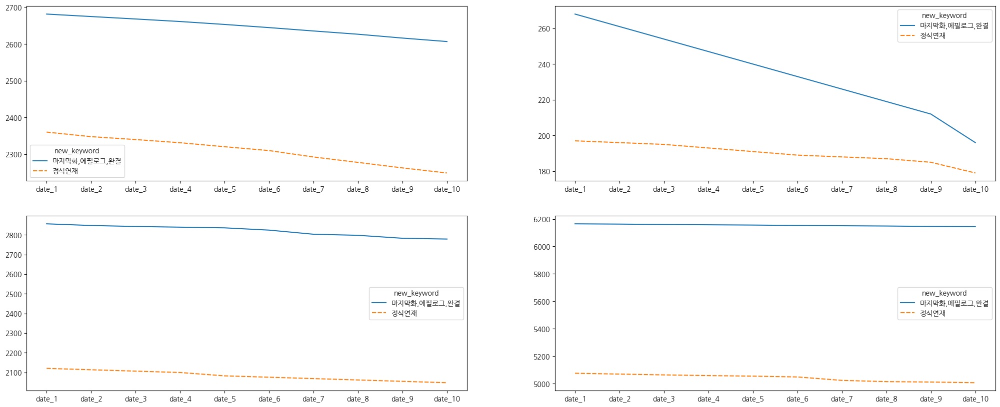

In [53]:
ten_date_avg = ten_div.groupby("new_keyword")[["date_1", "date_2", "date_3", "date_4", "date_5", "date_6", "date_7", "date_8", "date_9", "date_10"]].mean().T
ten_date_min = ten_div.groupby("new_keyword")[["date_1", "date_2", "date_3", "date_4", "date_5", "date_6", "date_7", "date_8", "date_9", "date_10"]].min().T
ten_date_mid = ten_div.groupby("new_keyword")[["date_1", "date_2", "date_3", "date_4", "date_5", "date_6", "date_7", "date_8", "date_9", "date_10"]].median().T
ten_date_max = ten_div.groupby("new_keyword")[["date_1", "date_2", "date_3", "date_4", "date_5", "date_6", "date_7", "date_8", "date_9", "date_10"]].max().T

fig, ax = plt.subplots(figsize = (25,10), nrows=2, ncols=2)
sns.lineplot(ten_date_avg, ax = ax[0][0])
sns.lineplot(ten_date_min, ax = ax[0][1])
sns.lineplot(ten_date_mid, ax = ax[1][0])
sns.lineplot(ten_date_max, ax = ax[1][1])

In [58]:
ten_div[["id", "new_keyword", "date_1"]].sort_values(by = "date_1", ascending= False)

,id,new_keyword,date_1
2,50004,"마지막화,에필로그,완결",6165
1,32937,"마지막화,에필로그,완결",5639
3,50196,"마지막화,에필로그,완결",5172
4,53694,"마지막화,에필로그,완결",5127
6,58149,정식연재,5075
...,...,...,...
468,792314,정식연재,285
470,792942,"마지막화,에필로그,완결",273
469,792936,"마지막화,에필로그,완결",271
471,793203,"마지막화,에필로그,완결",268


### View plot

<AxesSubplot: >

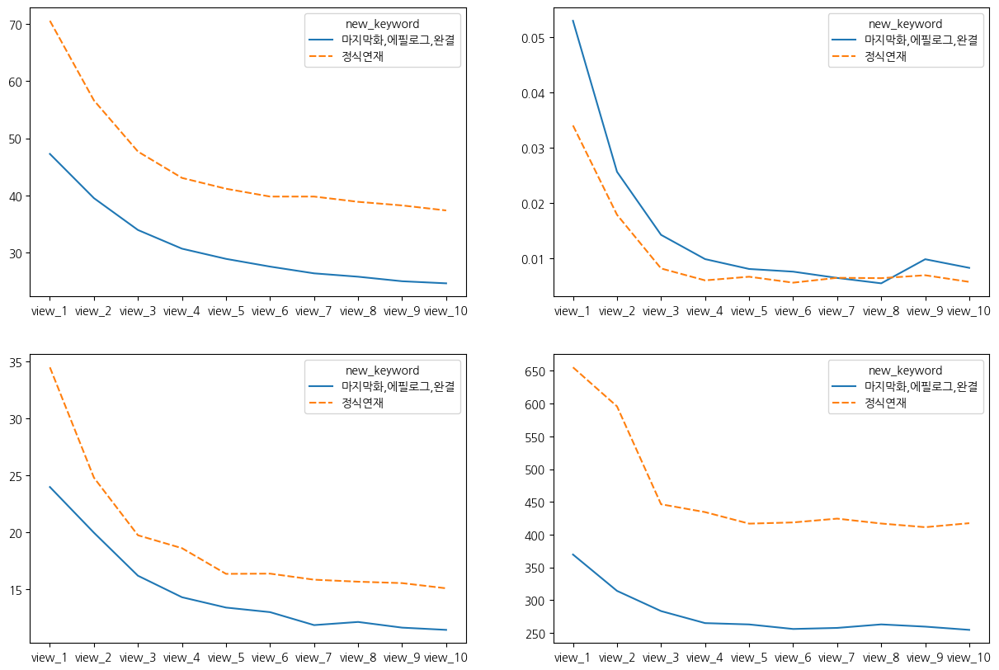

In [15]:
ten_view_avg = ten_div.groupby("new_keyword")[["view_1", "view_2", "view_3", "view_4", "view_5", "view_6", "view_7", "view_8", "view_9", "view_10"]].mean().T
ten_view_min = ten_div.groupby("new_keyword")[["view_1", "view_2", "view_3", "view_4", "view_5", "view_6", "view_7", "view_8", "view_9", "view_10"]].min().T
ten_view_mid = ten_div.groupby("new_keyword")[["view_1", "view_2", "view_3", "view_4", "view_5", "view_6", "view_7", "view_8", "view_9", "view_10"]].median().T
ten_view_max = ten_div.groupby("new_keyword")[["view_1", "view_2", "view_3", "view_4", "view_5", "view_6", "view_7", "view_8", "view_9", "view_10"]].max().T

fig, ax = plt.subplots(figsize = (15,10), nrows=2, ncols=2)
sns.lineplot(ten_view_avg, ax = ax[0][0])
sns.lineplot(ten_view_min, ax = ax[0][1])
sns.lineplot(ten_view_mid, ax = ax[1][0])
sns.lineplot(ten_view_max, ax = ax[1][1])

* View의 경우, 3회차까지 감소하는 기울기가 매우 가파름

### Rating plot

<AxesSubplot: >

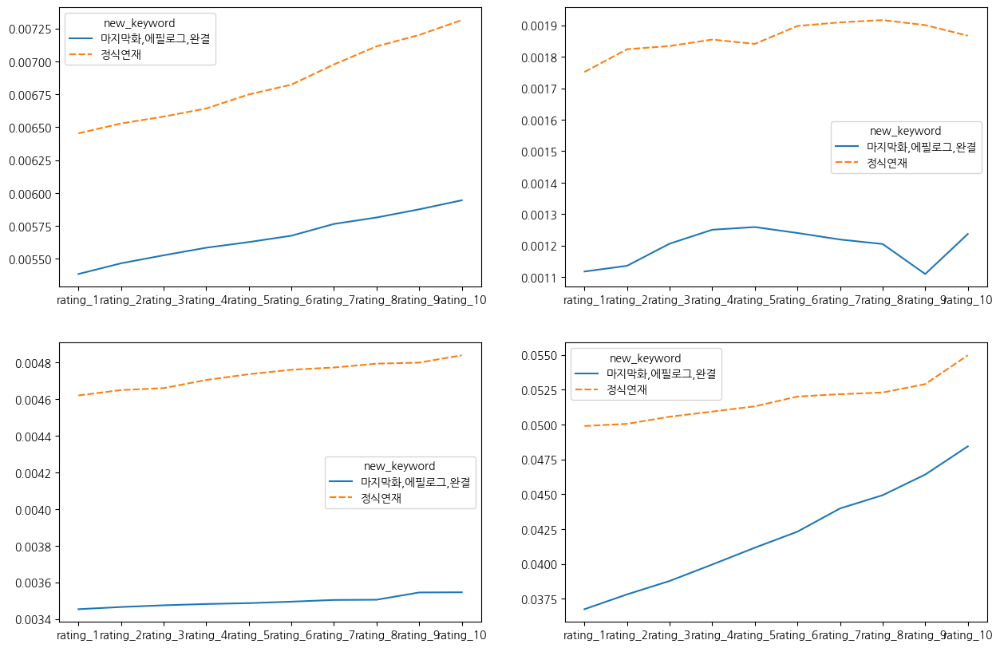

In [16]:
ten_rating_avg = ten_div.groupby("new_keyword")[["rating_1", "rating_2", "rating_3", "rating_4", "rating_5", "rating_6", "rating_7", "rating_8", "rating_9", "rating_10"]].mean().T
ten_rating_min = ten_div.groupby("new_keyword")[["rating_1", "rating_2", "rating_3", "rating_4", "rating_5", "rating_6", "rating_7", "rating_8", "rating_9", "rating_10"]].min().T
ten_rating_mid = ten_div.groupby("new_keyword")[["rating_1", "rating_2", "rating_3", "rating_4", "rating_5", "rating_6", "rating_7", "rating_8", "rating_9", "rating_10"]].median().T
ten_rating_max = ten_div.groupby("new_keyword")[["rating_1", "rating_2", "rating_3", "rating_4", "rating_5", "rating_6", "rating_7", "rating_8", "rating_9", "rating_10"]].max().T

fig, ax = plt.subplots(figsize = (15,10), nrows=2, ncols=2)
sns.lineplot(ten_rating_avg, ax = ax[0][0])
sns.lineplot(ten_rating_min, ax = ax[0][1])
sns.lineplot(ten_rating_mid, ax = ax[1][0])
sns.lineplot(ten_rating_max, ax = ax[1][1])

* 전체적으로 우상향하는 모습

In [202]:
ten_div[["label", "id", "rating_9"]].sort_values(by = "rating_9")

,label,id,rating_9
2,0,50004,0.001110
1,0,32937,0.001762
16,0,81092,0.001855
3,0,50196,0.001885
6,1,58149,0.001901
...,...,...,...
470,0,792942,0.040461
471,0,793203,0.046415
467,1,791830,0.048300
457,1,778214,0.052595


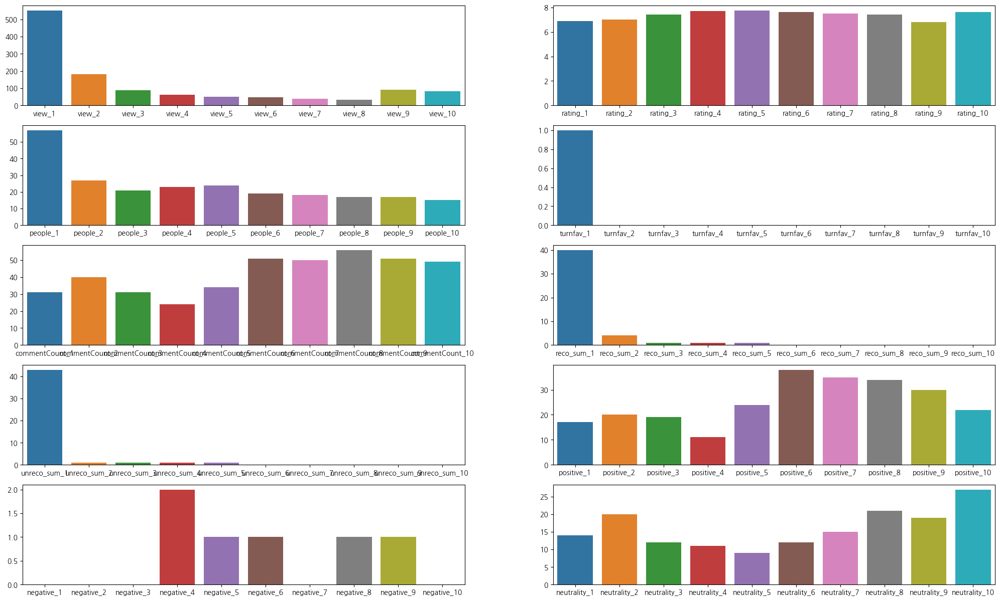

In [200]:
ten_total_barplots(ten, 50004)

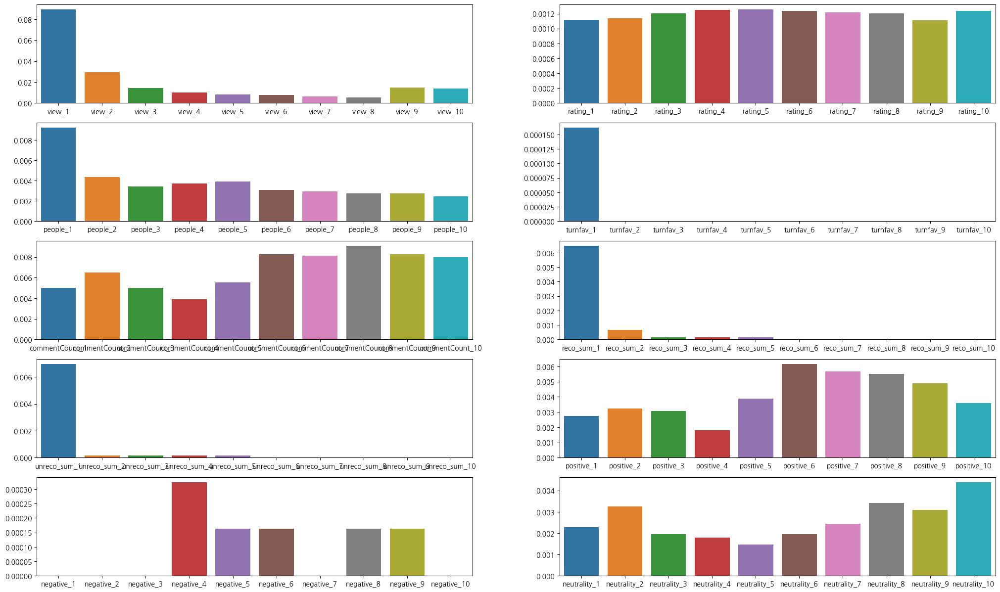

In [199]:
ten_total_barplots(ten_div, 50004)

### Like plot

<AxesSubplot: >

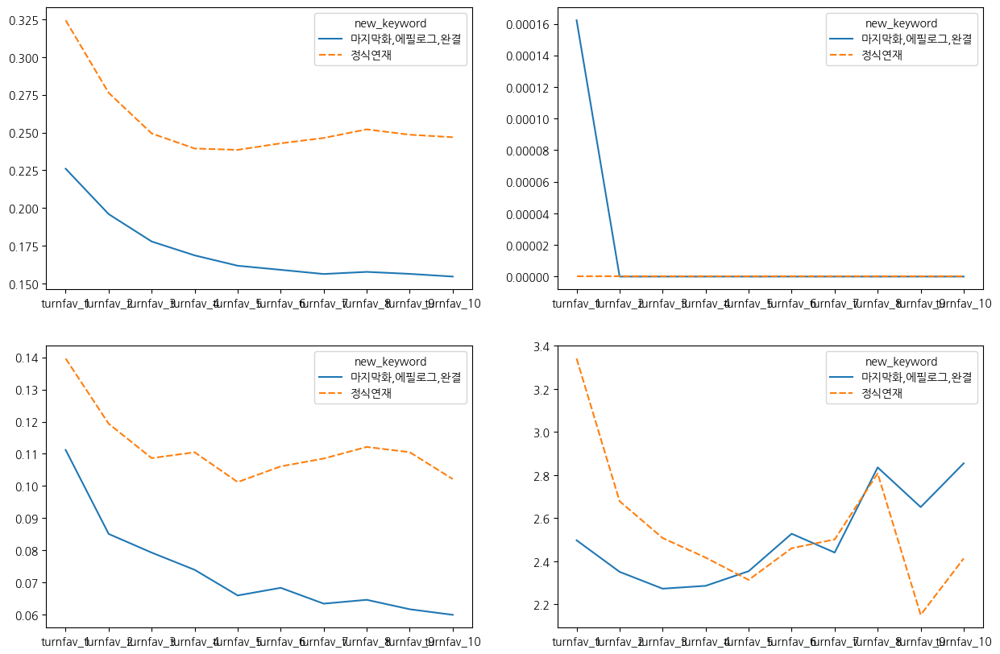

In [17]:
ten_turnfav_avg = ten_div.groupby("new_keyword")[["turnfav_1", "turnfav_2", "turnfav_3", "turnfav_4", "turnfav_5", "turnfav_6", "turnfav_7", "turnfav_8", "turnfav_9", "turnfav_10"]].mean().T
ten_turnfav_min = ten_div.groupby("new_keyword")[["turnfav_1", "turnfav_2", "turnfav_3", "turnfav_4", "turnfav_5", "turnfav_6", "turnfav_7", "turnfav_8", "turnfav_9", "turnfav_10"]].min().T
ten_turnfav_mid = ten_div.groupby("new_keyword")[["turnfav_1", "turnfav_2", "turnfav_3", "turnfav_4", "turnfav_5", "turnfav_6", "turnfav_7", "turnfav_8", "turnfav_9", "turnfav_10"]].median().T
ten_turnfav_max = ten_div.groupby("new_keyword")[["turnfav_1", "turnfav_2", "turnfav_3", "turnfav_4", "turnfav_5", "turnfav_6", "turnfav_7", "turnfav_8", "turnfav_9", "turnfav_10"]].max().T

fig, ax = plt.subplots(figsize = (15,10), nrows=2, ncols=2)
sns.lineplot(ten_turnfav_avg, ax = ax[0][0])
sns.lineplot(ten_turnfav_min, ax = ax[0][1])
sns.lineplot(ten_turnfav_mid, ax = ax[1][0])
sns.lineplot(ten_turnfav_max, ax = ax[1][1])

* 좋아요 수 평균값이 조회수 평균 line plot과 비슷한 흐름을 가져감

In [203]:
ten_div[["id", "label", "turnfav_9"]].sort_values(by = "turnfav_9")

,id,label,turnfav_9
117,556709,1,0.000000
43,247257,1,0.000000
23,124079,1,0.000000
57,344808,1,0.000000
82,479506,1,0.000000
...,...,...,...
472,796167,1,1.935484
249,674218,1,2.102268
373,727585,1,2.112490
346,714912,1,2.150979


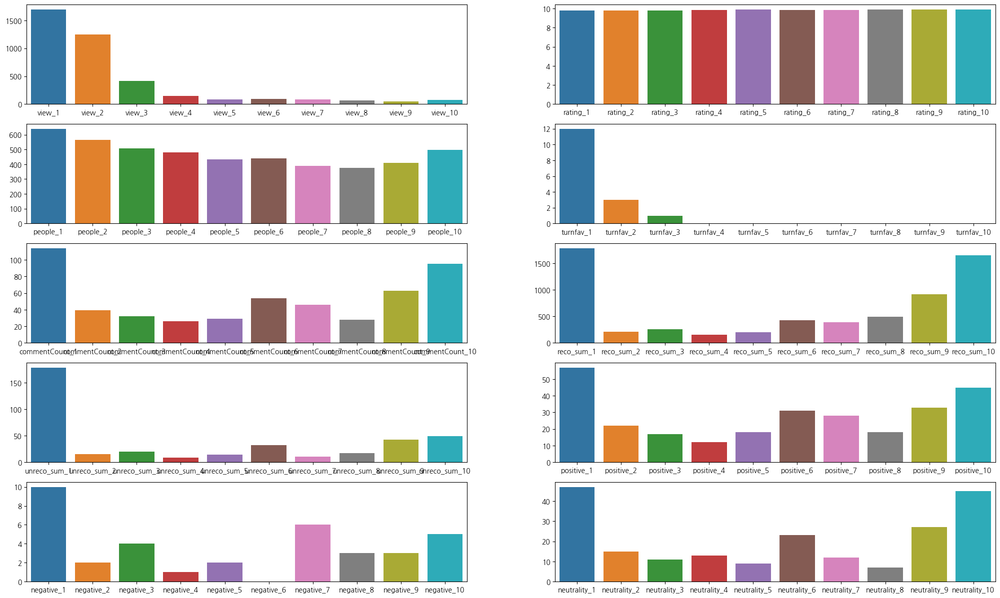

In [204]:
ten_total_barplots(ten, 556709)

### People plot

<AxesSubplot: >

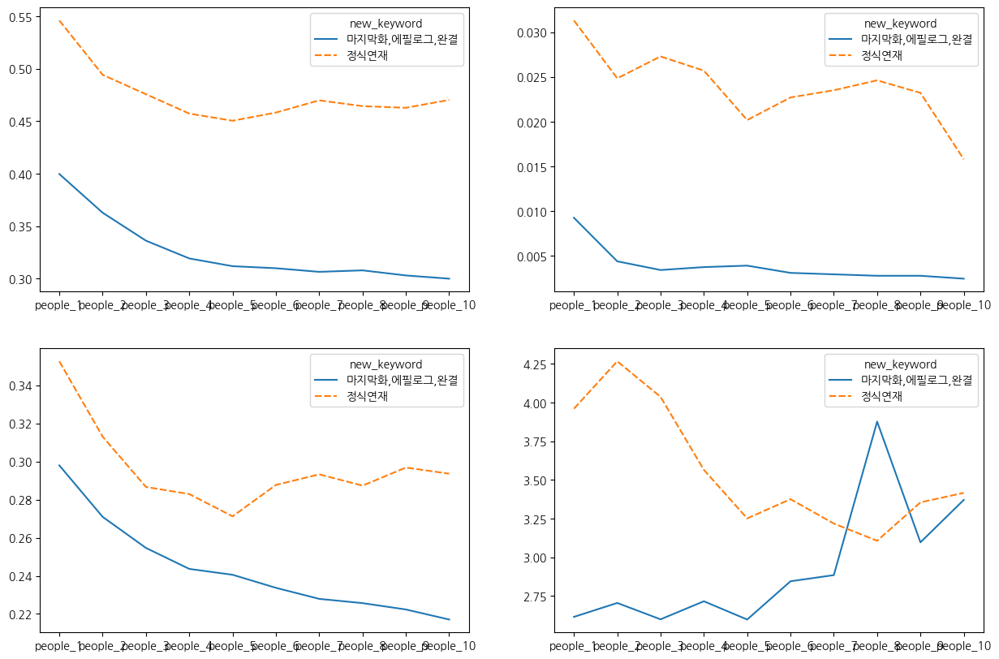

In [18]:
ten_people_avg = ten_div.groupby("new_keyword")[["people_1", "people_2", "people_3", "people_4", "people_5", "people_6", "people_7", "people_8", "people_9", "people_10"]].mean().T
ten_people_min = ten_div.groupby("new_keyword")[["people_1", "people_2", "people_3", "people_4", "people_5", "people_6", "people_7", "people_8", "people_9", "people_10"]].min().T
ten_people_mid = ten_div.groupby("new_keyword")[["people_1", "people_2", "people_3", "people_4", "people_5", "people_6", "people_7", "people_8", "people_9", "people_10"]].median().T
ten_people_max = ten_div.groupby("new_keyword")[["people_1", "people_2", "people_3", "people_4", "people_5", "people_6", "people_7", "people_8", "people_9", "people_10"]].max().T

fig, ax = plt.subplots(figsize = (15,10), nrows=2, ncols=2)
sns.lineplot(ten_people_avg, ax = ax[0][0])
sns.lineplot(ten_people_min, ax = ax[0][1])
sns.lineplot(ten_people_mid, ax = ax[1][0])
sns.lineplot(ten_people_max, ax = ax[1][1])

* 평균적으로 우하향

In [207]:
ten_div[["id", "label", "date_8", "date_9", "turnfav_8", "turnfav_9", "people_8", "people_9"]].sort_values(by=["people_8"], ascending= False)

,id,label,date_8,date_9,turnfav_8,turnfav_9,people_8,people_9
456,777158,0,493,488,1.874239,1.723361,3.876268,2.627049
458,780808,0,420,413,2.835714,2.651332,3.297619,3.096852
472,796167,1,187,186,1.834225,1.935484,3.106952,3.354839
138,587576,1,3332,3327,1.030912,1.023144,2.892857,2.890592
406,739130,1,1051,1044,2.020932,1.926245,2.882969,2.792146
...,...,...,...,...,...,...,...,...
21,105527,0,4707,4699,0.000637,0.001064,0.022307,0.025325
16,81092,0,4864,4857,0.000000,0.000206,0.019531,0.019354
41,243306,0,4417,4410,0.000226,0.000227,0.014716,0.015193
175,626184,0,3066,3058,0.002935,0.001635,0.014351,0.013080


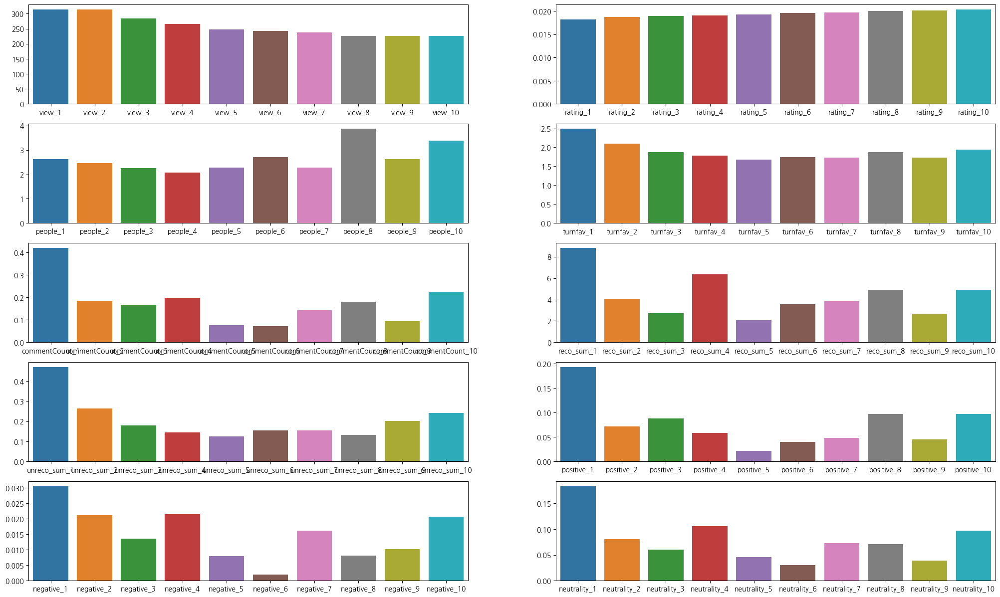

In [208]:
ten_total_barplots(ten_div, 777158)

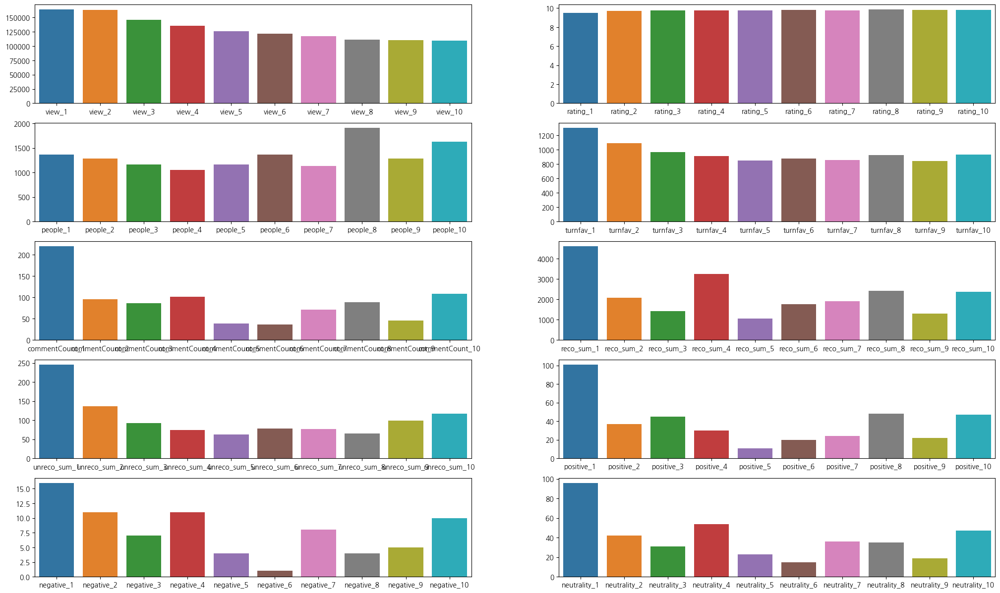

In [209]:
ten_total_barplots(ten, 777158)

### Rating Score plot

<AxesSubplot: >

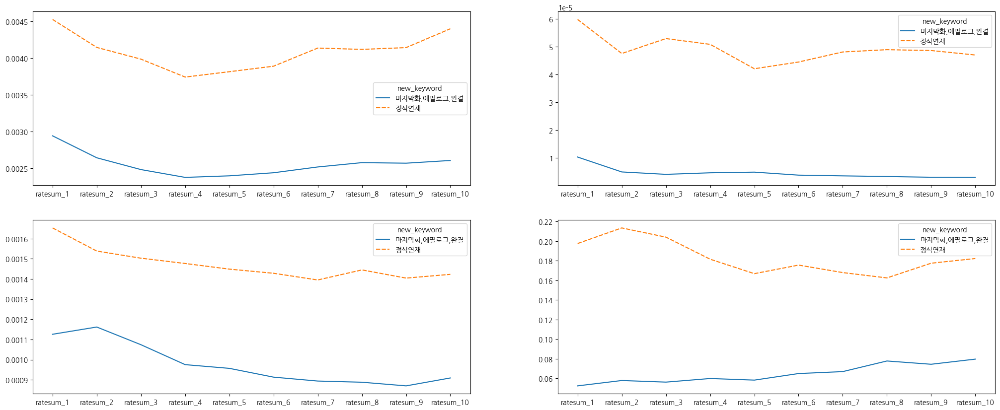

In [30]:
ten_div["ratesum_1"] = ten_div["rating_1"]*ten_div["people_1"]
ten_div["ratesum_2"] = ten_div["rating_2"]*ten_div["people_2"]
ten_div["ratesum_3"] = ten_div["rating_3"]*ten_div["people_3"]
ten_div["ratesum_4"] = ten_div["rating_4"]*ten_div["people_4"]
ten_div["ratesum_5"] = ten_div["rating_5"]*ten_div["people_5"]
ten_div["ratesum_6"] = ten_div["rating_6"]*ten_div["people_6"]
ten_div["ratesum_7"] = ten_div["rating_7"]*ten_div["people_7"]
ten_div["ratesum_8"] = ten_div["rating_8"]*ten_div["people_8"]
ten_div["ratesum_9"] = ten_div["rating_9"]*ten_div["people_9"]
ten_div["ratesum_10"] = ten_div["rating_10"]*ten_div["people_10"]

ten_ratesum_avg = ten_div.groupby("new_keyword")[["ratesum_1", "ratesum_2", "ratesum_3", "ratesum_4", "ratesum_5", "ratesum_6", "ratesum_7", "ratesum_8", "ratesum_9", "ratesum_10"]].mean().T
ten_ratesum_min = ten_div.groupby("new_keyword")[["ratesum_1", "ratesum_2", "ratesum_3", "ratesum_4", "ratesum_5", "ratesum_6", "ratesum_7", "ratesum_8", "ratesum_9", "ratesum_10"]].min().T
ten_ratesum_mid = ten_div.groupby("new_keyword")[["ratesum_1", "ratesum_2", "ratesum_3", "ratesum_4", "ratesum_5", "ratesum_6", "ratesum_7", "ratesum_8", "ratesum_9", "ratesum_10"]].median().T
ten_ratesum_max = ten_div.groupby("new_keyword")[["ratesum_1", "ratesum_2", "ratesum_3", "ratesum_4", "ratesum_5", "ratesum_6", "ratesum_7", "ratesum_8", "ratesum_9", "ratesum_10"]].max().T

fig, ax = plt.subplots(figsize = (25,10), nrows=2, ncols=2)
sns.lineplot(ten_ratesum_avg, ax = ax[0][0])
sns.lineplot(ten_ratesum_min, ax = ax[0][1])
sns.lineplot(ten_ratesum_mid, ax = ax[1][0])
sns.lineplot(ten_ratesum_max, ax = ax[1][1])

### Features from comments plot

<AxesSubplot: >

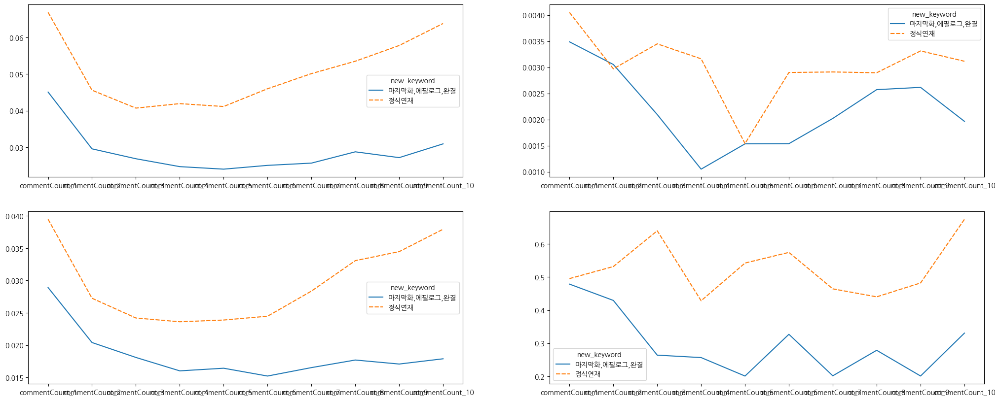

In [31]:
# commentCount
ten_commentCount_avg = ten_div.groupby("new_keyword")[["commentCount_1", "commentCount_2", "commentCount_3", "commentCount_4", "commentCount_5", "commentCount_6", "commentCount_7", "commentCount_8", "commentCount_9", "commentCount_10"]].mean().T
ten_commentCount_min = ten_div.groupby("new_keyword")[["commentCount_1", "commentCount_2", "commentCount_3", "commentCount_4", "commentCount_5", "commentCount_6", "commentCount_7", "commentCount_8", "commentCount_9", "commentCount_10"]].min().T
ten_commentCount_mid = ten_div.groupby("new_keyword")[["commentCount_1", "commentCount_2", "commentCount_3", "commentCount_4", "commentCount_5", "commentCount_6", "commentCount_7", "commentCount_8", "commentCount_9", "commentCount_10"]].median().T
ten_commentCount_max = ten_div.groupby("new_keyword")[["commentCount_1", "commentCount_2", "commentCount_3", "commentCount_4", "commentCount_5", "commentCount_6", "commentCount_7", "commentCount_8", "commentCount_9", "commentCount_10"]].max().T

fig, ax = plt.subplots(figsize = (25,10), nrows=2, ncols=2)
sns.lineplot(ten_commentCount_avg, ax = ax[0][0])
sns.lineplot(ten_commentCount_min, ax = ax[0][1])
sns.lineplot(ten_commentCount_mid, ax = ax[1][0])
sns.lineplot(ten_commentCount_max, ax = ax[1][1])

* 정식 연재는 U 자형 형태를 띄고 있지만, 비정식연재는 우하향

<AxesSubplot: >

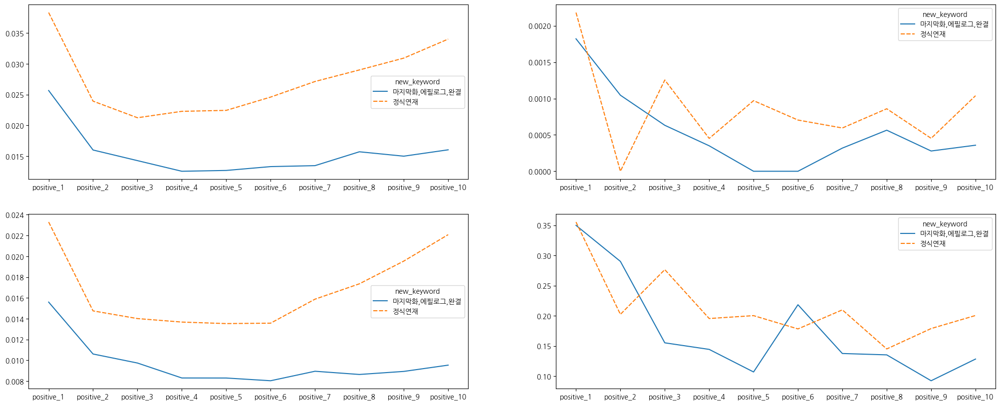

In [32]:
# positive
ten_positive_avg = ten_div.groupby("new_keyword")[["positive_1", "positive_2", "positive_3", "positive_4", "positive_5", "positive_6", "positive_7", "positive_8", "positive_9", "positive_10"]].mean().T
ten_positive_min = ten_div.groupby("new_keyword")[["positive_1", "positive_2", "positive_3", "positive_4", "positive_5", "positive_6", "positive_7", "positive_8", "positive_9", "positive_10"]].min().T
ten_positive_mid = ten_div.groupby("new_keyword")[["positive_1", "positive_2", "positive_3", "positive_4", "positive_5", "positive_6", "positive_7", "positive_8", "positive_9", "positive_10"]].median().T
ten_positive_max = ten_div.groupby("new_keyword")[["positive_1", "positive_2", "positive_3", "positive_4", "positive_5", "positive_6", "positive_7", "positive_8", "positive_9", "positive_10"]].max().T

fig, ax = plt.subplots(figsize = (25,10), nrows=2, ncols=2)
sns.lineplot(ten_positive_avg, ax = ax[0][0])
sns.lineplot(ten_positive_min, ax = ax[0][1])
sns.lineplot(ten_positive_mid, ax = ax[1][0])
sns.lineplot(ten_positive_max, ax = ax[1][1])

In [46]:
ten_div[["id", "new_keyword", "date_2", "rating_2", "turnfav_2", "commentCount_2", "positive_2", "negative_2", "neutrality_2"]].sort_values(by=["positive_2"])

,id,new_keyword,date_2,rating_2,turnfav_2,commentCount_2,positive_2,negative_2,neutrality_2
401,736034,정식연재,1152,0.008229,0.033854,0.010417,0.000000,0.000000,0.000868
203,648399,"마지막화,에필로그,완결",2869,0.003426,0.020216,0.003137,0.001046,0.000000,0.002091
168,622483,"마지막화,에필로그,완결",3164,0.003110,0.017383,0.004109,0.001264,0.000632,0.002212
276,689090,"마지막화,에필로그,완결",2206,0.004429,0.070263,0.005440,0.001360,0.001360,0.002720
118,559738,"마지막화,에필로그,완결",3505,0.002782,0.011127,0.003994,0.001427,0.000571,0.001997
...,...,...,...,...,...,...,...,...,...
77,461059,정식연재,3931,0.002503,0.283134,0.269906,0.144747,0.020351,0.104554
346,714912,정식연재,1130,0.008743,2.534513,0.203540,0.154867,0.004425,0.044248
36,188562,정식연재,4545,0.002145,0.011001,0.355996,0.198680,0.025963,0.131353
89,489585,정식연재,3448,0.002863,0.051044,0.531613,0.202436,0.050174,0.278712


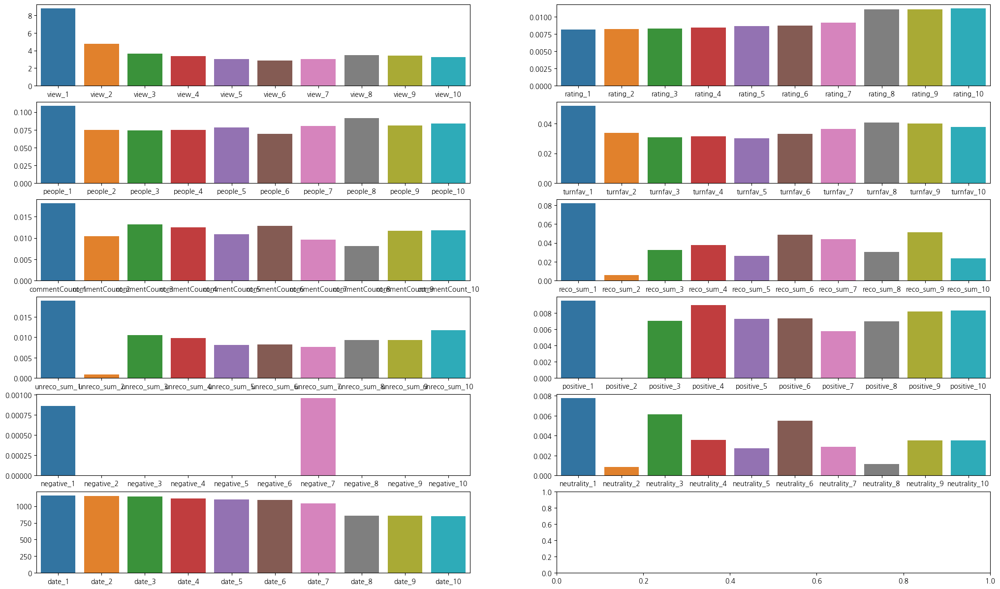

In [39]:
ten_div_barplots(736034)

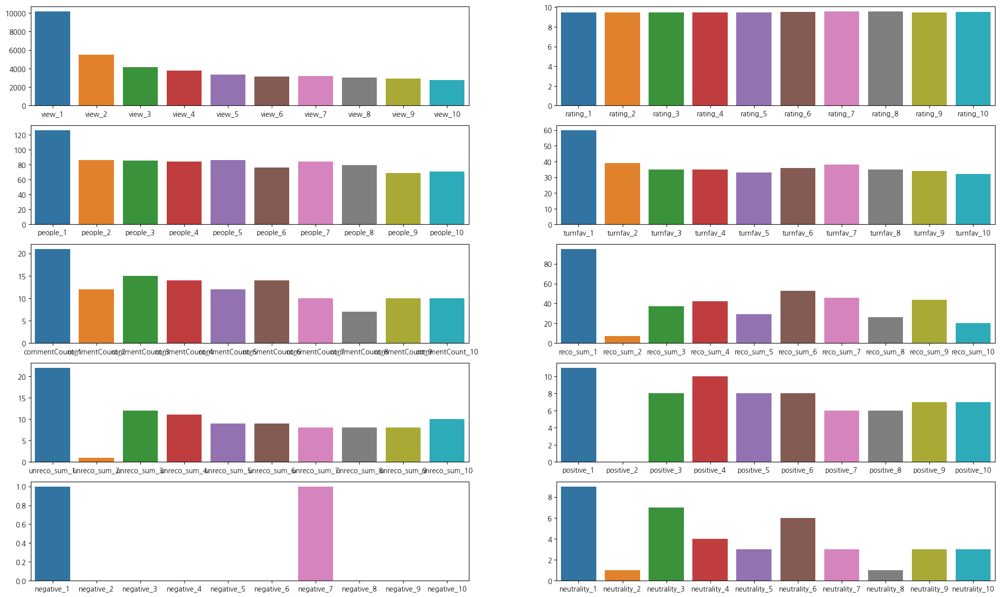

In [41]:
total_barplots(736034)

<AxesSubplot: >

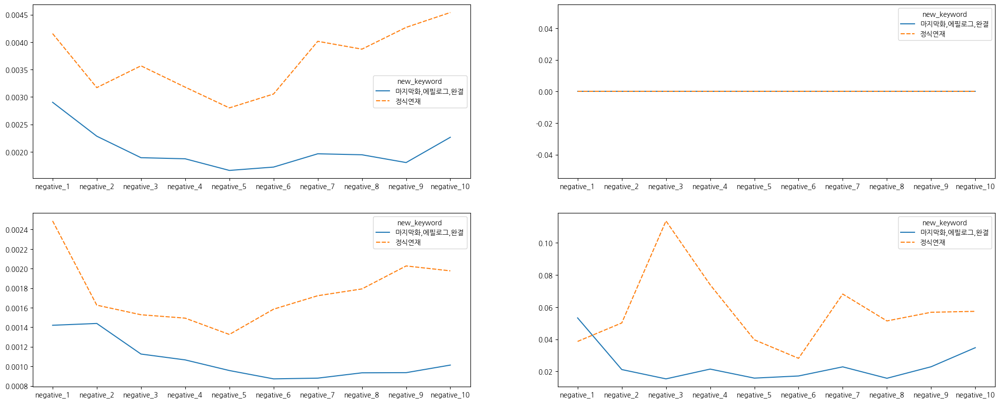

In [43]:
# negative
ten_negative_avg = ten_div.groupby("new_keyword")[["negative_1", "negative_2", "negative_3", "negative_4", "negative_5", "negative_6", "negative_7", "negative_8", "negative_9", "negative_10"]].mean().T
ten_negative_min = ten_div.groupby("new_keyword")[["negative_1", "negative_2", "negative_3", "negative_4", "negative_5", "negative_6", "negative_7", "negative_8", "negative_9", "negative_10"]].min().T
ten_negative_mid = ten_div.groupby("new_keyword")[["negative_1", "negative_2", "negative_3", "negative_4", "negative_5", "negative_6", "negative_7", "negative_8", "negative_9", "negative_10"]].median().T
ten_negative_max = ten_div.groupby("new_keyword")[["negative_1", "negative_2", "negative_3", "negative_4", "negative_5", "negative_6", "negative_7", "negative_8", "negative_9", "negative_10"]].max().T

fig, ax = plt.subplots(figsize = (25,10), nrows=2, ncols=2)
sns.lineplot(ten_negative_avg, ax = ax[0][0])
sns.lineplot(ten_negative_min, ax = ax[0][1])
sns.lineplot(ten_negative_mid, ax = ax[1][0])
sns.lineplot(ten_negative_max, ax = ax[1][1])

<AxesSubplot: >

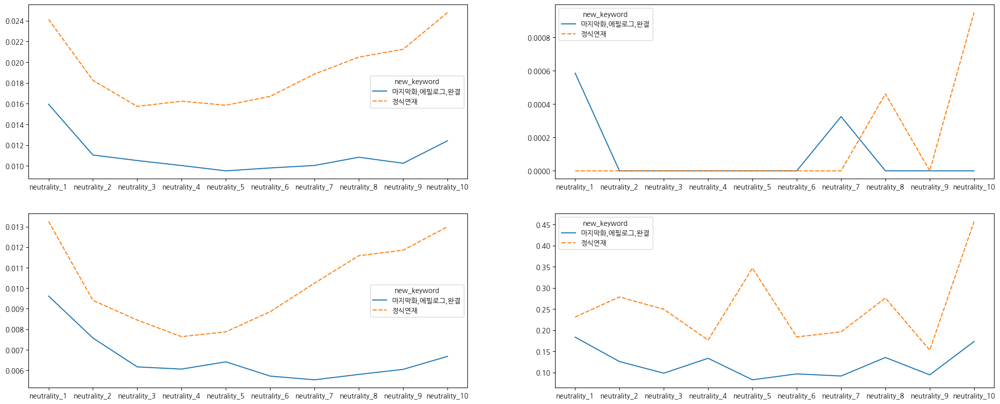

In [44]:
# neutrality
ten_neutrality_avg = ten_div.groupby("new_keyword")[["neutrality_1", "neutrality_2", "neutrality_3", "neutrality_4", "neutrality_5", "neutrality_6", "neutrality_7", "neutrality_8", "neutrality_9", "neutrality_10"]].mean().T
ten_neutrality_min = ten_div.groupby("new_keyword")[["neutrality_1", "neutrality_2", "neutrality_3", "neutrality_4", "neutrality_5", "neutrality_6", "neutrality_7", "neutrality_8", "neutrality_9", "neutrality_10"]].min().T
ten_neutrality_mid = ten_div.groupby("new_keyword")[["neutrality_1", "neutrality_2", "neutrality_3", "neutrality_4", "neutrality_5", "neutrality_6", "neutrality_7", "neutrality_8", "neutrality_9", "neutrality_10"]].median().T
ten_neutrality_max = ten_div.groupby("new_keyword")[["neutrality_1", "neutrality_2", "neutrality_3", "neutrality_4", "neutrality_5", "neutrality_6", "neutrality_7", "neutrality_8", "neutrality_9", "neutrality_10"]].max().T

fig, ax = plt.subplots(figsize = (25,10), nrows=2, ncols=2)
sns.lineplot(ten_neutrality_avg, ax = ax[0][0])
sns.lineplot(ten_neutrality_min, ax = ax[0][1])
sns.lineplot(ten_neutrality_mid, ax = ax[1][0])
sns.lineplot(ten_neutrality_max, ax = ax[1][1])

* 긍정/부정/중립은 댓글수와 비슷한 그래프 흐름을 보임

<AxesSubplot: >

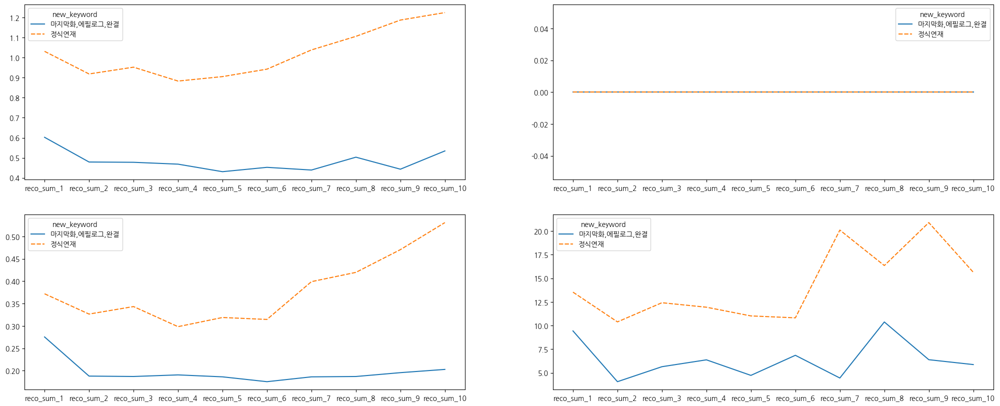

In [47]:
# reco_sum
ten_reco_sum_avg = ten_div.groupby("new_keyword")[["reco_sum_1", "reco_sum_2", "reco_sum_3", "reco_sum_4", "reco_sum_5", "reco_sum_6", "reco_sum_7", "reco_sum_8", "reco_sum_9", "reco_sum_10"]].mean().T
ten_reco_sum_min = ten_div.groupby("new_keyword")[["reco_sum_1", "reco_sum_2", "reco_sum_3", "reco_sum_4", "reco_sum_5", "reco_sum_6", "reco_sum_7", "reco_sum_8", "reco_sum_9", "reco_sum_10"]].min().T
ten_reco_sum_mid = ten_div.groupby("new_keyword")[["reco_sum_1", "reco_sum_2", "reco_sum_3", "reco_sum_4", "reco_sum_5", "reco_sum_6", "reco_sum_7", "reco_sum_8", "reco_sum_9", "reco_sum_10"]].median().T
ten_reco_sum_max = ten_div.groupby("new_keyword")[["reco_sum_1", "reco_sum_2", "reco_sum_3", "reco_sum_4", "reco_sum_5", "reco_sum_6", "reco_sum_7", "reco_sum_8", "reco_sum_9", "reco_sum_10"]].max().T

fig, ax = plt.subplots(figsize = (25,10), nrows=2, ncols=2)
sns.lineplot(ten_reco_sum_avg, ax = ax[0][0])
sns.lineplot(ten_reco_sum_min, ax = ax[0][1])
sns.lineplot(ten_reco_sum_mid, ax = ax[1][0])
sns.lineplot(ten_reco_sum_max, ax = ax[1][1])

<AxesSubplot: >

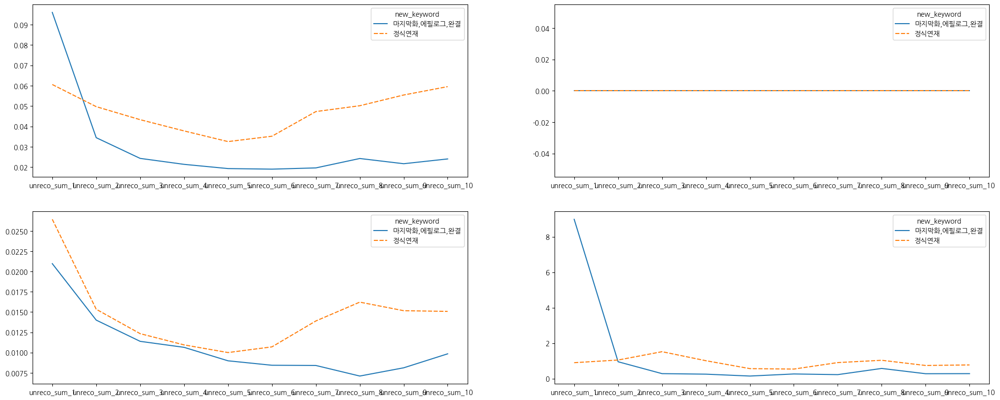

In [48]:
# unreco_sum
ten_unreco_sum_avg = ten_div.groupby("new_keyword")[["unreco_sum_1", "unreco_sum_2", "unreco_sum_3", "unreco_sum_4", "unreco_sum_5", "unreco_sum_6", "unreco_sum_7", "unreco_sum_8", "unreco_sum_9", "unreco_sum_10"]].mean().T
ten_unreco_sum_min = ten_div.groupby("new_keyword")[["unreco_sum_1", "unreco_sum_2", "unreco_sum_3", "unreco_sum_4", "unreco_sum_5", "unreco_sum_6", "unreco_sum_7", "unreco_sum_8", "unreco_sum_9", "unreco_sum_10"]].min().T
ten_unreco_sum_mid = ten_div.groupby("new_keyword")[["unreco_sum_1", "unreco_sum_2", "unreco_sum_3", "unreco_sum_4", "unreco_sum_5", "unreco_sum_6", "unreco_sum_7", "unreco_sum_8", "unreco_sum_9", "unreco_sum_10"]].median().T
ten_unreco_sum_max = ten_div.groupby("new_keyword")[["unreco_sum_1", "unreco_sum_2", "unreco_sum_3", "unreco_sum_4", "unreco_sum_5", "unreco_sum_6", "unreco_sum_7", "unreco_sum_8", "unreco_sum_9", "unreco_sum_10"]].max().T

fig, ax = plt.subplots(figsize = (25,10), nrows=2, ncols=2)
sns.lineplot(ten_unreco_sum_avg, ax = ax[0][0])
sns.lineplot(ten_unreco_sum_min, ax = ax[0][1])
sns.lineplot(ten_unreco_sum_mid, ax = ax[1][0])
sns.lineplot(ten_unreco_sum_max, ax = ax[1][1])

* 댓글의 추천/비추천수 누적도 전반적으로 U자형 그래프

<AxesSubplot: >

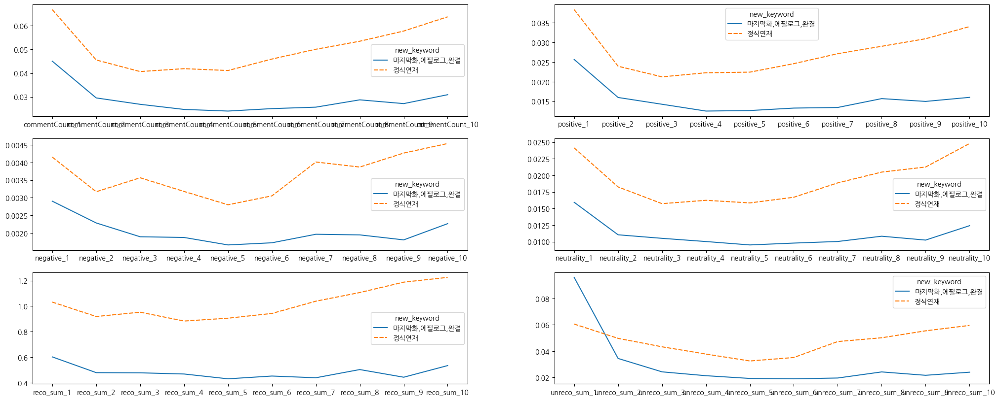

In [49]:
# overview of comment
ten_commentCount_avg = ten_div.groupby("new_keyword")[["commentCount_1", "commentCount_2", "commentCount_3", "commentCount_4", "commentCount_5", "commentCount_6", "commentCount_7", "commentCount_8", "commentCount_9", "commentCount_10"]].mean().T
ten_positive_avg = ten_div.groupby("new_keyword")[["positive_1", "positive_2", "positive_3", "positive_4", "positive_5", "positive_6", "positive_7", "positive_8", "positive_9", "positive_10"]].mean().T
ten_negative_avg = ten_div.groupby("new_keyword")[["negative_1", "negative_2", "negative_3", "negative_4", "negative_5", "negative_6", "negative_7", "negative_8", "negative_9", "negative_10"]].mean().T
ten_neutrality_avg = ten_div.groupby("new_keyword")[["neutrality_1", "neutrality_2", "neutrality_3", "neutrality_4", "neutrality_5", "neutrality_6", "neutrality_7", "neutrality_8", "neutrality_9", "neutrality_10"]].mean().T
ten_reco_sum_avg = ten_div.groupby("new_keyword")[["reco_sum_1", "reco_sum_2", "reco_sum_3", "reco_sum_4", "reco_sum_5", "reco_sum_6", "reco_sum_7", "reco_sum_8", "reco_sum_9", "reco_sum_10"]].mean().T
ten_unreco_sum_avg = ten_div.groupby("new_keyword")[["unreco_sum_1", "unreco_sum_2", "unreco_sum_3", "unreco_sum_4", "unreco_sum_5", "unreco_sum_6", "unreco_sum_7", "unreco_sum_8", "unreco_sum_9", "unreco_sum_10"]].mean().T

fig, ax = plt.subplots(figsize = (25,10), nrows=3, ncols=2)
sns.lineplot(ten_commentCount_avg, ax = ax[0][0])
sns.lineplot(ten_positive_avg, ax = ax[0][1])
sns.lineplot(ten_negative_avg, ax = ax[1][0])
sns.lineplot(ten_neutrality_avg, ax = ax[1][1])
sns.lineplot(ten_reco_sum_avg, ax = ax[2][0])
sns.lineplot(ten_unreco_sum_avg, ax = ax[2][1])

### Rate of reactions on comments

<AxesSubplot: >

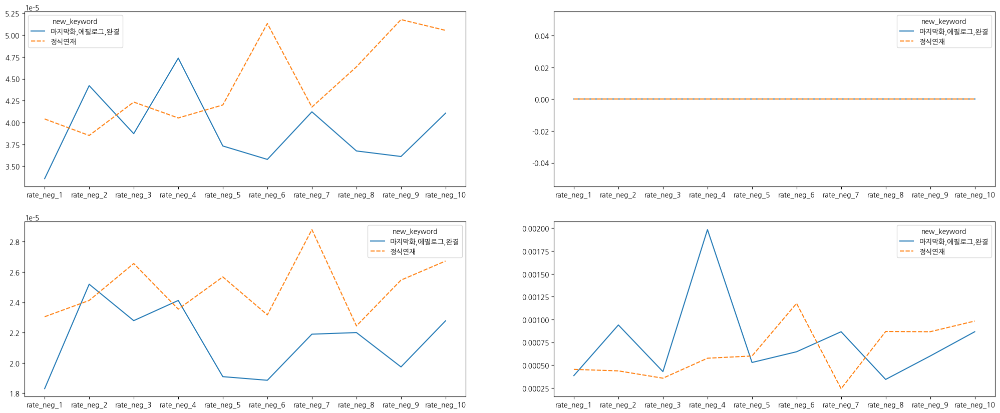

In [50]:
# rate_neg
ten_rate_neg_avg = ten_div.groupby("new_keyword")[["rate_neg_1", "rate_neg_2", "rate_neg_3", "rate_neg_4", "rate_neg_5", "rate_neg_6", "rate_neg_7", "rate_neg_8", "rate_neg_9", "rate_neg_10"]].mean().T
ten_rate_neg_min = ten_div.groupby("new_keyword")[["rate_neg_1", "rate_neg_2", "rate_neg_3", "rate_neg_4", "rate_neg_5", "rate_neg_6", "rate_neg_7", "rate_neg_8", "rate_neg_9", "rate_neg_10"]].min().T
ten_rate_neg_mid = ten_div.groupby("new_keyword")[["rate_neg_1", "rate_neg_2", "rate_neg_3", "rate_neg_4", "rate_neg_5", "rate_neg_6", "rate_neg_7", "rate_neg_8", "rate_neg_9", "rate_neg_10"]].median().T
ten_rate_neg_max = ten_div.groupby("new_keyword")[["rate_neg_1", "rate_neg_2", "rate_neg_3", "rate_neg_4", "rate_neg_5", "rate_neg_6", "rate_neg_7", "rate_neg_8", "rate_neg_9", "rate_neg_10"]].max().T

fig, ax = plt.subplots(figsize = (25,10), nrows=2, ncols=2)
sns.lineplot(ten_rate_neg_avg, ax = ax[0][0])
sns.lineplot(ten_rate_neg_min, ax = ax[0][1])
sns.lineplot(ten_rate_neg_mid, ax = ax[1][0])
sns.lineplot(ten_rate_neg_max, ax = ax[1][1])

* 웹툰 초반 지표에서 부정적인 반응의 비율이 많은 작품들은 비정식연재되는 경우가 많음
* 정식연재의 경우, 반대로 5회차를 넘어선 시점에서는 이탈하는 독자들의 수가 줄어들면서 댓글로 의견표명을 하는 인원수가 많아진 것으로 생각됨
* 크게 봤을때 어떠한 특성을 추출해내기 어려울거라 판단

<AxesSubplot: >

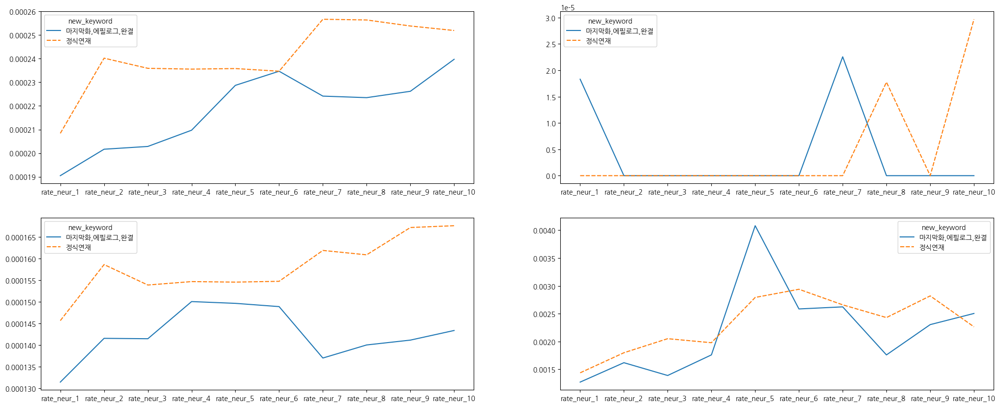

In [51]:
# rate_neur
ten_rate_neur_avg = ten_div.groupby("new_keyword")[["rate_neur_1", "rate_neur_2", "rate_neur_3", "rate_neur_4", "rate_neur_5", "rate_neur_6", "rate_neur_7", "rate_neur_8", "rate_neur_9", "rate_neur_10"]].mean().T
ten_rate_neur_min = ten_div.groupby("new_keyword")[["rate_neur_1", "rate_neur_2", "rate_neur_3", "rate_neur_4", "rate_neur_5", "rate_neur_6", "rate_neur_7", "rate_neur_8", "rate_neur_9", "rate_neur_10"]].min().T
ten_rate_neur_mid = ten_div.groupby("new_keyword")[["rate_neur_1", "rate_neur_2", "rate_neur_3", "rate_neur_4", "rate_neur_5", "rate_neur_6", "rate_neur_7", "rate_neur_8", "rate_neur_9", "rate_neur_10"]].median().T
ten_rate_neur_max = ten_div.groupby("new_keyword")[["rate_neur_1", "rate_neur_2", "rate_neur_3", "rate_neur_4", "rate_neur_5", "rate_neur_6", "rate_neur_7", "rate_neur_8", "rate_neur_9", "rate_neur_10"]].max().T

fig, ax = plt.subplots(figsize = (25,10), nrows=2, ncols=2)
sns.lineplot(ten_rate_neur_avg, ax = ax[0][0])
sns.lineplot(ten_rate_neur_min, ax = ax[0][1])
sns.lineplot(ten_rate_neur_mid, ax = ax[1][0])
sns.lineplot(ten_rate_neur_max, ax = ax[1][1])

<AxesSubplot: >

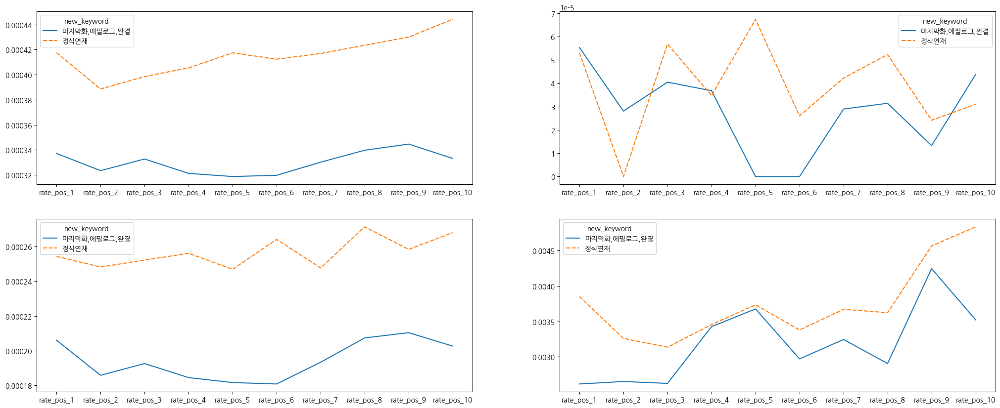

In [52]:
# rate_pos
ten_rate_pos_avg = ten_div.groupby("new_keyword")[["rate_pos_1", "rate_pos_2", "rate_pos_3", "rate_pos_4", "rate_pos_5", "rate_pos_6", "rate_pos_7", "rate_pos_8", "rate_pos_9", "rate_pos_10"]].mean().T
ten_rate_pos_min = ten_div.groupby("new_keyword")[["rate_pos_1", "rate_pos_2", "rate_pos_3", "rate_pos_4", "rate_pos_5", "rate_pos_6", "rate_pos_7", "rate_pos_8", "rate_pos_9", "rate_pos_10"]].min().T
ten_rate_pos_mid = ten_div.groupby("new_keyword")[["rate_pos_1", "rate_pos_2", "rate_pos_3", "rate_pos_4", "rate_pos_5", "rate_pos_6", "rate_pos_7", "rate_pos_8", "rate_pos_9", "rate_pos_10"]].median().T
ten_rate_pos_max = ten_div.groupby("new_keyword")[["rate_pos_1", "rate_pos_2", "rate_pos_3", "rate_pos_4", "rate_pos_5", "rate_pos_6", "rate_pos_7", "rate_pos_8", "rate_pos_9", "rate_pos_10"]].max().T

fig, ax = plt.subplots(figsize = (25,10), nrows=2, ncols=2)
sns.lineplot(ten_rate_pos_avg, ax = ax[0][0])
sns.lineplot(ten_rate_pos_min, ax = ax[0][1])
sns.lineplot(ten_rate_pos_mid, ax = ax[1][0])
sns.lineplot(ten_rate_pos_max, ax = ax[1][1])

* View : 초반 3회차까지 지표만 사용하는 것을 고려
* turnfav(좋아요) : 초반 3회차까지 지표만 사용하는 것을 고려
* rate_neg : 전부 제외 고려
* 댓글과 관련된 지표 : 1회차 & 10회차 지표만 사용하는 것 고려

## Feature

### Feature Engineering

In [4]:
# change columns name
ten_div = ten_div.rename(columns = {"new_keyword" : "label"})

In [5]:
# encoding label
ten_div.label = ten_div.label.replace({"정식연재" : 1, "마지막화,에필로그,완결" : 0})
ten_div.label

0      1
1      0
2      0
3      0
4      0
      ..
468    1
469    0
470    0
471    0
472    1
Name: label, Length: 473, dtype: int64

In [11]:
# create avg columns
df_average_10(ten_div)

In [12]:
ten_div["ratesum_1"] = ten_div["rating_1"]*ten_div["people_1"]
ten_div["ratesum_2"] = ten_div["rating_2"]*ten_div["people_2"]
ten_div["ratesum_3"] = ten_div["rating_3"]*ten_div["people_3"]
ten_div["ratesum_4"] = ten_div["rating_4"]*ten_div["people_4"]
ten_div["ratesum_5"] = ten_div["rating_5"]*ten_div["people_5"]
ten_div["ratesum_6"] = ten_div["rating_6"]*ten_div["people_6"]
ten_div["ratesum_7"] = ten_div["rating_7"]*ten_div["people_7"]
ten_div["ratesum_8"] = ten_div["rating_8"]*ten_div["people_8"]
ten_div["ratesum_9"] = ten_div["rating_9"]*ten_div["people_9"]
ten_div["ratesum_10"] = ten_div["rating_10"]*ten_div["people_10"]

ten_div["avg_rate_sum"] = (ten_div['ratesum_1'] + ten_div['ratesum_2'] + ten_div['ratesum_3'] + ten_div['ratesum_4'] + ten_div['ratesum_5'] + ten_div['ratesum_6'] + ten_div['ratesum_7'] + ten_div['ratesum_8']
                           + ten_div['ratesum_9'] + ten_div['ratesum_10'])/10

In [13]:
# # csv로 수정된 df 생성
# ten_div.to_csv("G:/내 드라이브/Project/FINAL/data_preprocessing/0102기준_모델링파일/total_episode_10_divided_by_date(from_20221226)_feature_engineering.csv", index= False)

In [14]:
# pd.read_csv("G:/내 드라이브/Project/FINAL/data_preprocessing/0102기준_모델링파일/total_episode_10_divided_by_date(from_20221226)_feature_engineering.csv")

,id,view_1,date_1,rating_1,people_1,turnfav_1,commentCount_1,reco_sum_1,reco_mean_1,unreco_sum_1,...,ratesum_2,ratesum_3,ratesum_4,ratesum_5,ratesum_6,ratesum_7,ratesum_8,ratesum_9,ratesum_10,avg_rate_sum
0,15067,134.253521,355,0.027296,0.873239,0.859155,0.169014,0.847887,0.014371,0.056338,...,0.031047,0.023985,0.023768,0.020195,0.021661,0.017423,0.017665,0.017297,0.017013,0.021389
1,32937,1.146303,5639,0.001702,0.099131,0.003724,0.065260,0.015783,0.000086,0.001773,...,0.000159,0.000153,0.000149,0.000152,0.000153,0.000148,0.000150,0.000146,0.000139,0.000152
2,50004,0.089538,6165,0.001118,0.009246,0.000162,0.005028,0.006488,0.000209,0.006975,...,0.000005,0.000004,0.000005,0.000005,0.000004,0.000004,0.000003,0.000003,0.000003,0.000005
3,50196,1.467711,5172,0.001875,0.186195,0.007154,0.086427,0.088747,0.000199,0.002127,...,0.000322,0.000319,0.000314,0.000303,0.000299,0.000276,0.000272,0.000269,0.000260,0.000298
4,53694,9.658085,5127,0.001882,0.316364,0.030037,0.242442,0.197972,0.000160,0.026526,...,0.000532,0.000630,0.000603,0.000581,0.000574,0.000615,0.000576,0.000568,0.000523,0.000580
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
468,792314,58.126316,285,0.030386,0.424561,0.235088,0.077193,0.217544,0.009888,0.007018,...,0.009749,0.011267,0.008277,0.010965,0.010955,0.011019,0.014169,0.013481,0.011833,0.011461
469,792936,169.044280,271,0.026347,1.697417,0.911439,0.332103,5.793358,0.073334,1.464945,...,0.034704,0.033341,0.034731,0.034954,0.034151,0.036347,0.034024,0.045756,0.036989,0.036972
470,792942,32.714286,273,0.029341,0.446886,0.150183,0.076923,0.391941,0.019597,0.249084,...,0.011193,0.010154,0.010304,0.010957,0.014352,0.026506,0.015224,0.013611,0.013529,0.013894
471,793203,126.429104,268,0.036754,1.007463,0.824627,0.104478,1.182836,0.042244,0.063433,...,0.030137,0.027940,0.023782,0.026244,0.023974,0.027246,0.023799,0.026930,0.032371,0.027945


### Feature selection

In [61]:
ten_div.columns.tolist()

['id',
 'view_1',
 'date_1',
 'rating_1',
 'people_1',
 'turnfav_1',
 'commentCount_1',
 'reco_sum_1',
 'reco_mean_1',
 'unreco_sum_1',
 'unreco_mean_1',
 'pos_score_sum_1',
 'pos_score_mean_1',
 'neg_score_sum_1',
 'neg_score_mean_1',
 'negative_1',
 'neutrality_1',
 'positive_1',
 'rate_neg_1',
 'rate_neur_1',
 'rate_pos_1',
 'view_2',
 'date_2',
 'rating_2',
 'people_2',
 'turnfav_2',
 'commentCount_2',
 'reco_sum_2',
 'reco_mean_2',
 'unreco_sum_2',
 'unreco_mean_2',
 'pos_score_sum_2',
 'pos_score_mean_2',
 'neg_score_sum_2',
 'neg_score_mean_2',
 'negative_2',
 'neutrality_2',
 'positive_2',
 'rate_neg_2',
 'rate_neur_2',
 'rate_pos_2',
 'view_3',
 'date_3',
 'rating_3',
 'people_3',
 'turnfav_3',
 'commentCount_3',
 'reco_sum_3',
 'reco_mean_3',
 'unreco_sum_3',
 'unreco_mean_3',
 'pos_score_sum_3',
 'pos_score_mean_3',
 'neg_score_sum_3',
 'neg_score_mean_3',
 'negative_3',
 'neutrality_3',
 'positive_3',
 'rate_neg_3',
 'rate_neur_3',
 'rate_pos_3',
 'view_4',
 'date_4',
 'rat

In [70]:
label = "label"

# features = ten_div.drop(columns= ["id", "label"]).columns.tolist() # 모든 지표 사용

# features = ['view_1','date_1','rating_1','people_1','turnfav_1','commentCount_1','reco_sum_1','reco_mean_1','unreco_sum_1','unreco_mean_1','pos_score_sum_1','pos_score_mean_1','neg_score_sum_1','neg_score_mean_1',
#             'negative_1','neutrality_1','positive_1','rate_neur_1','rate_pos_1','view_2','date_2','rating_2','people_2','turnfav_2','view_3','date_3','rating_3','people_3','turnfav_3','date_4','rating_4','people_4',
#             'date_5','rating_5','people_5','date_6','rating_6','people_6','date_7','rating_7','people_7','date_8','rating_8','people_8','date_9','rating_9','people_9','date_10', 'rating_10','people_10','commentCount_10',
#             'reco_sum_10','reco_mean_10','unreco_sum_10','unreco_mean_10','pos_score_sum_10','pos_score_mean_10','neg_score_sum_10','neg_score_mean_10','negative_10', 'neutrality_10','positive_10','rate_neur_10',
#             'rate_pos_10','긍정반응점수','부정반응점수','ratesum_1','ratesum_2','ratesum_3','ratesum_4','ratesum_5','ratesum_6','ratesum_7','ratesum_8','ratesum_9', 'ratesum_10','avg_rate','avg_view','avg_people',
#             'avg_fav','avg_commentCount','total_recoSum','total_unrecoSum','avg_recoSum','avg_unrecoSum','avg_posScoreSum','avg_negScoreSum','avg_negative','avg_neutrality','avg_positive','avg_negative_rate',
#             'avg_neutrality_rate','avg_positive_rate'] # EDA에 기반하여 선정된 features

features = ['view_1','date_1','rating_1','people_1','turnfav_1','commentCount_1','reco_sum_1','reco_mean_1','unreco_sum_1','unreco_mean_1','pos_score_sum_1','pos_score_mean_1','neg_score_sum_1','neg_score_mean_1',
             'negative_1','neutrality_1','positive_1','rate_neg_1','rate_neur_1','rate_pos_1','긍정반응점수','부정반응점수','ratesum_1','avg_rate','avg_view','avg_people','avg_fav','avg_commentCount','total_recoSum',
             'total_unrecoSum','avg_recoSum','avg_unrecoSum','avg_posScoreSum','avg_negScoreSum','avg_negative','avg_neutrality','avg_positive','avg_negative_rate','avg_neutrality_rate',
             'avg_positive_rate','avg_rate_sum'] # 1회차 지표와 평균지표만 사용

# features = ['view_1','date_1','rating_1','reco_mean_1','unreco_mean_1','pos_score_mean_1','neg_score_mean_1','rate_neg_1','rate_neur_1','rate_pos_1','view_2','date_2','rating_2','reco_mean_2','unreco_mean_2','pos_score_mean_2'
#              ,'neg_score_mean_2','rate_neg_2','rate_neur_2','rate_pos_2','view_3','date_3','rating_3','reco_mean_3','unreco_mean_3','pos_score_mean_3','neg_score_mean_3','rate_neg_3','rate_neur_3','rate_pos_3','view_4','date_4'
#              ,'rating_4','reco_mean_4','unreco_mean_4','pos_score_mean_4','neg_score_mean_4','rate_neg_4','rate_neur_4','rate_pos_4','view_5','date_5','rating_5','reco_mean_5','unreco_mean_5','pos_score_mean_5','neg_score_mean_5',
#              'rate_neg_5','rate_neur_5','rate_pos_5','view_6','date_6','rating_6','reco_mean_6','unreco_mean_6','pos_score_mean_6','neg_score_mean_6','rate_neg_6','rate_neur_6','rate_pos_6','view_7','date_7','rating_7',
#              'reco_mean_7','unreco_mean_7','pos_score_mean_7','neg_score_mean_7','rate_neg_7','rate_neur_7','rate_pos_7','view_8','date_8','rating_8','reco_mean_8','unreco_mean_8','pos_score_mean_8','neg_score_mean_8',
#              'rate_neg_8','rate_neur_8','rate_pos_8','view_9','date_9','rating_9','reco_mean_9','unreco_mean_9','pos_score_mean_9','neg_score_mean_9','rate_neg_9','rate_neur_9','rate_pos_9','view_10','date_10','rating_10',
#              'reco_mean_10','unreco_mean_10','pos_score_mean_10','neg_score_mean_10','rate_neg_10','rate_neur_10','rate_pos_10','긍정반응점수','부정반응점수','avg_rate','avg_view','avg_negative_rate','avg_neutrality_rate',
#              'avg_positive_rate'] # 조회수의 영향을 최대한 받지 않는 feature 선정

# features = ['view_1','date_1','rating_1','people_1','turnfav_1','commentCount_1','reco_sum_1','reco_mean_1','unreco_sum_1','unreco_mean_1','pos_score_sum_1','pos_score_mean_1','neg_score_sum_1','neg_score_mean_1',
#             'negative_1','neutrality_1','positive_1','rate_neg_1','rate_neur_1','rate_pos_1','view_2','date_2','rating_2','people_2','turnfav_2','commentCount_2','reco_sum_2','reco_mean_2','unreco_sum_2','unreco_mean_2',
#             'pos_score_sum_2','pos_score_mean_2','neg_score_sum_2','neg_score_mean_2','negative_2','neutrality_2','positive_2','rate_neg_2','rate_neur_2','rate_pos_2','view_3','date_3','rating_3','people_3','turnfav_3',
#             'commentCount_3','reco_sum_3','reco_mean_3','unreco_sum_3','unreco_mean_3','pos_score_sum_3','pos_score_mean_3','neg_score_sum_3','neg_score_mean_3','negative_3','neutrality_3','positive_3','rate_neg_3',
#             'rate_neur_3','rate_pos_3','긍정반응점수','부정반응점수','ratesum_1','ratesum_2','ratesum_3','avg_rate','avg_view','avg_people','avg_fav','avg_commentCount','total_recoSum','total_unrecoSum','avg_recoSum',
#             'avg_unrecoSum','avg_posScoreSum','avg_negScoreSum','avg_negative','avg_neutrality','avg_positive','avg_negative_rate','avg_neutrality_rate','avg_positive_rate','avg_rate_sum'] # 3회차까지 지표와 평균지표만 사용

# features = ['view_1', 'people_1', 'unreco_sum_1', 'neg_score_sum_1', 'positive_1','people_2', 'neg_score_sum_2', 'negative_2', 'neutrality_2','commentCount_3', 'rate_pos_3', 'view_4', 'people_4', 
#             'commentCount_4','negative_4', 'view_5', 'turnfav_5', 'pos_score_sum_5', 'positive_5','view_6', 'rate_neur_6', 'commentCount_7', 'pos_score_mean_7', 'view_8','commentCount_8', 'unreco_mean_8', 
#             'pos_score_mean_8', 'people_9','pos_score_sum_9', 'people_10', 'commentCount_10', 'unreco_sum_10','neg_score_sum_10', 'rate_neg_10', 'rate_pos_10', 'avg_commentCount','avg_neutrality', 
#             'avg_positive', 'ratesum_5', 'ratesum_10'] # SequentialFeatureSelector를 통해서 추출한 지표 40개

# features = [ 'view_1','date_1','rating_1','people_1','turnfav_1','commentCount_1','reco_sum_1','reco_mean_1','unreco_sum_1','unreco_mean_1','pos_score_sum_1','pos_score_mean_1','neg_score_sum_1','neg_score_mean_1',
#             'negative_1','neutrality_1','positive_1','rate_neg_1','rate_neur_1','rate_pos_1','view_2','date_2','rating_2','people_2','turnfav_2','commentCount_2','reco_sum_2','reco_mean_2','unreco_sum_2','unreco_mean_2',
#             'pos_score_sum_2','pos_score_mean_2','neg_score_sum_2','neg_score_mean_2','negative_2','neutrality_2','positive_2','rate_neg_2','rate_neur_2','rate_pos_2','view_3','date_3','rating_3','people_3','turnfav_3',
#             'commentCount_3','reco_sum_3','reco_mean_3','unreco_sum_3','unreco_mean_3','pos_score_sum_3','pos_score_mean_3','neg_score_sum_3','neg_score_mean_3','negative_3','neutrality_3','positive_3','rate_neg_3',
#             'rate_neur_3','rate_pos_3','view_10','date_10','rating_10','people_10','turnfav_10','commentCount_10','reco_sum_10','reco_mean_10','unreco_sum_10','unreco_mean_10','pos_score_sum_10','pos_score_mean_10',
#             'neg_score_sum_10','neg_score_mean_10','negative_10','neutrality_10','positive_10','rate_neg_10','rate_neur_10','rate_pos_10','긍정반응점수','부정반응점수','avg_rate','avg_view','avg_people','avg_fav',
#             'avg_commentCount','total_recoSum','total_unrecoSum','avg_recoSum','avg_unrecoSum','avg_posScoreSum','avg_negScoreSum','avg_negative','avg_neutrality','avg_positive','avg_negative_rate',
#             'avg_neutrality_rate','avg_positive_rate','ratesum_1','ratesum_2','ratesum_3','ratesum_10','avg_rate_sum'] # 1,2,3,10회차 & 10회 평균지표

# features = [ '긍정반응점수','부정반응점수','avg_rate','avg_view','avg_people','avg_fav','avg_commentCount','total_recoSum','total_unrecoSum','avg_recoSum','avg_unrecoSum','avg_posScoreSum','avg_negScoreSum',
#             'avg_negative','avg_neutrality','avg_positive','avg_negative_rate','avg_neutrality_rate','avg_positive_rate','avg_rate_sum'] # 평균지표만 사용


In [44]:
# # Using SequentialFeatureSelector

# X = ten_div.drop(columns= ["id", "label"])
# y = ten_div[label]

# sffs = SequentialFeatureSelector(RandomForestClassifier(), n_features_to_select=40, direction = 'forward', cv=5, n_jobs=-1)
# X_sffs = sffs.fit_transform(X, y)

# sffs.get_feature_names_out

# all_names = X.columns
# ## selector.get_support()
# selected_mask = sffs.get_support()
# ## 선택된 특성(변수)들
# selected_names = all_names[selected_mask]
# ## 선택되지 않은 특성(변수)들
# unselected_names = all_names[~selected_mask]
# print('Selected names: ', selected_names)
# # print('Unselected names: ', unselected_names)

## Data Train & Test split

In [71]:
X = ten_div[features]
y = ten_div[label]

X_train, X_test, y_train, y_test = train_test_split(X, y, stratify = y, test_size= 0.2, random_state=42)
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((378, 41), (95, 41), (378,), (95,))

## Train model - Random Forest

### Base model

accuracy_score : 0.6210526315789474
recall_score : 0.6296296296296297
f1 score : 0.6538461538461539


<AxesSubplot: xlabel='importance', ylabel='features'>

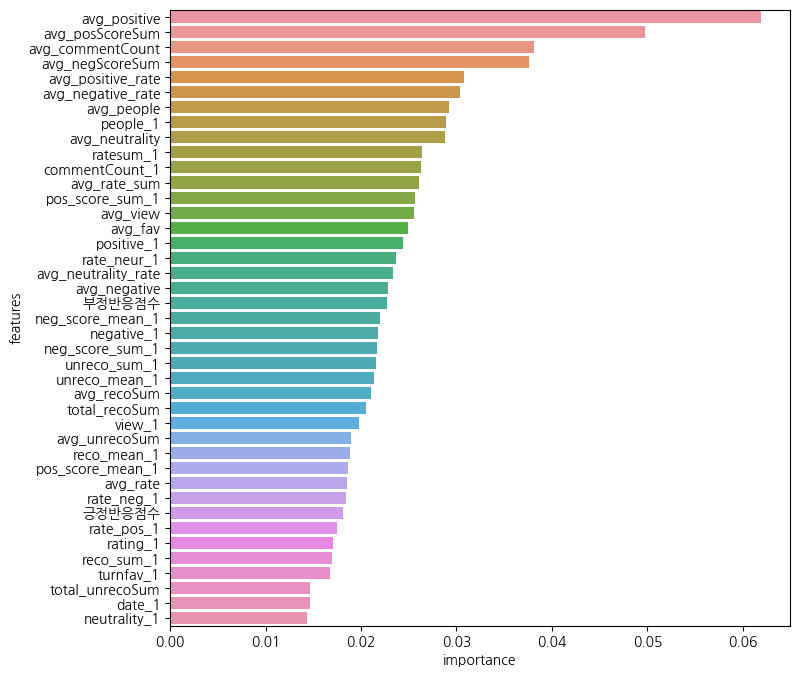

In [76]:
base_model_RF = RandomForestClassifier(random_state=42)
y_pred_base_RF = base_model_RF.fit(X_train, y_train).predict(X_test)

print("accuracy_score :", accuracy_score(y_pred_base_RF, y_test))
print("recall_score :", recall_score(y_pred_base_RF, y_test))
print("f1 score :", f1_score(y_pred_base_RF, y_test))

plot = pd.DataFrame(list(zip(base_model_RF.feature_names_in_, base_model_RF.feature_importances_)), 
                  columns = ["features", "importance"]).sort_values('importance', ascending=False)

plt.figure(figsize= (8,8))
sns.barplot(plot, x = 'importance', y = 'features')

### Randomized Search CV

Fitting 5 folds for each of 1000 candidates, totalling 5000 fits


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_min_samples_leaf,param_max_leaf_nodes,param_max_depth,param_criterion,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
188,0.216554,0.004262,0.015971,0.002613,3,29,110,gini,"{'min_samples_leaf': 3, 'max_leaf_nodes': 29, ...",0.736842,0.671053,0.723684,0.733333,0.653333,0.703649,0.034579,1
355,0.253853,0.041002,0.018352,0.004789,3,29,98,gini,"{'min_samples_leaf': 3, 'max_leaf_nodes': 29, ...",0.736842,0.671053,0.723684,0.733333,0.653333,0.703649,0.034579,1
344,0.250281,0.086561,0.024106,0.019695,3,29,101,gini,"{'min_samples_leaf': 3, 'max_leaf_nodes': 29, ...",0.736842,0.671053,0.723684,0.733333,0.653333,0.703649,0.034579,1


RandomForestClassifier(max_depth=110, max_leaf_nodes=29, min_samples_leaf=3,
                       random_state=42)
accuracy_score : 0.6105263157894737
recall_score : 0.6226415094339622
f1 score : 0.6407766990291262


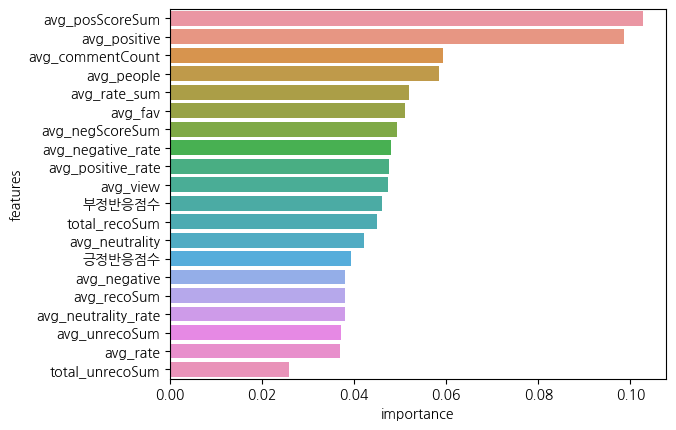

In [67]:
param_distributions = {
    'criterion': ['gini', 'entropy'],
    'max_depth': range(104, 116),
    'max_leaf_nodes' : range(23, 35),
    'min_samples_leaf' : range(2, 5)
}

RF_randomCV = RandomizedSearchCV(base_model_RF, param_distributions=param_distributions, n_iter=1000, n_jobs= -1, cv = 5, verbose=2) 
RF_randomCV.fit(X_train, y_train)
display(pd.DataFrame(RF_randomCV.cv_results_).sort_values('rank_test_score')[:3])

best_Random_RF = RF_randomCV.best_estimator_
print(best_Random_RF)
y_pred_RF = best_Random_RF.predict(X_test)

print("accuracy_score :", accuracy_score(y_pred_RF, y_test))
print("recall_score :", recall_score(y_pred_RF, y_test))
print("f1 score :", f1_score(y_pred_RF, y_test))

RF = pd.DataFrame(list(zip(best_Random_RF.feature_names_in_, best_Random_RF.feature_importances_)), 
                  columns = ["features", "importance"]).sort_values('importance', ascending=False)

# plt.figure(figsize= (8, 15))
sns.barplot(RF, x = 'importance', y = 'features');

### Grid Search CV

Fitting 5 folds for each of 864 candidates, totalling 4320 fits


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_criterion,param_max_depth,param_max_leaf_nodes,param_min_samples_leaf,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
235,0.251472,0.036767,0.018154,0.003147,gini,110,29,3,"{'criterion': 'gini', 'max_depth': 110, 'max_l...",0.736842,0.671053,0.723684,0.733333,0.653333,0.703649,0.034579,1
415,0.280836,0.075819,0.018649,0.005721,gini,115,29,3,"{'criterion': 'gini', 'max_depth': 115, 'max_l...",0.736842,0.671053,0.723684,0.733333,0.653333,0.703649,0.034579,1
19,0.280835,0.034727,0.019542,0.005402,gini,104,29,3,"{'criterion': 'gini', 'max_depth': 104, 'max_l...",0.736842,0.671053,0.723684,0.733333,0.653333,0.703649,0.034579,1


RandomForestClassifier(max_depth=104, max_leaf_nodes=29, min_samples_leaf=3,
                       random_state=42)
accuracy_score : 0.6105263157894737
recall_score : 0.6226415094339622
f1 score : 0.6407766990291262


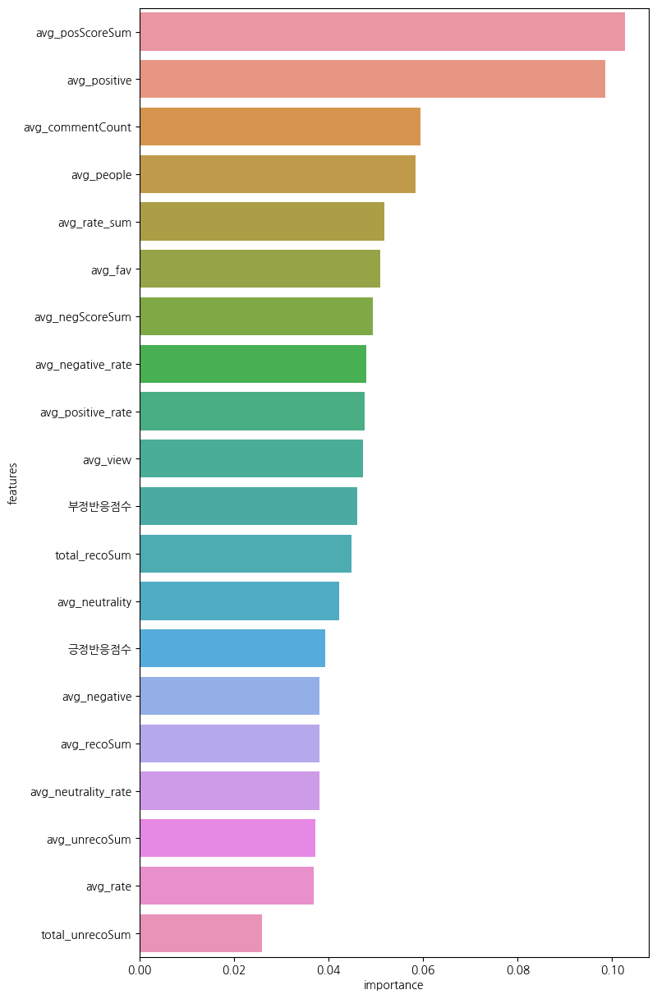

In [68]:
param_distributions = {
    'criterion': ['gini', 'entropy'],
    'max_depth': range(104, 116),
    'max_leaf_nodes' : range(23, 35),
    'min_samples_leaf' : range(2, 5)
}

RF_GridCV = GridSearchCV(base_model_RF, param_grid=param_distributions, n_jobs= -1, cv = 5, verbose=2) 
RF_GridCV.fit(X_train, y_train)
display(pd.DataFrame(RF_GridCV.cv_results_).sort_values('rank_test_score')[:3])

best_Grid_RF = RF_GridCV.best_estimator_
print(best_Grid_RF)
y_pred_RF_Grid = best_Grid_RF.predict(X_test)

print("accuracy_score :", accuracy_score(y_pred_RF_Grid, y_test))
print("recall_score :", recall_score(y_pred_RF_Grid, y_test))
print("f1 score :", f1_score(y_pred_RF_Grid, y_test))

RF = pd.DataFrame(list(zip(best_Grid_RF.feature_names_in_, best_Grid_RF.feature_importances_)), 
                  columns = ["features", "importance"]).sort_values('importance', ascending=False)

plt.figure(figsize= (8,15))
sns.barplot(RF, x = 'importance', y = 'features');

### Tuning with Optuna

[I 2023-01-04 03:10:01,054] A new study created in memory with name: no-name-e490e13e-c36b-42e3-b943-6c96b67017cd
[I 2023-01-04 03:10:12,153] Trial 0 finished with value: 0.7369512195121951 and parameters: {'max_depth': 72, 'max_leaf_nodes': 512, 'min_samples_leaf': 14, 'n_estimators': 734}. Best is trial 0 with value: 0.7369512195121951.
[I 2023-01-04 03:10:16,376] Trial 1 finished with value: 0.7223170731707317 and parameters: {'max_depth': 50, 'max_leaf_nodes': 876, 'min_samples_leaf': 50, 'n_estimators': 828}. Best is trial 0 with value: 0.7369512195121951.
[I 2023-01-04 03:10:21,345] Trial 2 finished with value: 0.7270731707317074 and parameters: {'max_depth': 88, 'max_leaf_nodes': 546, 'min_samples_leaf': 53, 'n_estimators': 993}. Best is trial 0 with value: 0.7369512195121951.
[I 2023-01-04 03:10:22,590] Trial 3 finished with value: 0.726951219512195 and parameters: {'max_depth': 5, 'max_leaf_nodes': 739, 'min_samples_leaf': 91, 'n_estimators': 183}. Best is trial 0 with value: 

RandomForestClassifier(max_depth=6, max_leaf_nodes=280, n_estimators=423,
                       n_jobs=-1, random_state=42)
accuracy_score : 0.6210526315789474
recall_score : 0.6296296296296297
f1 score : 0.6538461538461539


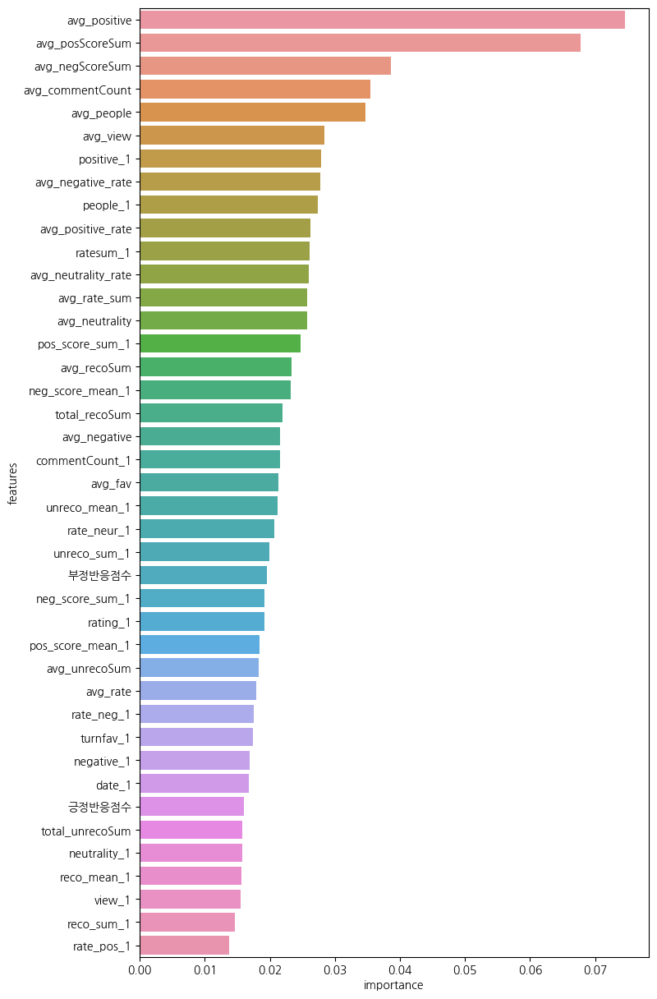

In [35]:
def RF_objective(trial):
    max_depth = trial.suggest_int('max_depth', 1, 100)
    max_leaf_nodes = trial.suggest_int('max_leaf_nodes', 2, 1000)
    min_samples_leaf = trial.suggest_int('min_samples_leaf', 1, 100)
    n_estimators =  trial.suggest_int('n_estimators', 100, 1000)
   
    model = RandomForestClassifier(max_depth = max_depth, max_leaf_nodes = max_leaf_nodes, n_estimators = n_estimators, n_jobs=-1, random_state=42)

    
    model.fit(X_train, y_train)    
    score = cross_val_score(model, X_train, y_train, cv=5, scoring="recall")
    recall_mean = score.mean()

    return recall_mean
    
#Execute optuna and set hyperparameters
RF_study = optuna.create_study(direction='maximize')
RF_study.optimize(RF_objective, n_trials=1000)

#Create an instance with tuned hyperparameters
optimized_RF = RandomForestClassifier(max_depth = RF_study.best_params['max_depth'], max_leaf_nodes = RF_study.best_params['max_leaf_nodes'],
                                      n_estimators = RF_study.best_params['n_estimators'],n_jobs= -1, random_state=42)

y_pred_RF_op = optimized_RF.fit(X_train, y_train).predict(X_test)

print(optimized_RF)
print("accuracy_score :", accuracy_score(y_pred_RF_op, y_test))
print("recall_score :", recall_score(y_pred_RF_op, y_test))
print("f1 score :", f1_score(y_pred_RF_op, y_test))

RF = pd.DataFrame(list(zip(optimized_RF.feature_names_in_, optimized_RF.feature_importances_)), 
                  columns = ["features", "importance"]).sort_values('importance', ascending=False)

plt.figure(figsize= (8,15))
sns.barplot(RF, x = 'importance', y = 'features');

## Train model - XGBoost

### Tunining with Optuna

[I 2023-01-04 03:56:28,536] A new study created in memory with name: no-name-6b9b4b3d-cb8f-47c8-85a3-977eaf0e791c
[I 2023-01-04 03:56:30,729] Trial 0 finished with value: 0.6915853658536586 and parameters: {'max_depth': 3, 'n_estimators': 413}. Best is trial 0 with value: 0.6915853658536586.
[I 2023-01-04 03:56:31,702] Trial 1 finished with value: 0.6573170731707317 and parameters: {'max_depth': 7, 'n_estimators': 160}. Best is trial 0 with value: 0.6915853658536586.
[I 2023-01-04 03:56:34,004] Trial 2 finished with value: 0.6421951219512195 and parameters: {'max_depth': 10, 'n_estimators': 455}. Best is trial 0 with value: 0.6915853658536586.
[I 2023-01-04 03:56:35,119] Trial 3 finished with value: 0.6767073170731707 and parameters: {'max_depth': 3, 'n_estimators': 206}. Best is trial 0 with value: 0.6915853658536586.
[I 2023-01-04 03:56:36,095] Trial 4 finished with value: 0.6521951219512194 and parameters: {'max_depth': 4, 'n_estimators': 153}. Best is trial 0 with value: 0.69158536

accuracy_score : 0.6421052631578947
recall_score : 0.6538461538461539
f1 score : 0.6666666666666666


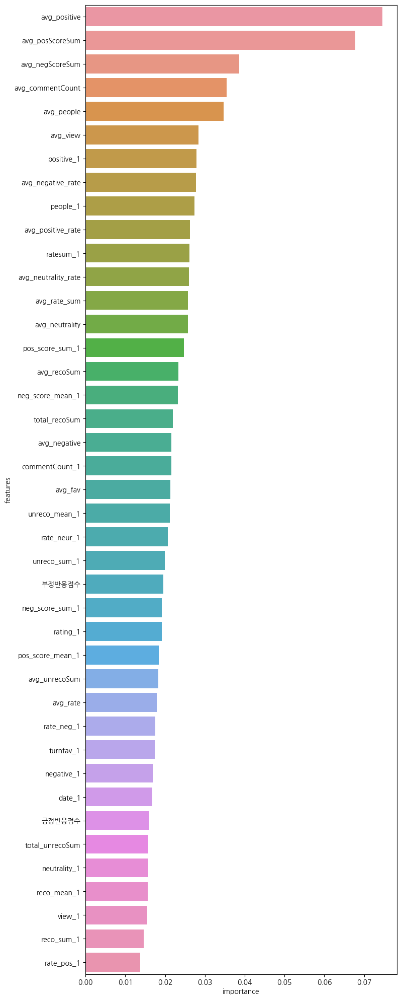

In [36]:
def RF_objective(trial):
    max_depth = trial.suggest_int('max_depth', 1, 10)
    n_estimators =  trial.suggest_int('n_estimators', 100, 500)
   
    model = xgb.XGBClassifier(max_depth = max_depth, n_estimators = n_estimators, n_jobs=-1, random_state=42)

    
    model.fit(X_train, y_train)    
    score = cross_val_score(model, X_train, y_train, cv=5, scoring="recall")
    recall_mean = score.mean()

    return recall_mean
    
#Execute optuna and set hyperparameters
xgb_study = optuna.create_study(direction='maximize')
xgb_study.optimize(RF_objective, n_trials=100)

#Create an instance with tuned hyperparameters
optimized_xgb = xgb.XGBClassifier(max_depth = xgb_study.best_params['max_depth'], n_estimators = xgb_study.best_params['n_estimators'],n_jobs= -1, random_state=42)

y_pred_RF_xgb = optimized_xgb.fit(X_train, y_train).predict(X_test)

print("accuracy_score :", accuracy_score(y_pred_RF_xgb, y_test))
print("recall_score :", recall_score(y_pred_RF_xgb, y_test))
print("f1 score :", f1_score(y_pred_RF_xgb, y_test))

RF = pd.DataFrame(list(zip(optimized_RF.feature_names_in_, optimized_RF.feature_importances_)), 
                  columns = ["features", "importance"]).sort_values('importance', ascending=False)

plt.figure(figsize= (8,25))
sns.barplot(RF, x = 'importance', y = 'features');

## Train Model - Catboost

### Tuning with optuna

In [60]:
def RF_objective(trial):
    max_depth = trial.suggest_int('max_depth', 1, 10)
    n_estimators =  trial.suggest_int('n_estimators', 100, 500)
   
    model = cb.CatBoostClassifier(max_depth = max_depth, n_estimators = n_estimators, random_state=42)

    
    model.fit(X_train, y_train)    
    score = cross_val_score(model, X_train, y_train, cv=5, scoring="recall")
    recall_mean = score.mean()

    return recall_mean
    
#Execute optuna and set hyperparameters
cb_study = optuna.create_study(direction='maximize')
cb_study.optimize(RF_objective, n_trials= 3)

#Create an instance with tuned hyperparameters
optimized_cb = cb.CatBoostClassifier(max_depth = cb_study.best_params['max_depth'], n_estimators = cb_study.best_params['n_estimators'], random_state=42, verbose=0)

y_pred_RF_cb = optimized_cb.fit(X_train, y_train).predict(X_test)

print("accuracy_score :", accuracy_score(y_pred_RF_cb, y_test))
print("recall_score :", recall_score(y_pred_RF_cb, y_test))
print("f1 score :", f1_score(y_pred_RF_cb, y_test))

# RF = pd.DataFrame(list(zip(optimized_cb.feature_names_in_, optimized_cb.feature_importances_)), 
#                   columns = ["features", "importance"]).sort_values('importance', ascending=False)

# plt.figure(figsize= (8,30))
# sns.barplot(RF, x = 'importance', y = 'features');

[I 2023-01-04 13:58:15,077] A new study created in memory with name: no-name-1c93bebe-e5df-410f-8d32-1f5d5b6635dd


Learning rate set to 0.022747
0:	learn: 0.6828320	total: 240ms	remaining: 1m 4s
1:	learn: 0.6742385	total: 473ms	remaining: 1m 2s
2:	learn: 0.6655979	total: 715ms	remaining: 1m 3s
3:	learn: 0.6557925	total: 966ms	remaining: 1m 3s
4:	learn: 0.6473727	total: 1.2s	remaining: 1m 3s
5:	learn: 0.6363941	total: 1.44s	remaining: 1m 2s
6:	learn: 0.6272542	total: 1.68s	remaining: 1m 2s
7:	learn: 0.6167141	total: 1.92s	remaining: 1m 2s
8:	learn: 0.6088825	total: 2.16s	remaining: 1m 2s
9:	learn: 0.5999376	total: 2.43s	remaining: 1m 2s
10:	learn: 0.5914526	total: 2.67s	remaining: 1m 2s
11:	learn: 0.5847036	total: 2.92s	remaining: 1m 2s
12:	learn: 0.5750091	total: 3.17s	remaining: 1m 2s
13:	learn: 0.5680035	total: 3.42s	remaining: 1m 2s
14:	learn: 0.5604565	total: 3.66s	remaining: 1m 1s
15:	learn: 0.5562277	total: 3.91s	remaining: 1m 1s
16:	learn: 0.5493440	total: 4.19s	remaining: 1m 1s
17:	learn: 0.5433558	total: 4.45s	remaining: 1m 1s
18:	learn: 0.5368935	total: 4.73s	remaining: 1m 1s
19:	learn: 0

[I 2023-01-04 14:04:42,401] Trial 0 finished with value: 0.7265853658536585 and parameters: {'max_depth': 10, 'n_estimators': 268}. Best is trial 0 with value: 0.7265853658536585.


267:	learn: 0.0965912	total: 1m 4s	remaining: 0us
Learning rate set to 0.031641
0:	learn: 0.6893315	total: 1.34ms	remaining: 250ms
1:	learn: 0.6847146	total: 2.71ms	remaining: 250ms
2:	learn: 0.6804316	total: 3.9ms	remaining: 239ms
3:	learn: 0.6763420	total: 5.04ms	remaining: 231ms
4:	learn: 0.6721913	total: 6.08ms	remaining: 221ms
5:	learn: 0.6690433	total: 7.01ms	remaining: 211ms
6:	learn: 0.6656596	total: 7.9ms	remaining: 203ms
7:	learn: 0.6630435	total: 8.88ms	remaining: 199ms
8:	learn: 0.6595176	total: 9.8ms	remaining: 194ms
9:	learn: 0.6588061	total: 10.9ms	remaining: 192ms
10:	learn: 0.6575041	total: 11.8ms	remaining: 189ms
11:	learn: 0.6557324	total: 12.7ms	remaining: 185ms
12:	learn: 0.6539205	total: 13.6ms	remaining: 183ms
13:	learn: 0.6526037	total: 15ms	remaining: 186ms
14:	learn: 0.6514017	total: 16.1ms	remaining: 185ms
15:	learn: 0.6491433	total: 17.2ms	remaining: 183ms
16:	learn: 0.6476551	total: 18.4ms	remaining: 184ms
17:	learn: 0.6455313	total: 19.6ms	remaining: 184ms

[I 2023-01-04 14:04:44,547] Trial 1 finished with value: 0.7464634146341462 and parameters: {'max_depth': 1, 'n_estimators': 187}. Best is trial 1 with value: 0.7464634146341462.


Learning rate set to 0.050628
0:	learn: 0.6786202	total: 5.76ms	remaining: 640ms
1:	learn: 0.6691479	total: 10.3ms	remaining: 566ms
2:	learn: 0.6608364	total: 15.4ms	remaining: 559ms
3:	learn: 0.6539758	total: 20.9ms	remaining: 564ms
4:	learn: 0.6420615	total: 25.7ms	remaining: 551ms
5:	learn: 0.6361133	total: 32.7ms	remaining: 578ms
6:	learn: 0.6256295	total: 37.8ms	remaining: 567ms
7:	learn: 0.6192703	total: 42ms	remaining: 546ms
8:	learn: 0.6085381	total: 47.4ms	remaining: 542ms
9:	learn: 0.6005075	total: 52.4ms	remaining: 534ms
10:	learn: 0.5933979	total: 58ms	remaining: 533ms
11:	learn: 0.5876802	total: 64.9ms	remaining: 541ms
12:	learn: 0.5827698	total: 69.9ms	remaining: 532ms
13:	learn: 0.5758235	total: 74.1ms	remaining: 519ms
14:	learn: 0.5698946	total: 78.6ms	remaining: 508ms
15:	learn: 0.5642721	total: 83.8ms	remaining: 503ms
16:	learn: 0.5586917	total: 88.8ms	remaining: 496ms
17:	learn: 0.5511269	total: 93.1ms	remaining: 486ms
18:	learn: 0.5442899	total: 97.2ms	remaining: 47

[I 2023-01-04 14:04:48,940] Trial 2 finished with value: 0.7364634146341463 and parameters: {'max_depth': 5, 'n_estimators': 112}. Best is trial 1 with value: 0.7464634146341462.


102:	learn: 0.2760369	total: 549ms	remaining: 48ms
103:	learn: 0.2742648	total: 555ms	remaining: 42.7ms
104:	learn: 0.2720977	total: 560ms	remaining: 37.3ms
105:	learn: 0.2702528	total: 566ms	remaining: 32ms
106:	learn: 0.2678022	total: 570ms	remaining: 26.7ms
107:	learn: 0.2664935	total: 578ms	remaining: 21.4ms
108:	learn: 0.2646565	total: 583ms	remaining: 16ms
109:	learn: 0.2625239	total: 588ms	remaining: 10.7ms
110:	learn: 0.2615304	total: 593ms	remaining: 5.34ms
111:	learn: 0.2600275	total: 597ms	remaining: 0us
accuracy_score : 0.6
recall_score : 0.625
f1 score : 0.6122448979591836


## Train model - LightGBM

### Tuning with Optuna

In [38]:
def RF_objective(trial):
    max_depth = trial.suggest_int('max_depth', 1, 10)
    n_estimators =  trial.suggest_int('n_estimators', 100, 500)
   
    model = lgbm.LGBMClassifier(max_depth = max_depth, n_estimators = n_estimators, random_state=42)

    
    model.fit(X_train, y_train)    
    score = cross_val_score(model, X_train, y_train, cv=5, scoring="recall")
    recall_mean = score.mean()

    return recall_mean
    
#Execute optuna and set hyperparameters
lgbm_study = optuna.create_study(direction='maximize')
lgbm_study.optimize(RF_objective, n_trials= 50)

#Create an instance with tuned hyperparameters
optimized_lgbm = cb.CatBoostClassifier(max_depth = lgbm_study.best_params['max_depth'], n_estimators = lgbm_study.best_params['n_estimators'], random_state=42)

y_pred_RF_lgbm = optimized_lgbm.fit(X_train, y_train).predict(X_test)

print("accuracy_score :", accuracy_score(y_pred_RF_lgbm, y_test))
print("recall_score :", recall_score(y_pred_RF_lgbm, y_test))
print("f1 score :", f1_score(y_pred_RF_lgbm, y_test))

RF = pd.DataFrame(list(zip(optimized_lgbm.feature_names_in_, optimized_lgbm.feature_importances_)), 
                  columns = ["features", "importance"]).sort_values('importance', ascending=False)

plt.figure(figsize= (8,30))
sns.barplot(RF, x = 'importance', y = 'features');

[I 2023-01-04 04:00:29,131] A new study created in memory with name: no-name-0beff3a3-739b-4f3c-a2d3-29aa0e0298e2
[I 2023-01-04 04:00:29,853] Trial 0 finished with value: 0.6920731707317073 and parameters: {'max_depth': 7, 'n_estimators': 267}. Best is trial 0 with value: 0.6920731707317073.
[I 2023-01-04 04:00:30,823] Trial 1 finished with value: 0.6915853658536586 and parameters: {'max_depth': 8, 'n_estimators': 433}. Best is trial 0 with value: 0.6920731707317073.
[I 2023-01-04 04:00:31,112] Trial 2 finished with value: 0.7267073170731708 and parameters: {'max_depth': 7, 'n_estimators': 120}. Best is trial 2 with value: 0.7267073170731708.
[I 2023-01-04 04:00:31,330] Trial 3 finished with value: 0.751219512195122 and parameters: {'max_depth': 3, 'n_estimators': 135}. Best is trial 3 with value: 0.751219512195122.
[I 2023-01-04 04:00:31,600] Trial 4 finished with value: 0.6868292682926829 and parameters: {'max_depth': 5, 'n_estimators': 114}. Best is trial 3 with value: 0.75121951219

Learning rate set to 0.037362
0:	learn: 0.6882756	total: 1.55ms	remaining: 240ms
1:	learn: 0.6828268	total: 2.98ms	remaining: 229ms
2:	learn: 0.6793967	total: 4.39ms	remaining: 224ms
3:	learn: 0.6749567	total: 5.86ms	remaining: 223ms
4:	learn: 0.6714189	total: 7.33ms	remaining: 221ms
5:	learn: 0.6681137	total: 8.59ms	remaining: 215ms
6:	learn: 0.6641071	total: 9.91ms	remaining: 211ms
7:	learn: 0.6601124	total: 11.1ms	remaining: 206ms
8:	learn: 0.6566597	total: 12.4ms	remaining: 202ms
9:	learn: 0.6537492	total: 13.6ms	remaining: 198ms
10:	learn: 0.6514619	total: 14.8ms	remaining: 195ms
11:	learn: 0.6489348	total: 16.1ms	remaining: 193ms
12:	learn: 0.6455884	total: 17.5ms	remaining: 192ms
13:	learn: 0.6418110	total: 18.8ms	remaining: 191ms
14:	learn: 0.6387292	total: 20.1ms	remaining: 189ms
15:	learn: 0.6354302	total: 21.4ms	remaining: 187ms
16:	learn: 0.6329992	total: 22.6ms	remaining: 185ms
17:	learn: 0.6303689	total: 23.9ms	remaining: 183ms
18:	learn: 0.6286479	total: 25.3ms	remaining

AttributeError: 'CatBoostClassifier' object has no attribute 'feature_names_in_'

# 5회차 보정 진행

In [5]:
five_div = pd.read_csv("G:/내 드라이브/Project/FINAL/data_preprocessing/0102기준_모델링파일/total_episode_5_divided_by_date(from_20221226).csv")
five_div

,id,view_1,date_1,rating_1,people_1,turnfav_1,commentCount_1,reco_sum_1,reco_mean_1,unreco_sum_1,...,neg_score_mean_5,negative_5,neutrality_5,positive_5,rate_neg_5,rate_neur_5,rate_pos_5,new_keyword,긍정반응점수,부정반응점수
0,15067,134.253521,355,0.027296,0.873239,0.859155,0.169014,0.847887,0.014371,0.056338,...,0.000609,0.006579,0.059211,0.023026,0.000244,0.002193,0.000853,정식연재,584,199
1,32937,1.146303,5639,0.001702,0.099131,0.003724,0.065260,0.015783,0.000086,0.001773,...,0.000048,0.001607,0.006606,0.009106,0.000006,0.000026,0.000035,"마지막화,에필로그,완결",132,16
2,50004,0.089538,6165,0.001118,0.009246,0.000162,0.005028,0.006488,0.000209,0.006975,...,0.000010,0.000162,0.001462,0.003899,0.000005,0.000043,0.000115,"마지막화,에필로그,완결",24,21
3,50196,1.467711,5172,0.001875,0.186195,0.007154,0.086427,0.088747,0.000199,0.002127,...,0.000009,0.000773,0.014695,0.016628,0.000005,0.000089,0.000100,"마지막화,에필로그,완결",615,52
4,53694,9.658085,5127,0.001882,0.316364,0.030037,0.242442,0.197972,0.000160,0.026526,...,0.000017,0.011150,0.082746,0.107003,0.000011,0.000081,0.000104,"마지막화,에필로그,완결",2670,260
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
538,792936,169.044280,271,0.026347,1.697417,0.911439,0.332103,5.793358,0.073334,1.464945,...,0.000494,0.000000,0.037037,0.065844,0.000000,0.001425,0.002532,"마지막화,에필로그,완결",1652,862
539,792942,32.714286,273,0.029341,0.446886,0.150183,0.076923,0.391941,0.019597,0.249084,...,0.000000,0.000000,0.032653,0.000000,0.000000,0.004082,0.000000,"마지막화,에필로그,완결",132,96
540,793203,126.429104,268,0.036754,1.007463,0.824627,0.104478,1.182836,0.042244,0.063433,...,0.000245,0.000000,0.008333,0.062500,0.000000,0.000490,0.003676,"마지막화,에필로그,완결",668,88
541,796167,338.928934,197,0.049898,3.959391,2.238579,0.147208,2.588832,0.089270,0.182741,...,0.001047,0.000000,0.041885,0.036649,0.000000,0.002792,0.002443,정식연재,1382,136


## EDA

In [134]:
five_div.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 543 entries, 0 to 542
Columns: 104 entries, id to 부정반응점수
dtypes: float64(95), int64(8), object(1)
memory usage: 441.3+ KB


In [135]:
five_div.describe()

,id,view_1,date_1,rating_1,people_1,turnfav_1,commentCount_1,reco_sum_1,reco_mean_1,unreco_sum_1,...,neg_score_sum_5,neg_score_mean_5,negative_5,neutrality_5,positive_5,rate_neg_5,rate_neur_5,rate_pos_5,긍정반응점수,부정반응점수
count,543.000000,543.000000,543.000000,543.000000,543.000000,543.000000,543.000000,543.000000,543.000000,543.000000,...,543.000000,543.000000,543.000000,543.000000,543.000000,543.000000,543.000000,543.000000,543.00000,543.000000
mean,607125.532228,60.135524,2400.773481,0.006511,0.478577,0.289260,0.059228,0.873777,0.009205,0.077219,...,0.007135,0.000136,0.002527,0.014550,0.021165,0.000044,0.000248,0.000427,4124.41989,906.683241
std,186361.515577,85.225567,1295.280318,0.006564,0.522326,0.471593,0.074215,1.649452,0.011030,0.402158,...,0.011367,0.000211,0.004423,0.028003,0.032999,0.000074,0.000334,0.000644,8879.76731,2247.584367
min,15067.000000,0.034052,162.000000,0.001118,0.009246,0.000000,0.003489,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.00000,0.000000
25%,572484.500000,7.102883,1302.500000,0.002898,0.185233,0.045622,0.019522,0.110739,0.002052,0.009030,...,0.001578,0.000038,0.000410,0.003922,0.006029,0.000008,0.000104,0.000148,463.50000,56.000000
50%,676323.000000,32.855082,2278.000000,0.004251,0.317780,0.132377,0.035290,0.325048,0.006627,0.024236,...,0.003704,0.000077,0.001209,0.007378,0.011364,0.000023,0.000156,0.000235,1438.00000,239.000000
75%,725477.500000,79.033631,3360.000000,0.007486,0.558901,0.332760,0.063526,0.857630,0.012434,0.063526,...,0.007984,0.000152,0.002791,0.014540,0.022455,0.000052,0.000266,0.000453,4045.50000,712.500000
max,797703.000000,655.413903,6165.000000,0.053548,3.959391,4.878505,0.578104,14.859813,0.089270,8.982232,...,0.107143,0.002232,0.039686,0.398818,0.392857,0.000617,0.004082,0.008185,91899.00000,23671.000000


<AxesSubplot: >

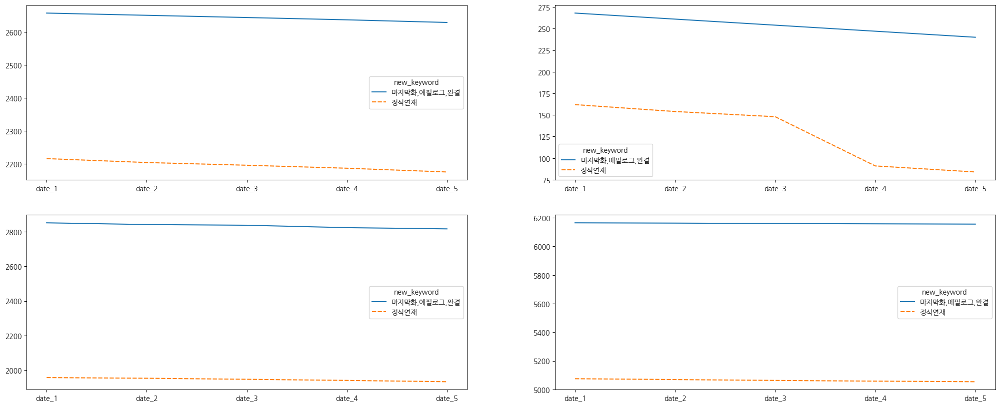

In [136]:
five_date_avg = five_div.groupby("new_keyword")[["date_1", "date_2", "date_3", "date_4", "date_5"]].mean().T
five_date_min = five_div.groupby("new_keyword")[["date_1", "date_2", "date_3", "date_4", "date_5"]].min().T
five_date_mid = five_div.groupby("new_keyword")[["date_1", "date_2", "date_3", "date_4", "date_5"]].median().T
five_date_max = five_div.groupby("new_keyword")[["date_1", "date_2", "date_3", "date_4", "date_5"]].max().T

fig, ax = plt.subplots(figsize = (25,10), nrows=2, ncols=2)
sns.lineplot(five_date_avg, ax = ax[0][0])
sns.lineplot(five_date_min, ax = ax[0][1])
sns.lineplot(five_date_mid, ax = ax[1][0])
sns.lineplot(five_date_max, ax = ax[1][1])

<AxesSubplot: >

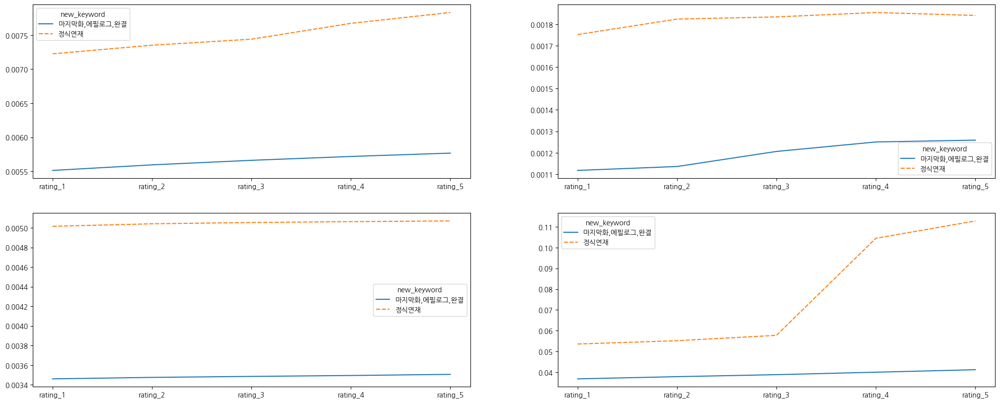

In [137]:
five_rating_avg = five_div.groupby("new_keyword")[["rating_1", "rating_2", "rating_3", "rating_4", "rating_5"]].mean().T
five_rating_min = five_div.groupby("new_keyword")[["rating_1", "rating_2", "rating_3", "rating_4", "rating_5"]].min().T
five_rating_mid = five_div.groupby("new_keyword")[["rating_1", "rating_2", "rating_3", "rating_4", "rating_5"]].median().T
five_rating_max = five_div.groupby("new_keyword")[["rating_1", "rating_2", "rating_3", "rating_4", "rating_5"]].max().T

fig, ax = plt.subplots(figsize = (25,10), nrows=2, ncols=2)
sns.lineplot(five_rating_avg, ax = ax[0][0])
sns.lineplot(five_rating_min, ax = ax[0][1])
sns.lineplot(five_rating_mid, ax = ax[1][0])
sns.lineplot(five_rating_max, ax = ax[1][1])

<AxesSubplot: >

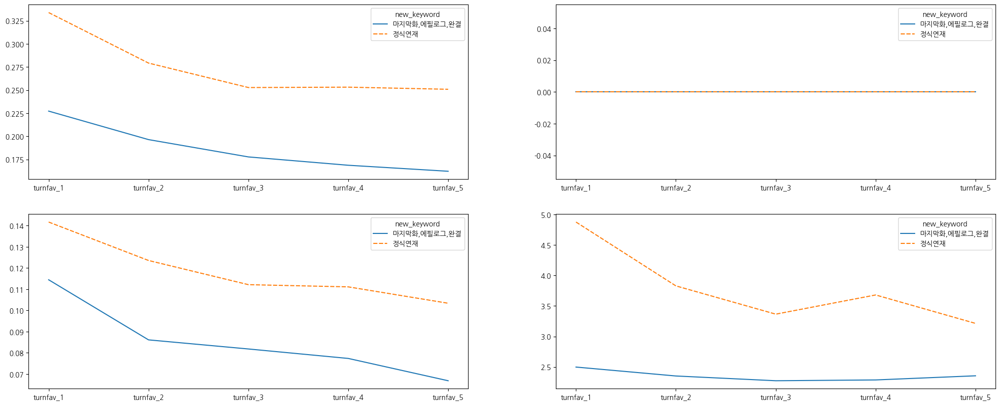

In [138]:
five_turnfav_avg = five_div.groupby("new_keyword")[["turnfav_1", "turnfav_2", "turnfav_3", "turnfav_4", "turnfav_5"]].mean().T
five_turnfav_min = five_div.groupby("new_keyword")[["turnfav_1", "turnfav_2", "turnfav_3", "turnfav_4", "turnfav_5"]].min().T
five_turnfav_mid = five_div.groupby("new_keyword")[["turnfav_1", "turnfav_2", "turnfav_3", "turnfav_4", "turnfav_5"]].median().T
five_turnfav_max = five_div.groupby("new_keyword")[["turnfav_1", "turnfav_2", "turnfav_3", "turnfav_4", "turnfav_5"]].max().T

fig, ax = plt.subplots(figsize = (25,10), nrows=2, ncols=2)
sns.lineplot(five_turnfav_avg, ax = ax[0][0])
sns.lineplot(five_turnfav_min, ax = ax[0][1])
sns.lineplot(five_turnfav_mid, ax = ax[1][0])
sns.lineplot(five_turnfav_max, ax = ax[1][1])

<AxesSubplot: >

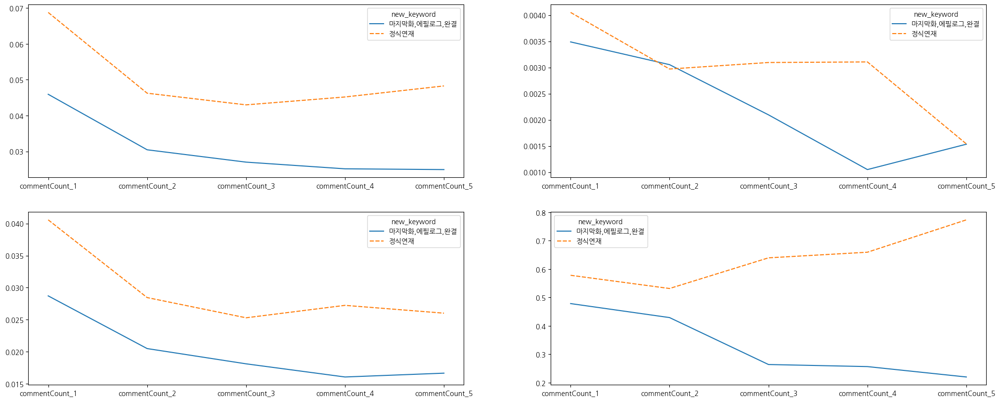

In [139]:
five_commentCount_avg = five_div.groupby("new_keyword")[["commentCount_1", "commentCount_2", "commentCount_3", "commentCount_4", "commentCount_5"]].mean().T
five_commentCount_min = five_div.groupby("new_keyword")[["commentCount_1", "commentCount_2", "commentCount_3", "commentCount_4", "commentCount_5"]].min().T
five_commentCount_mid = five_div.groupby("new_keyword")[["commentCount_1", "commentCount_2", "commentCount_3", "commentCount_4", "commentCount_5"]].median().T
five_commentCount_max = five_div.groupby("new_keyword")[["commentCount_1", "commentCount_2", "commentCount_3", "commentCount_4", "commentCount_5"]].max().T

fig, ax = plt.subplots(figsize = (25,10), nrows=2, ncols=2)
sns.lineplot(five_commentCount_avg, ax = ax[0][0])
sns.lineplot(five_commentCount_min, ax = ax[0][1])
sns.lineplot(five_commentCount_mid, ax = ax[1][0])
sns.lineplot(five_commentCount_max, ax = ax[1][1])

## feature

### feature engineering

In [162]:
# Making average columns

df_average(five_div)

In [164]:
# change column name
five_div = five_div.rename(columns = {"new_keyword" : "label"})

In [165]:
# encoding label
five_div.label = five_div.label.replace({"정식연재" : 1, "마지막화,에필로그,완결" : 0})
five_div.label

0      1
1      0
2      0
3      0
4      0
      ..
538    0
539    0
540    0
541    1
542    1
Name: label, Length: 543, dtype: int64

In [163]:
five_div_columns = five_div.columns.tolist()
len(five_div_columns)

121

In [166]:
# only include episode 1 & episode 1~5 avg columns

five_new_col = []

for i in five_div_columns:
    if "1" in i:
        five_new_col.append(i)
    elif "2" in i:
        continue
    elif "3" in i:
        continue
    elif "4" in i:
        continue
    elif "5" in i:
        continue
    else:
        five_new_col.append(i)
        
len(five_new_col)

41

### feature selection

In [176]:
label = "label"
# features = five_div.columns.drop(label) # using all columns
features = five_div[five_new_col].drop(columns=["id", "label"]).columns.tolist() # using five_new_col as features

## Split data

In [178]:
X = five_div[features]
y = five_div[label]

X_train, X_test, y_train, y_test = train_test_split(X, y, stratify = y, test_size= 0.2, random_state=42)
X_train.shape, X_test.shape, y_train.shape, y_test.shape

((434, 39), (109, 39), (434,), (109,))

## Train Model - Random Forest

### Base model

accuracy_score : 0.6697247706422018
recall_score : 0.68
f1 score : 0.7391304347826089


<AxesSubplot: xlabel='importance', ylabel='features'>

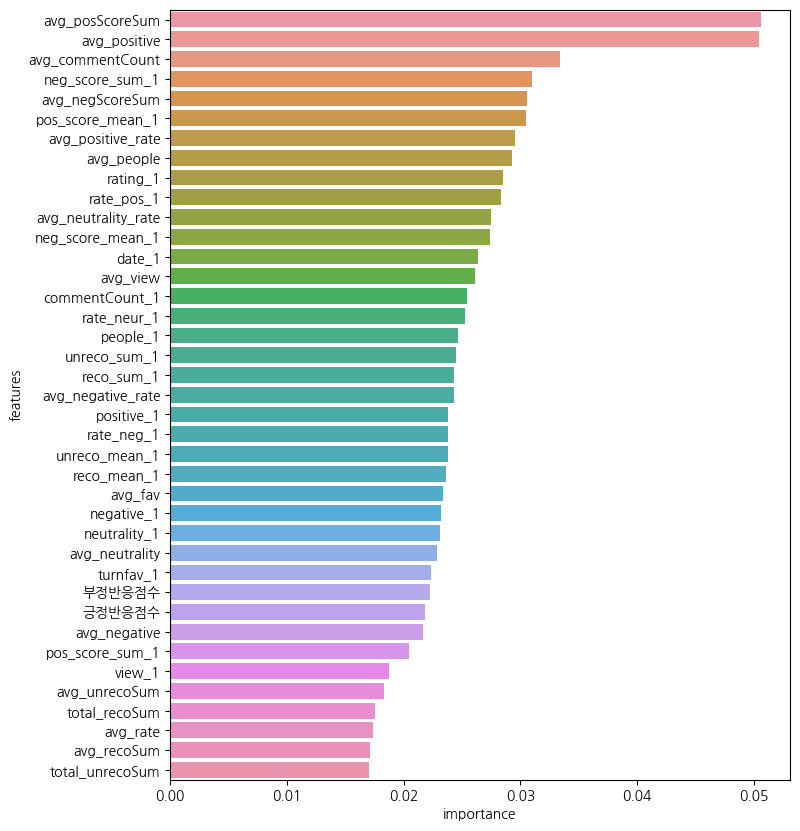

In [183]:
base_model_RF = RandomForestClassifier(random_state=42)
y_pred_base_RF = base_model_RF.fit(X_train, y_train).predict(X_test)

print("accuracy_score :", accuracy_score(y_pred_base_RF, y_test))
print("recall_score :", recall_score(y_pred_base_RF, y_test))
print("f1 score :", f1_score(y_pred_base_RF, y_test))

plot = pd.DataFrame(list(zip(base_model_RF.feature_names_in_, base_model_RF.feature_importances_)), 
                  columns = ["features", "importance"]).sort_values('importance', ascending=False)

plt.figure(figsize= (8,10));
sns.barplot(plot, x = 'importance', y = 'features')

### Randomized Search CV

Fitting 5 folds for each of 200 candidates, totalling 1000 fits


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_min_samples_leaf,param_max_leaf_nodes,param_max_depth,param_criterion,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
90,0.305139,0.040507,0.016368,0.002875,6,9,9,entropy,"{'min_samples_leaf': 6, 'max_leaf_nodes': 9, '...",0.643678,0.689655,0.678161,0.666667,0.593023,0.654237,0.034176,1
34,0.385491,0.061888,0.038787,0.017019,6,7,8,entropy,"{'min_samples_leaf': 6, 'max_leaf_nodes': 7, '...",0.632184,0.678161,0.689655,0.678161,0.581395,0.651911,0.040409,2
94,0.300477,0.030591,0.023907,0.014232,7,7,6,entropy,"{'min_samples_leaf': 7, 'max_leaf_nodes': 7, '...",0.620690,0.701149,0.678161,0.678161,0.581395,0.651911,0.044158,2


RandomForestClassifier(criterion='entropy', max_depth=9, max_leaf_nodes=9,
                       min_samples_leaf=6, random_state=42)
accuracy_score : 0.6330275229357798
recall_score : 0.6455696202531646
f1 score : 0.7183098591549295


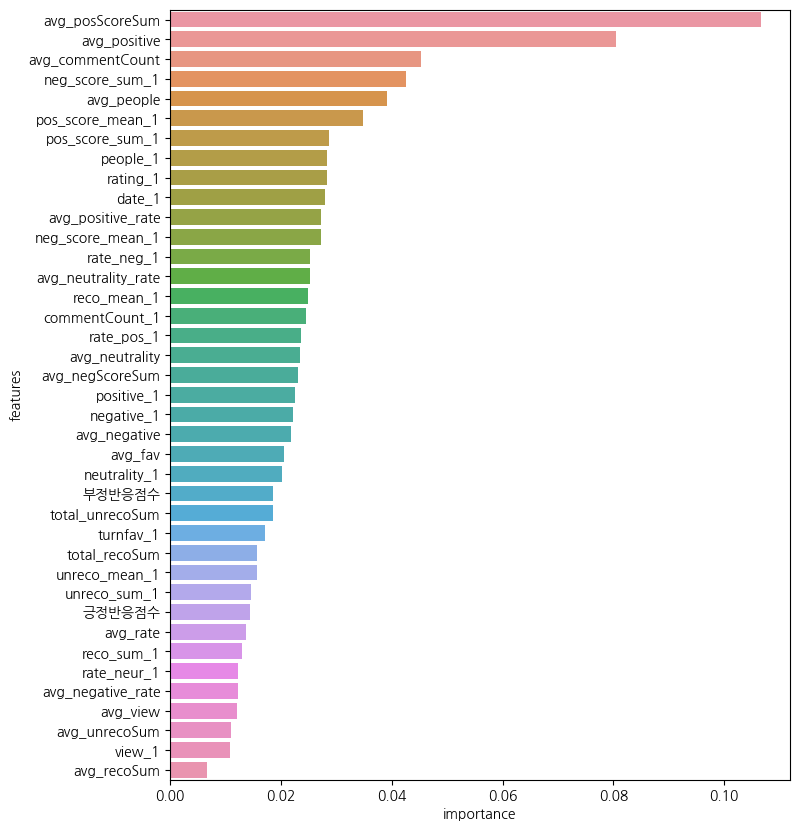

In [188]:
param_distributions = {
    'criterion': ['gini', 'entropy'],
    'max_depth': range(1, 10),
    'max_leaf_nodes' : range(3, 10, 2),
    'min_samples_leaf' : range(1, 10)
}

RF_randomCV = RandomizedSearchCV(base_model_RF, param_distributions=param_distributions, n_iter=200 , n_jobs= -1, cv = 5, verbose=2) 
RF_randomCV.fit(X_train, y_train)
display(pd.DataFrame(RF_randomCV.cv_results_).sort_values('rank_test_score')[:3])

best_Random_RF = RF_randomCV.best_estimator_
print(best_Random_RF)
y_pred_RF = best_Random_RF.predict(X_test)

print("accuracy_score :", accuracy_score(y_pred_RF, y_test))
print("recall_score :", recall_score(y_pred_RF, y_test))
print("f1 score :", f1_score(y_pred_RF, y_test))

RF = pd.DataFrame(list(zip(best_Random_RF.feature_names_in_, best_Random_RF.feature_importances_)), 
                  columns = ["features", "importance"]).sort_values('importance', ascending=False)

plt.figure(figsize= (8,10))
sns.barplot(RF, x = 'importance', y = 'features');

### Grid Search CV

Fitting 5 folds for each of 1680 candidates, totalling 8400 fits


,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_criterion,param_max_depth,param_max_leaf_nodes,param_min_samples_leaf,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
1679,0.285002,0.008663,0.014086,0.002579,entropy,14,13,14,"{'criterion': 'entropy', 'max_depth': 14, 'max...",0.655172,0.701149,0.678161,0.689655,0.581395,0.661107,0.042658,1
1595,0.308016,0.041415,0.017459,0.002458,entropy,13,13,14,"{'criterion': 'entropy', 'max_depth': 13, 'max...",0.655172,0.701149,0.678161,0.689655,0.581395,0.661107,0.042658,1
1259,0.298195,0.050995,0.020336,0.007697,entropy,9,13,14,"{'criterion': 'entropy', 'max_depth': 9, 'max_...",0.655172,0.701149,0.678161,0.689655,0.581395,0.661107,0.042658,1


RandomForestClassifier(criterion='entropy', max_depth=9, max_leaf_nodes=13,
                       min_samples_leaf=14, random_state=42)
accuracy_score : 0.6330275229357798
recall_score : 0.6493506493506493
f1 score : 0.7142857142857143


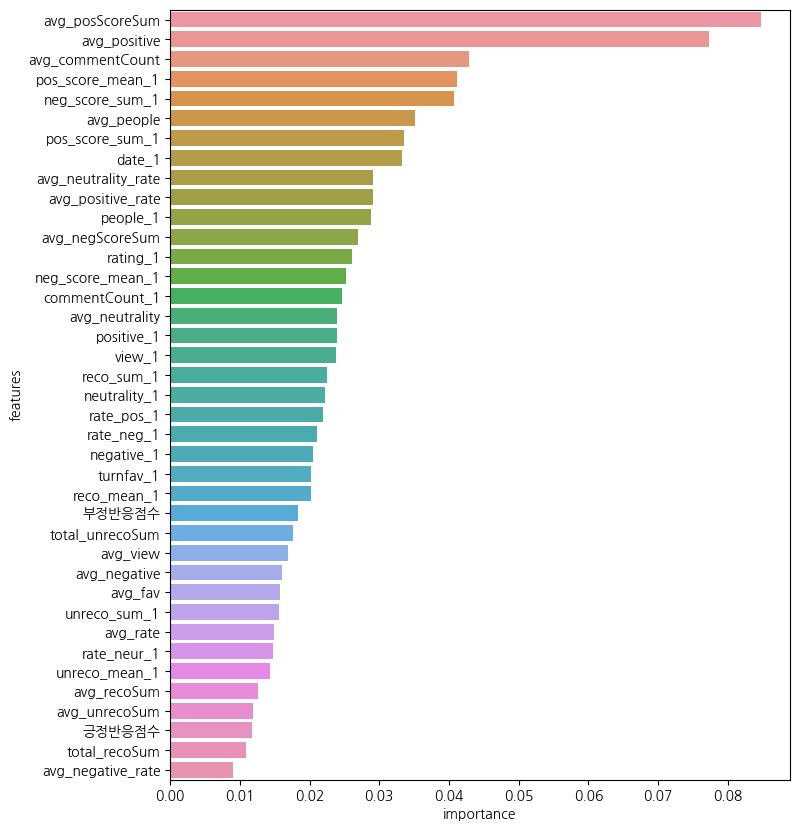

In [190]:
param_distributions = {
    'criterion': ['gini', 'entropy'],
    'max_depth': range(5, 15),
    'max_leaf_nodes' : range(3, 15, 2),
    'min_samples_leaf' : range(1, 15)
}

RF_GridCV = GridSearchCV(base_model_RF, param_grid=param_distributions, n_jobs= -1, cv = 5, verbose=2) 
RF_GridCV.fit(X_train, y_train)
display(pd.DataFrame(RF_GridCV.cv_results_).sort_values('rank_test_score')[:3])

best_Grid_RF = RF_GridCV.best_estimator_
print(best_Grid_RF)
y_pred_RF_Grid = best_Grid_RF.predict(X_test)

print("accuracy_score :", accuracy_score(y_pred_RF_Grid, y_test))
print("recall_score :", recall_score(y_pred_RF_Grid, y_test))
print("f1 score :", f1_score(y_pred_RF_Grid, y_test))

RF = pd.DataFrame(list(zip(best_Grid_RF.feature_names_in_, best_Grid_RF.feature_importances_)), 
                  columns = ["features", "importance"]).sort_values('importance', ascending=False)

plt.figure(figsize= (8,10))
sns.barplot(RF, x = 'importance', y = 'features');

### Tuning with Optuna

[I 2023-01-03 19:40:04,260] A new study created in memory with name: no-name-17aaf7a4-ef90-4172-9d76-f2030d531673
[I 2023-01-03 19:40:05,784] Trial 0 finished with value: 0.8181176470588236 and parameters: {'max_depth': 6, 'max_leaf_nodes': 407, 'n_estimators': 195}. Best is trial 0 with value: 0.8181176470588236.
[I 2023-01-03 19:40:07,414] Trial 1 finished with value: 0.7945882352941176 and parameters: {'max_depth': 10, 'max_leaf_nodes': 701, 'n_estimators': 186}. Best is trial 0 with value: 0.8181176470588236.
[I 2023-01-03 19:40:09,049] Trial 2 finished with value: 0.7865098039215687 and parameters: {'max_depth': 7, 'max_leaf_nodes': 851, 'n_estimators': 267}. Best is trial 0 with value: 0.8181176470588236.
[I 2023-01-03 19:40:11,199] Trial 3 finished with value: 0.8101176470588234 and parameters: {'max_depth': 4, 'max_leaf_nodes': 594, 'n_estimators': 258}. Best is trial 0 with value: 0.8181176470588236.
[I 2023-01-03 19:40:13,507] Trial 4 finished with value: 0.8022745098039215 a

accuracy_score : 0.6146788990825688
recall_score : 0.6153846153846154
f1 score : 0.7272727272727274


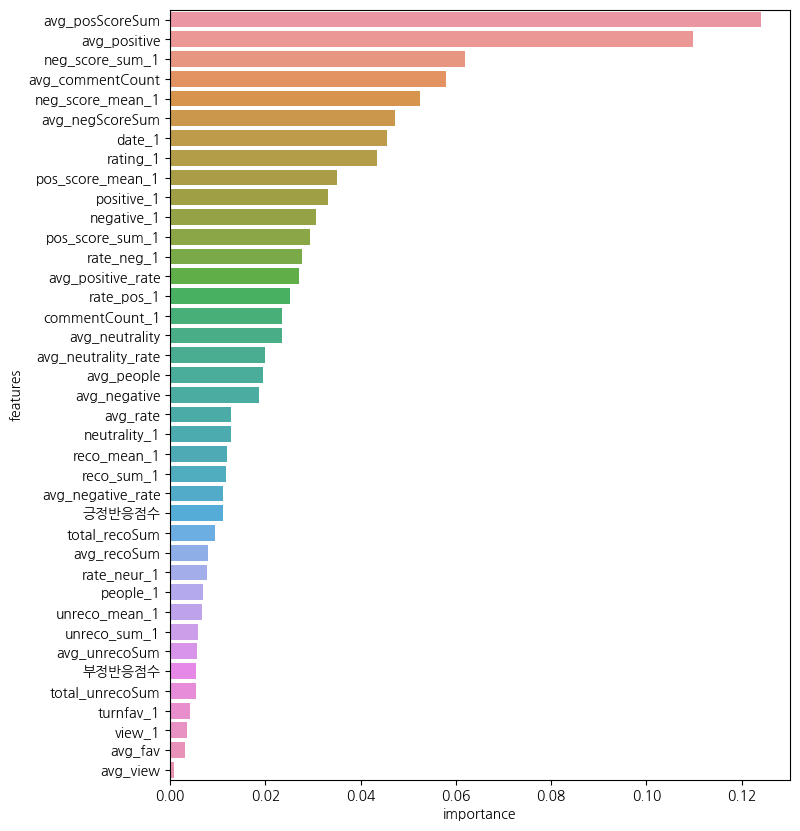

In [193]:
def RF_objective(trial):
    max_depth = trial.suggest_int('max_depth', 1, 10)
    max_leaf_nodes = trial.suggest_int('max_leaf_nodes', 2, 1000)
    n_estimators =  trial.suggest_int('n_estimators', 100, 500)
   
    model = RandomForestClassifier(max_depth = max_depth, max_leaf_nodes = max_leaf_nodes,n_estimators = n_estimators, n_jobs=-1, random_state=42)

    
    model.fit(X_train, y_train)    
    score = cross_val_score(model, X_train, y_train, cv=5, scoring="recall")
    recall_mean = score.mean()

    return recall_mean
    
#Execute optuna and set hyperparameters
RF_study = optuna.create_study(direction='maximize')
RF_study.optimize(RF_objective, n_trials=10)

#Create an instance with tuned hyperparameters
optimized_RF = RandomForestClassifier(max_depth = RF_study.best_params['max_depth'], max_leaf_nodes = RF_study.best_params['max_leaf_nodes'],
                                      n_estimators = RF_study.best_params['n_estimators'],n_jobs= -1, random_state=42)

y_pred_RF_op = optimized_RF.fit(X_train, y_train).predict(X_test)

print("accuracy_score :", accuracy_score(y_pred_RF_op, y_test))
print("recall_score :", recall_score(y_pred_RF_op, y_test))
print("f1 score :", f1_score(y_pred_RF_op, y_test))

RF = pd.DataFrame(list(zip(optimized_RF.feature_names_in_, optimized_RF.feature_importances_)), 
                  columns = ["features", "importance"]).sort_values('importance', ascending=False)

plt.figure(figsize= (8,10))
sns.barplot(RF, x = 'importance', y = 'features');